In [11]:
from sklearn import datasets, linear_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_curve, RocCurveDisplay
import numpy as np
from numpy import c_
import matplotlib.pyplot as plt
import time
import pandas as pd
import seaborn as sns
from abc import ABC, abstractmethod

noise = 16
seed = 244823
samples = 2423
classes = 2
train_split = 0.8
test_split = 0.2

In [12]:
class AbstractFunction(ABC):
    t = 0

    @abstractmethod
    def __call__(self, *args, **kwargs):
        raise NotImplementedError

    @abstractmethod
    def derivative(self, *args, **kwargs):
        raise NotImplementedError

    @abstractmethod
    def activate(self, *args, **kwargs):
        raise NotImplementedError


class Neuron:
    class Sigmoid(AbstractFunction):
        t = 0.5

        def __call__(self, x):
            return 1.0 / (1.0 + np.exp(-x))

        def derivative(self, x):
            return self(x) * (1 - self(x))

        def activate(self, x):
            return np.where(self.__call__(x) >= self.t, 1, 0)

    class Heaviside(AbstractFunction):
        def __call__(self, x):
            return np.heaviside(x, 1)

        def derivative(self, x):
            return np.ones_like(x)

        def activate(self, x):
            return np.where(self.__call__(x) > self.t, 1, 0)

    class Relu(AbstractFunction):
        t = 0.25

        def __call__(self, x):
            return x * (x > 0)

        def derivative(self, x):
            return (x > 0) * 1

        def activate(self, x):
            return np.where(self.__call__(x) > self.t, 1, 0)

    class LRelu(AbstractFunction):
        t = 0.25

        def __init__(self, alpha=0.01):
            self.alpha = alpha

        def __call__(self, x):
            return np.where(x > 0, x, x * 0.01)

        def derivative(self, x):
            return np.where(x > 0, 1, self.alpha)

        def activate(self, x):
            return np.where(self.__call__(x) >= self.t, 1, 0)

    class Signum(AbstractFunction):
        def __call__(self, x):
            return np.sign(x)

        def derivative(self, x):
            return np.zeros_like(x)

        def activate(self, x):
            return np.where(self.__call__(x) > self.t, 1, 0)

    class Sin(AbstractFunction):
        def __call__(self, x):
            return np.sin(x)

        def derivative(self, x):
            return np.cos(x)

        def activate(self, x):
            return np.where(self.__call__(x) >= self.t, 1, 0)

    class Tanh(AbstractFunction):
        def __call__(self, x):
            return np.tanh(x)

        def derivative(self, x):
            return 1 / (np.cosh(x) ** 2)

        def activate(self, x):
            return np.where(self.__call__(x) >= self.t, 1, 0)

    def __init__(self, activation_function, learning_rate, epochs, batchsize, dynamic_lr=False, min_lr=None,
                 max_lr=None) -> None:
        self.coef_ = None

        self.activation_function_name = activation_function
        self.learning_rate = learning_rate
        self.epochs = epochs
        self.batchsize = batchsize

        self.dynamic_lr = dynamic_lr
        self.min_lr = min_lr
        self.max_lr = max_lr

        func_dict = {
            'sigmoid': self.Sigmoid(),
            'heaviside': self.Heaviside(),
            'relu': self.Relu(),
            'lrelu': self.LRelu(),
            'signum': self.Signum(),
            'sin': self.Sin(),
            'tanh': self.Tanh()
        }

        self.activation_function = func_dict[activation_function]
        pass

    def fit(self, x, y):

        # np.random.seed(seed)
        if self.activation_function_name == 'signum' or self.activation_function_name == 'sin' or self.activation_function_name == 'tanh':
            y[y == 0] = -1
        y = y.reshape((-1, 1))
        m, n = x.shape

        self.coef_ = np.random.random(size=(1, x.shape[1] + 1))
        X_with_bias = np.column_stack((np.ones(shape=(m, 1)) * -1, x))

        batch = m - m % self.batchsize

        for epoch in (range(self.epochs)):

            if self.dynamic_lr:
                self.learning_rate = self.min_lr + (self.max_lr - self.min_lr) * (1 + np.cos(epoch / self.epochs * np.pi))

            indexes = np.arange(0, len(X_with_bias), 1)
            np.random.shuffle(indexes)
            X_trimmed = X_with_bias[indexes][:batch]
            y_trimmed = y[indexes][:batch]

            for i in range(0, batch, self.batchsize):
                X_batch = X_trimmed[i:i + self.batchsize]
                y_batch = y_trimmed[i:i + self.batchsize]

                pred = self.activation_function(X_batch @ self.coef_.T)
                dW = (y_batch - pred) * self.activation_function.derivative(X_batch @ self.coef_.T) * X_batch
                self.coef_ += self.learning_rate * dW.mean(axis=0)

    def predict(self, X) -> np.ndarray:
        X = np.column_stack((np.ones(shape=(X.shape[0], 1)) * -1, X))
        return self.activation_function.activate(X @ self.coef_.T)

    def decision_function(self, X) -> np.ndarray:
        X = np.column_stack((np.ones(shape=(X.shape[0], 1)) * -1, X))
        return self.activation_function(X @ self.coef_.T)

def show_result(model, x_train, y_train, x_test, y_test, plot_title, show_Plot=True):

    start = time.time()
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    endtime = (time.time() - start)

    fig, ax = plt.subplots(2, 2)
    fig.set_size_inches((15, 15))
    fig.suptitle(plot_title, fontsize=18)

    if show_Plot:
        mesh_data = c_[xx.ravel(), yy.ravel()]
        Z = np.asarray(model.predict(mesh_data)).reshape(xx.shape)

        ax[0][0].contourf(xx, yy, Z, alpha=0.6)
        ax[0][0].scatter(x_test[:, 0], x_test[:, 1], c=y_test)

        cm_model = confusion_matrix(y_test, y_pred)
        tn_model = cm_model[0][0]
        fn_model = cm_model[0][1]
        tp_model = cm_model[1][1]
        fp_model = cm_model[1][0]
        ConfusionMatrixDisplay(cm_model).plot(ax=ax[0][1], cmap='binary', colorbar=False)

        fpr, tpr, roc_auc = roc_curve(y_test, model.decision_function(x_test))

        rok_model = RocCurveDisplay(fpr=fpr, tpr=tpr)
        rok_model.plot(ax=ax[1][0], color='k')

        labels = ('Sensitivity', 'Specificity', 'Iteration time')
        y_pos = np.arange(len(labels))

        values = [
            tp_model / (tp_model + fn_model),
            tn_model / (tn_model + fp_model),
            endtime,
        ]

        bars = ax[1][1].bar(y_pos, values, align='center', color='k')
        ax[1][1].set_xticks(y_pos, labels=labels)
        ax[1][1].bar_label(bars)

        plt.show()

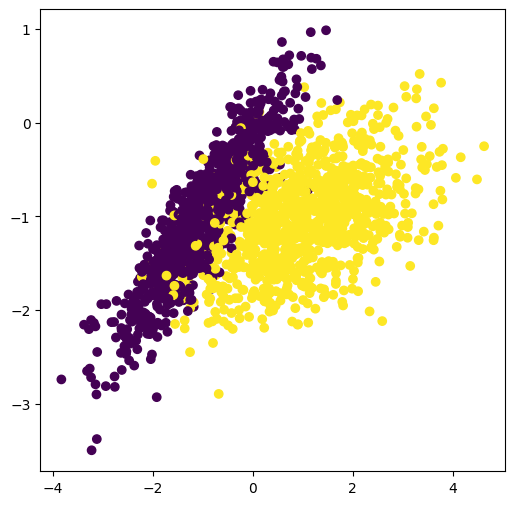

In [13]:
x, y = datasets.make_classification(n_features=2, random_state=seed, n_redundant=0, n_samples=samples, n_classes=2, n_clusters_per_class=1)

x_train, x_test, y_train, y_test = train_test_split(x, y, train_size=train_split, test_size=test_split, random_state=seed)

xx, yy = np.meshgrid(np.arange(x.min(), x.max()+0.1, 0.01),
                     np.arange(x.min(), x.max(), 0.01))

plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams['figure.figsize'] = [6, 6]
plt.scatter(x_train[:, 0], x_train[:, 1], c=y_train)
plt.show()

In [14]:
dynamic_learning = [False, True]
batches = [1, 100, samples]
method = ['sigmoid',
          'heaviside',
          'sin',
          'tanh',
          'signum',
          'relu',
          'lrelu']

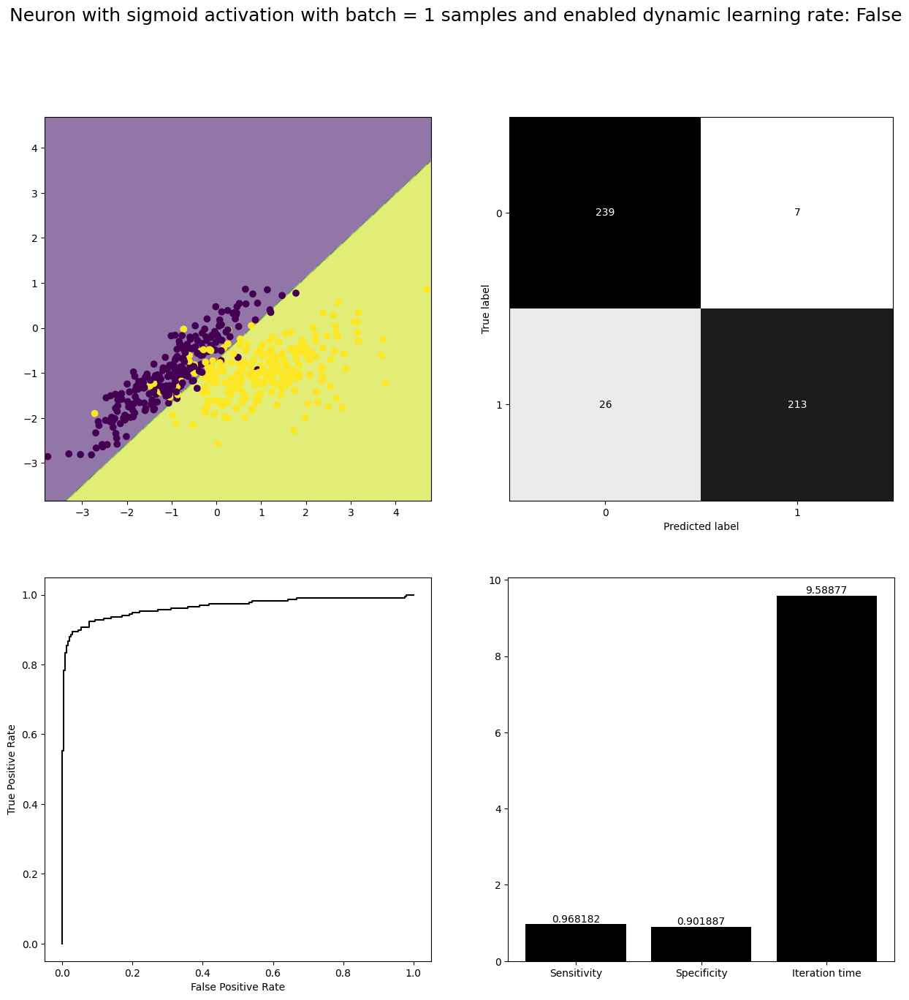

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


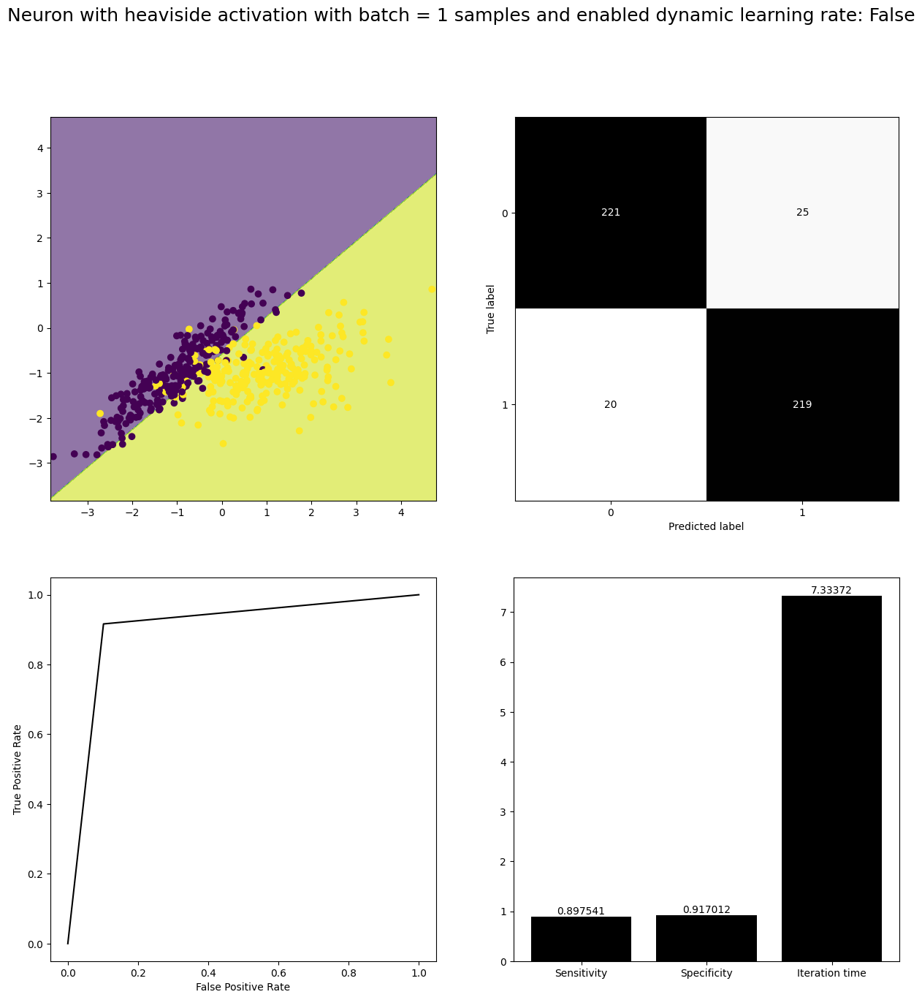

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


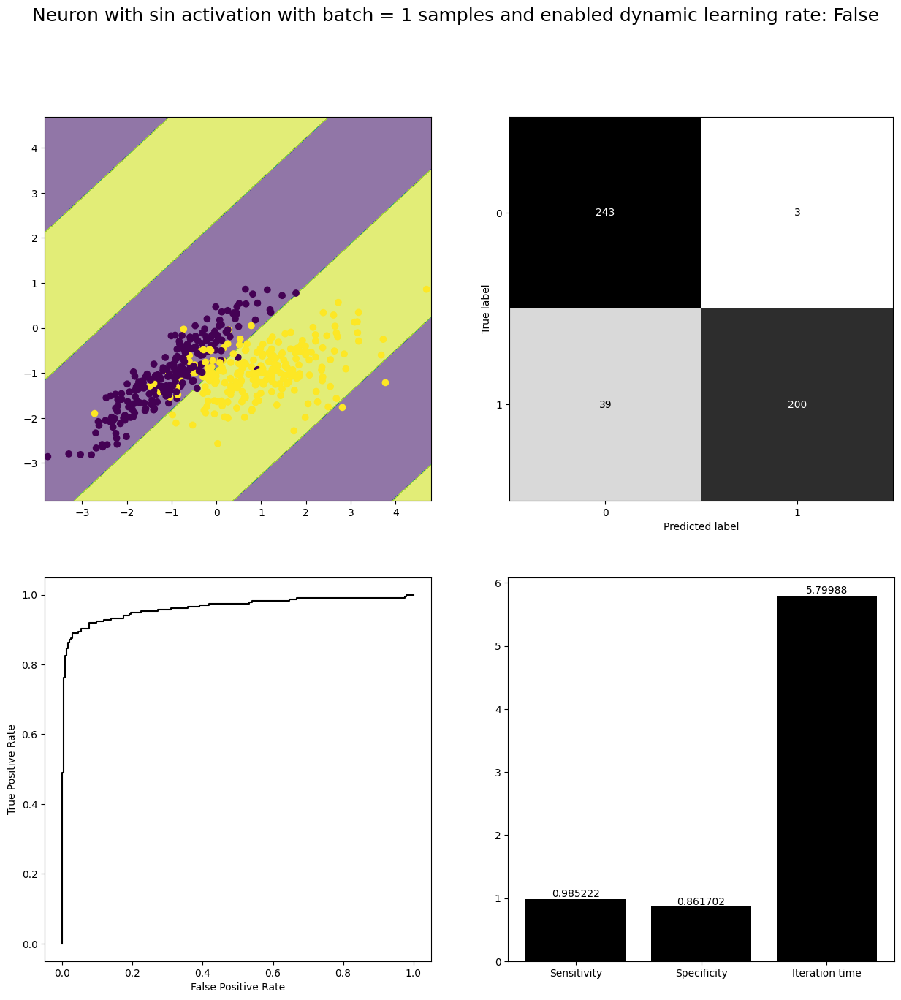

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


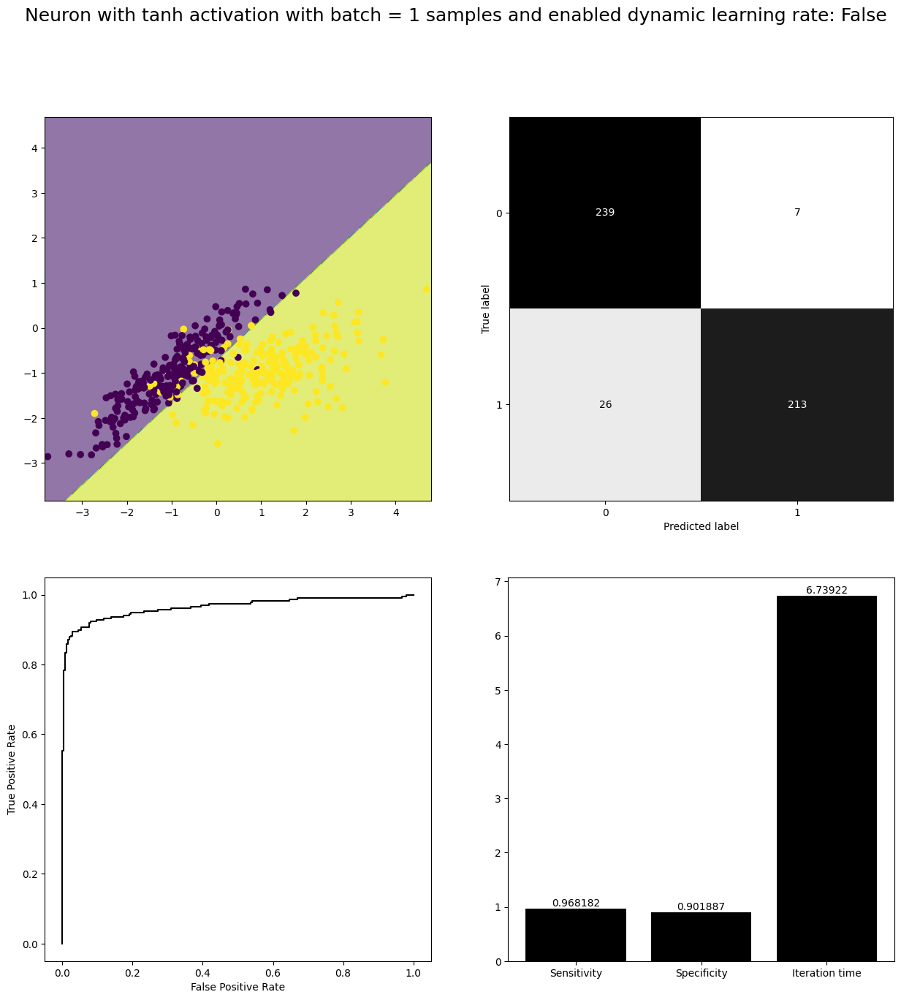

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


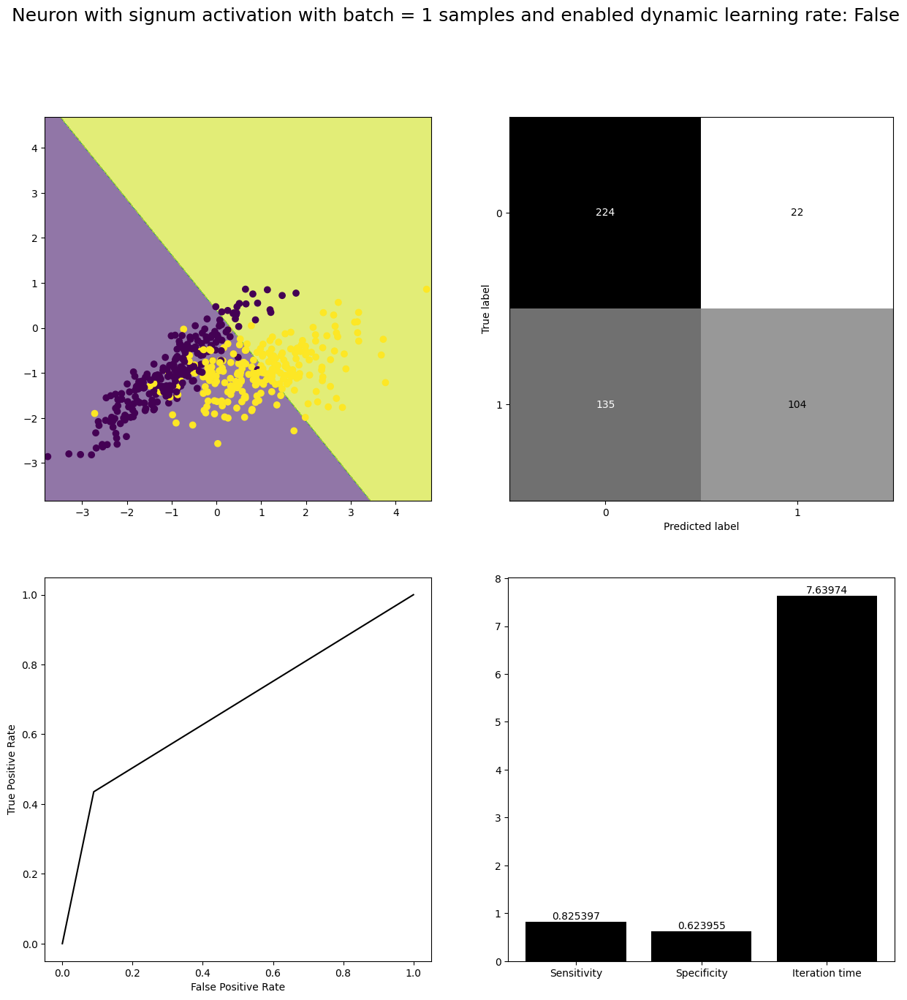

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


C:\Users\Jakub Kowalczewski\AppData\Local\Temp\ipykernel_11852\1018894150.py:196: RuntimeWarning: invalid value encountered in longlong_scalars
  tp_model / (tp_model + fn_model),


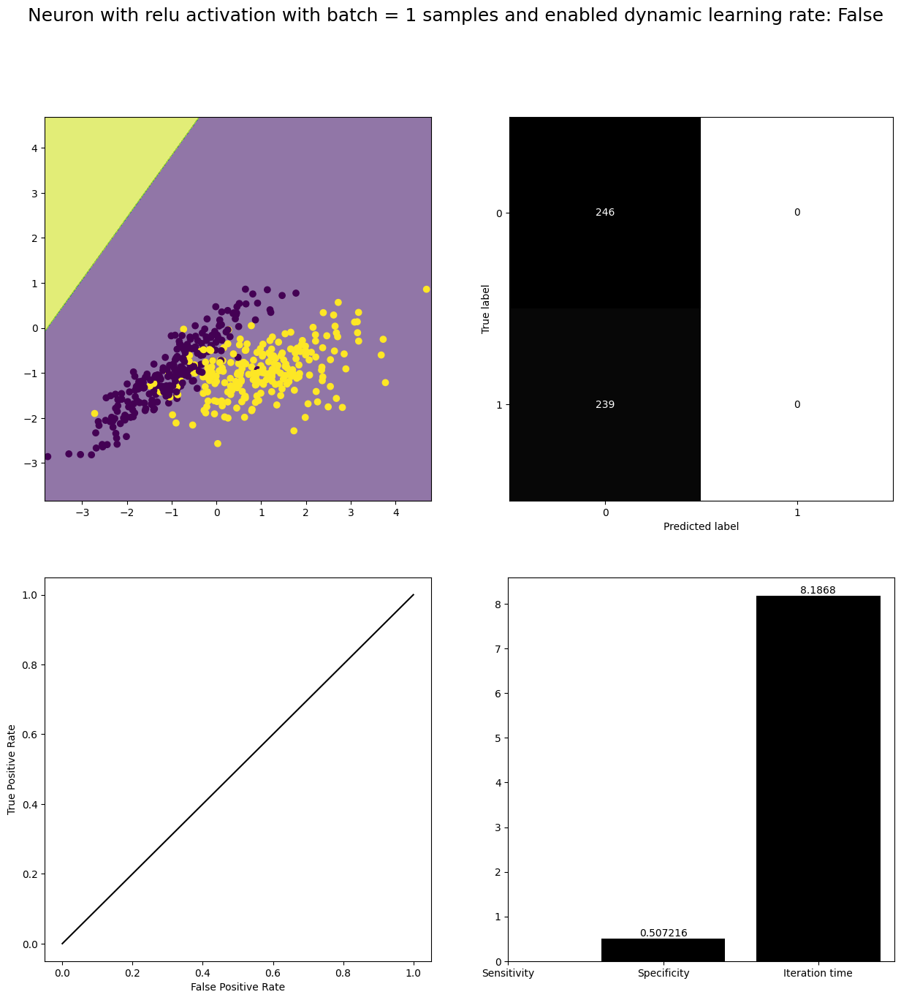

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


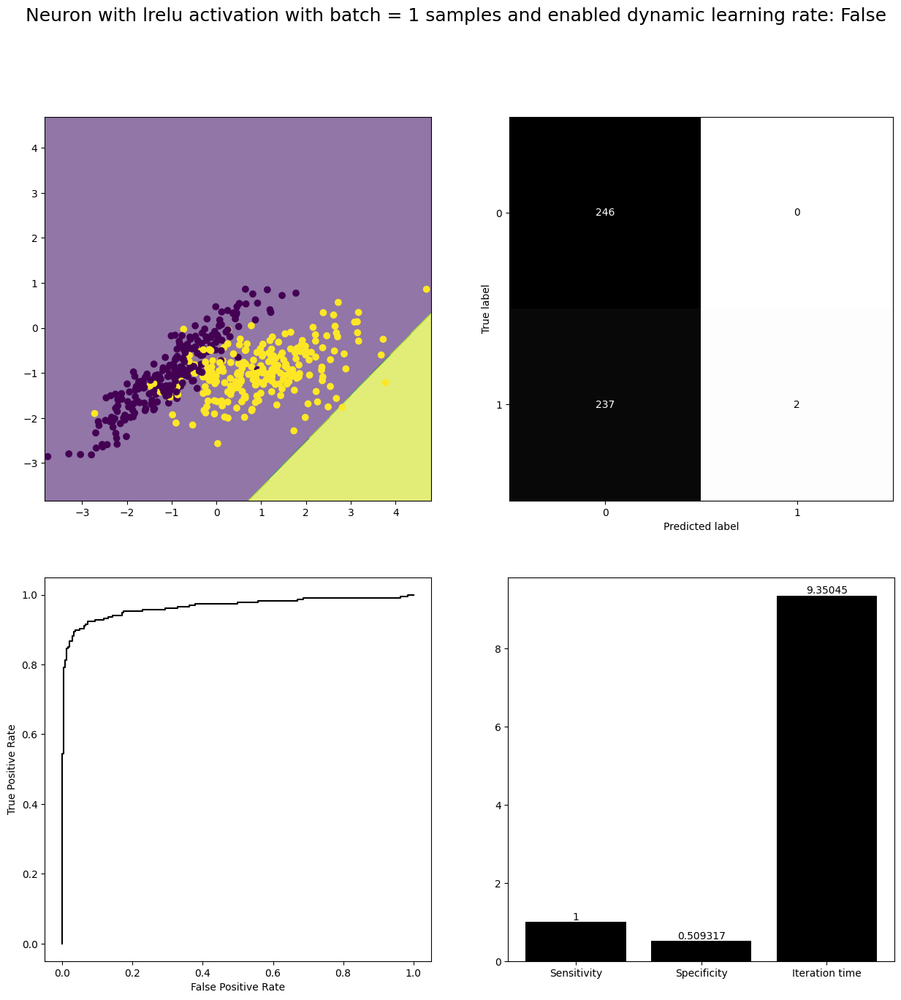

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


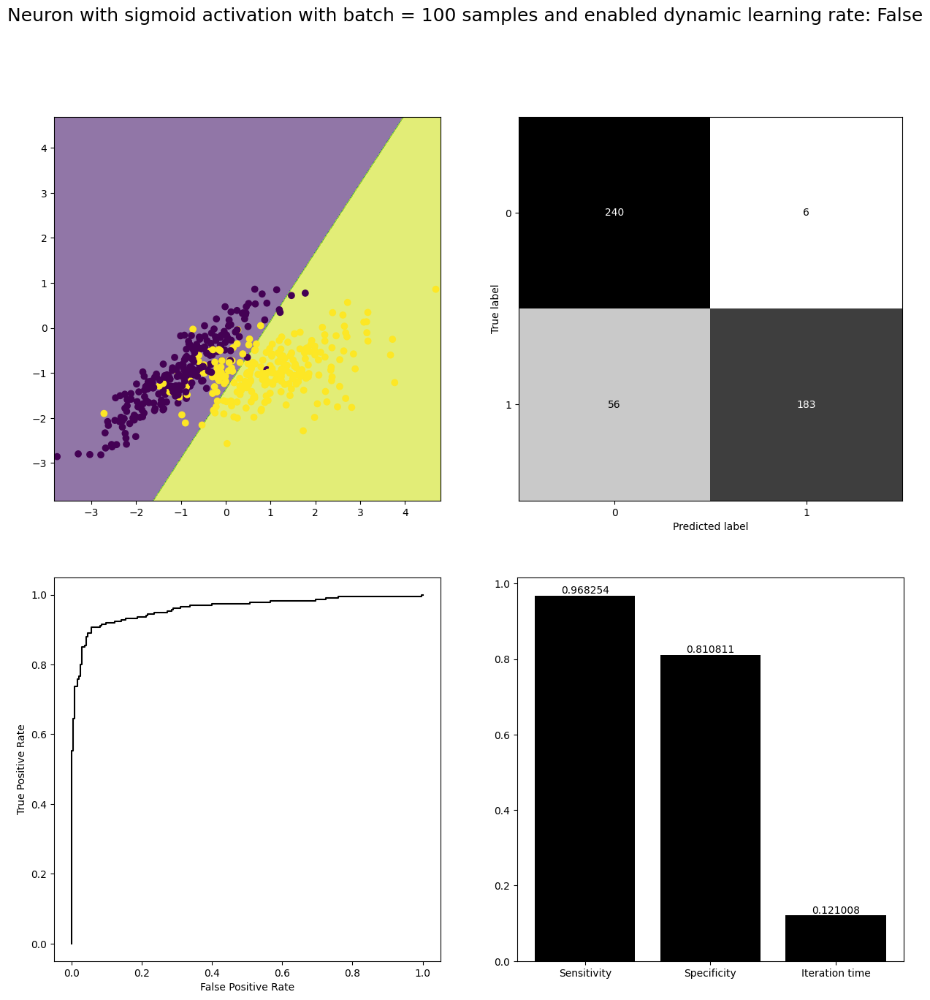

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


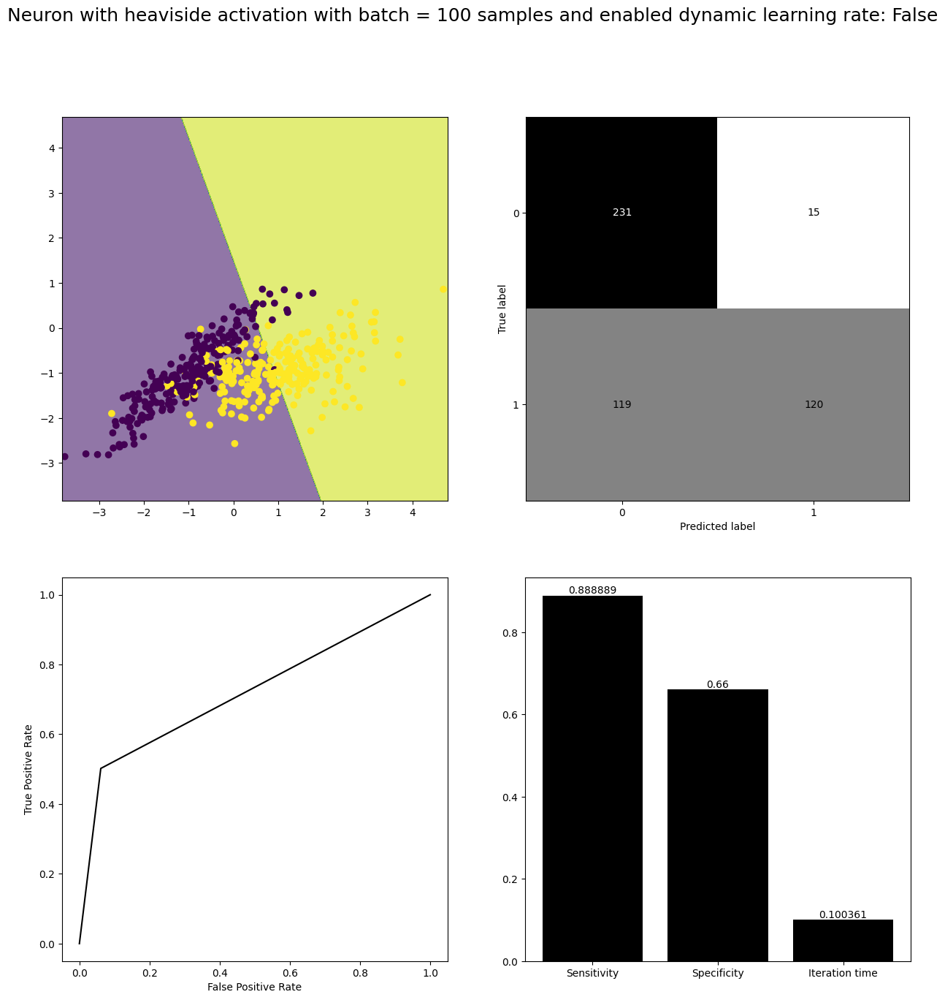

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


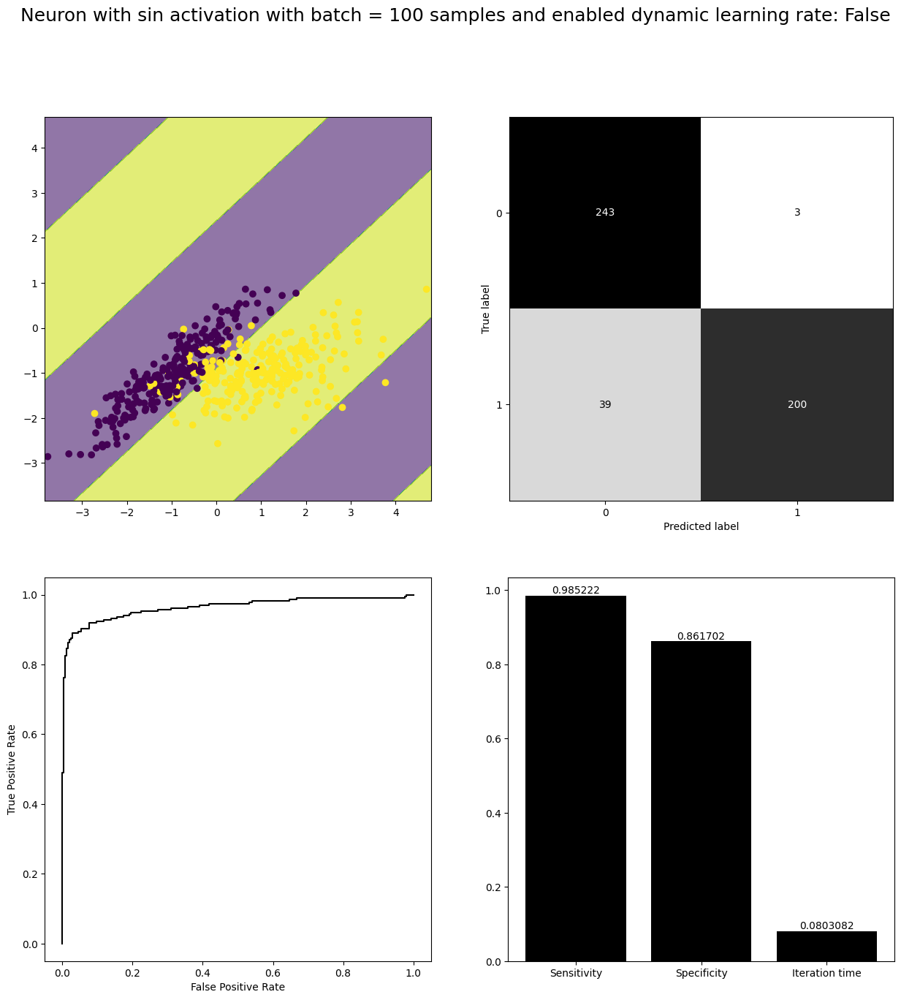

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


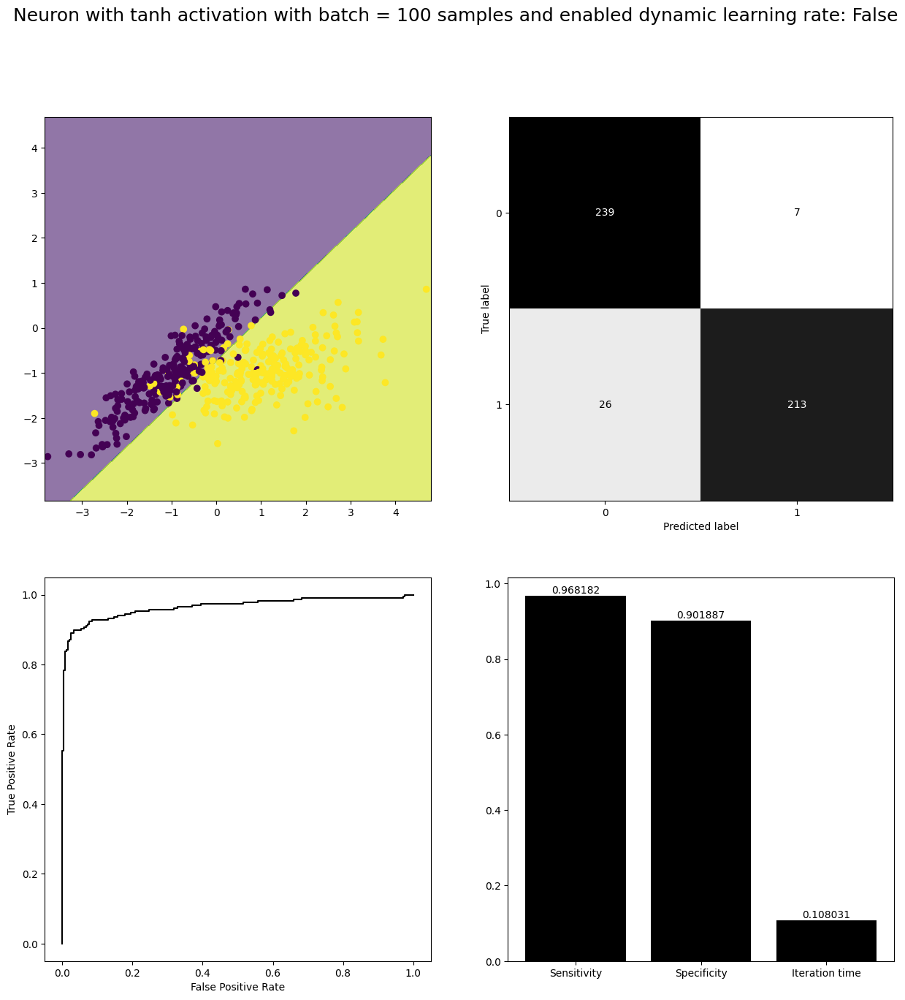

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


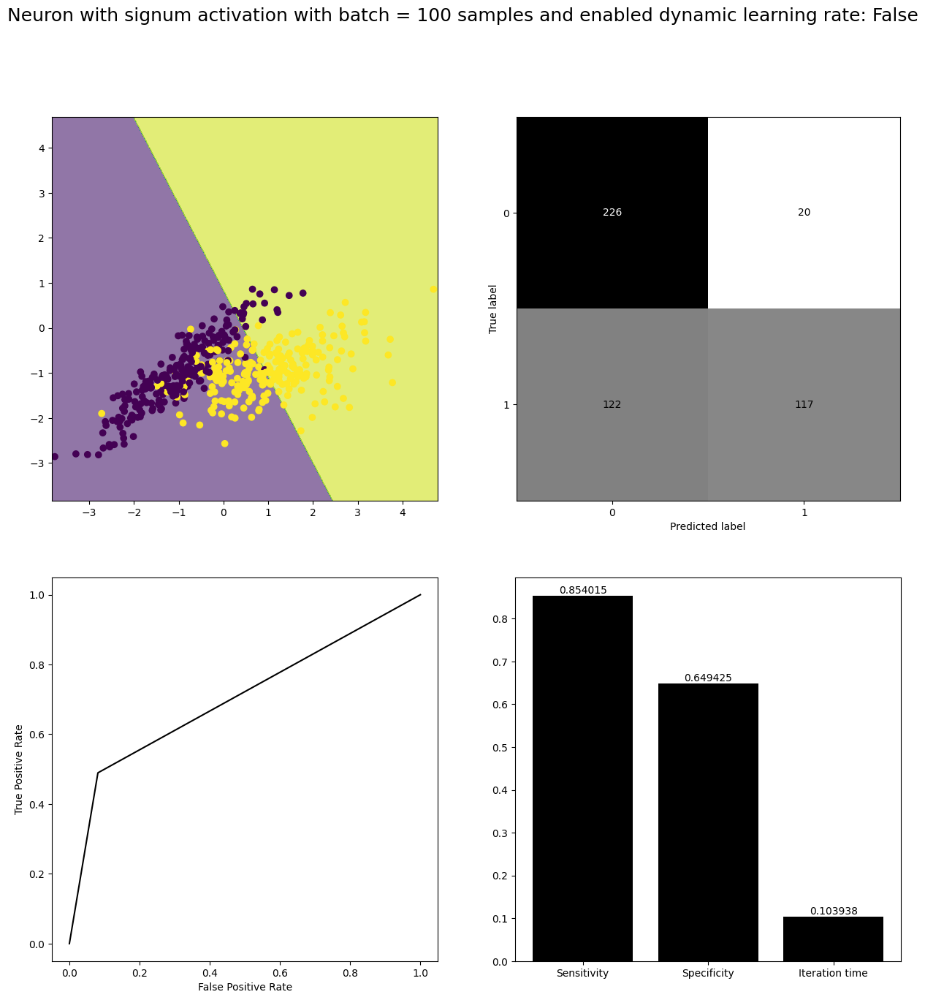

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


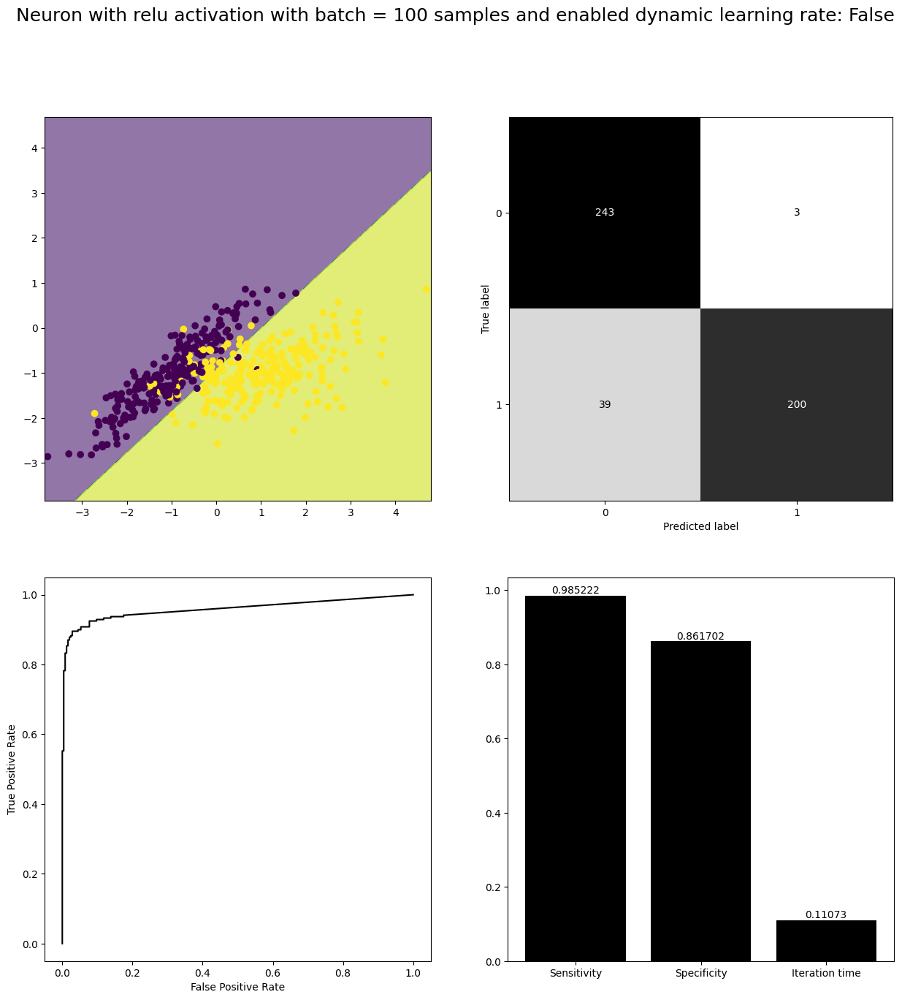

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


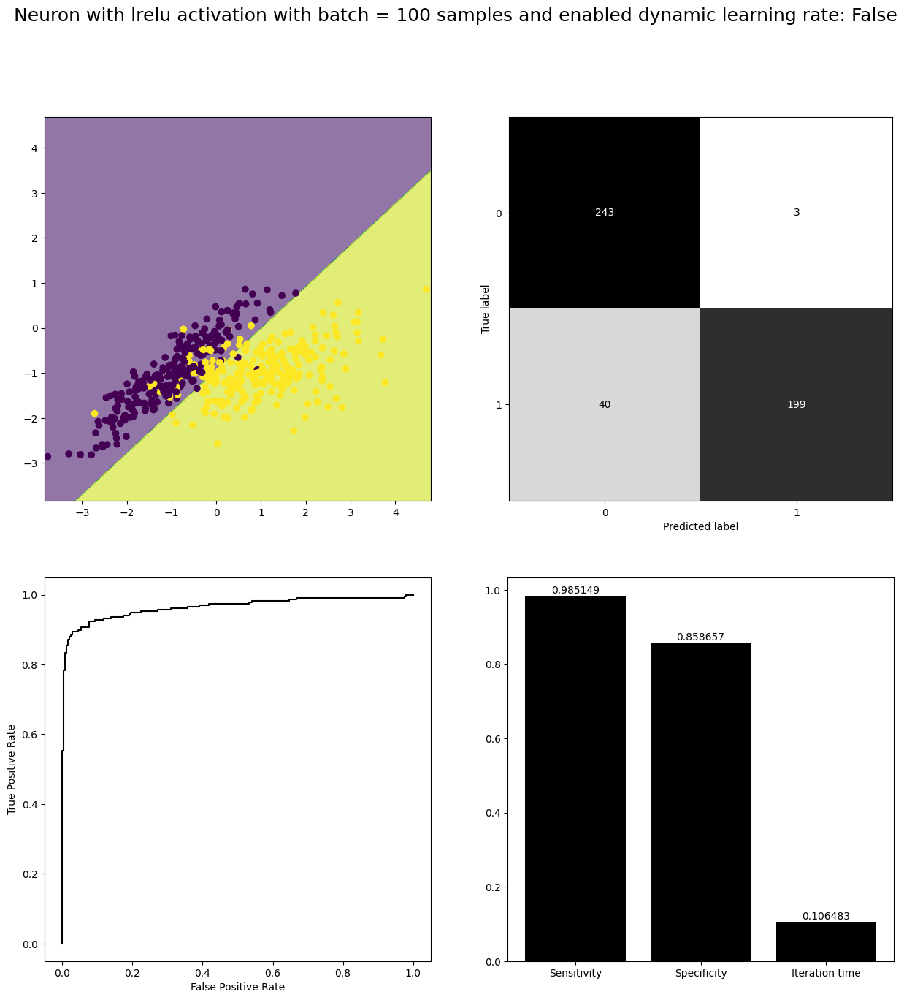

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


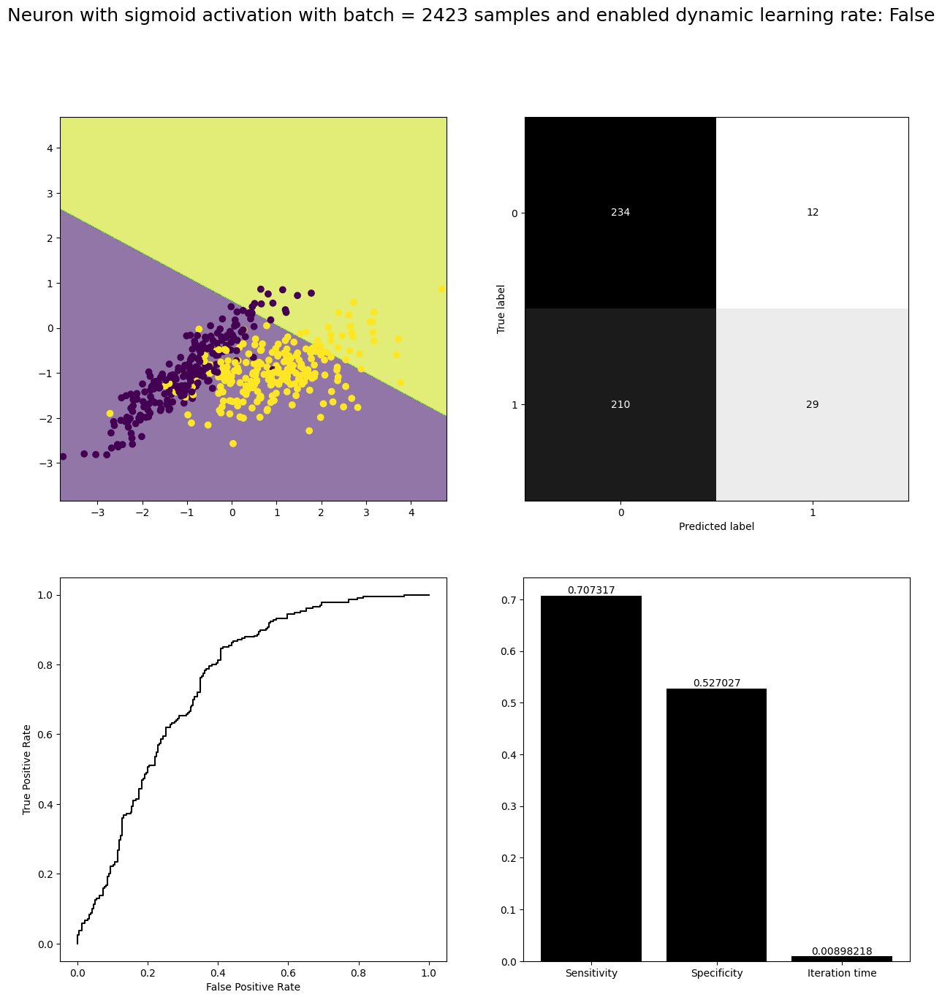

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


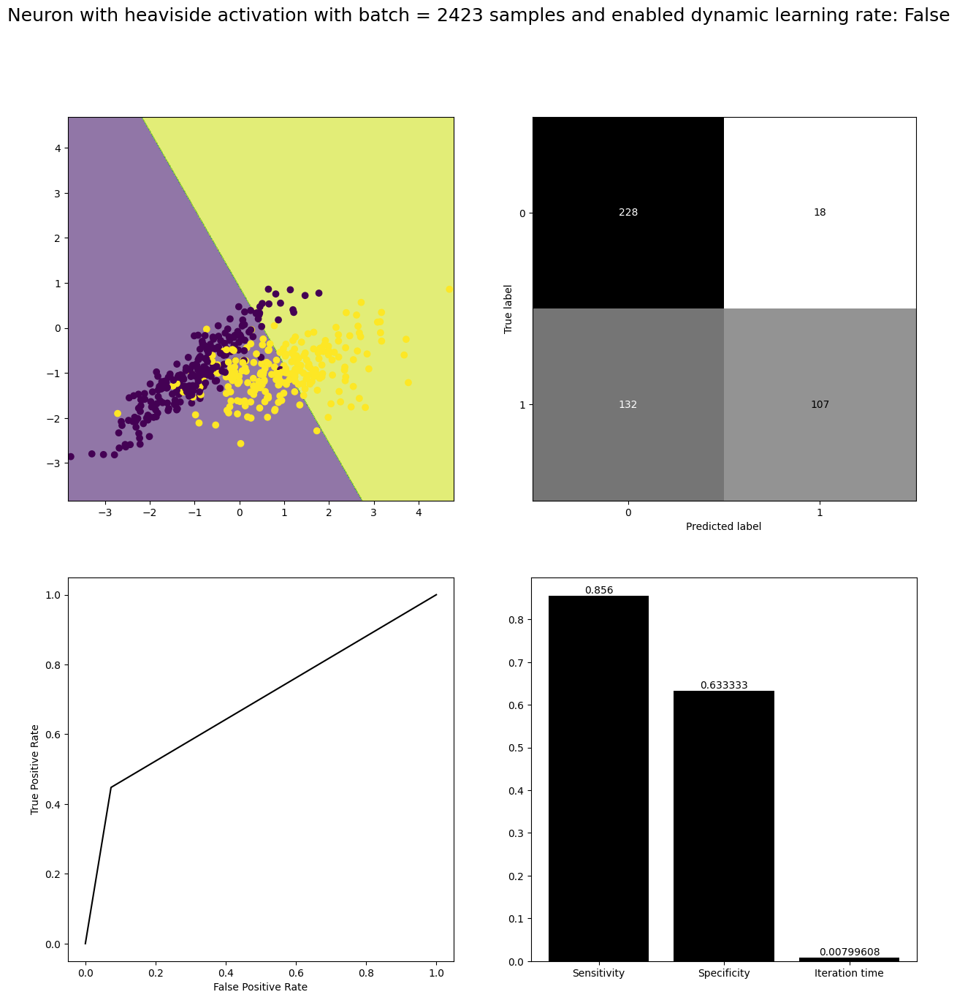

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


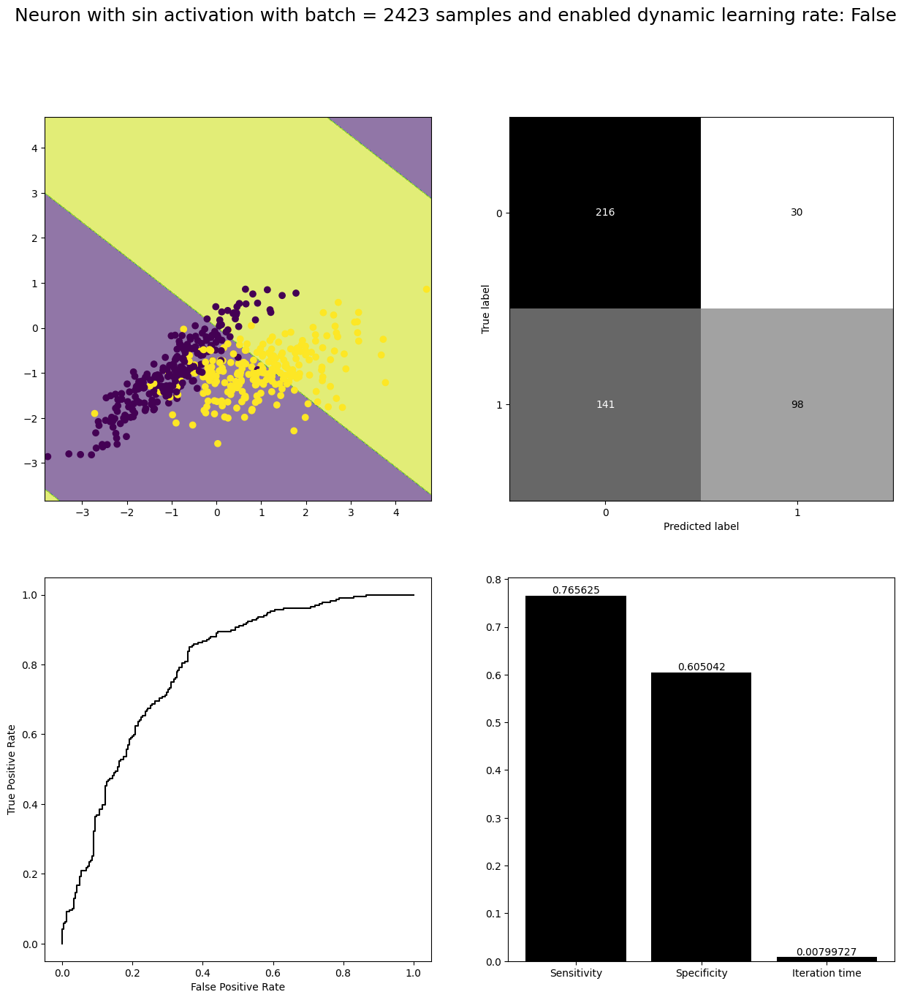

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


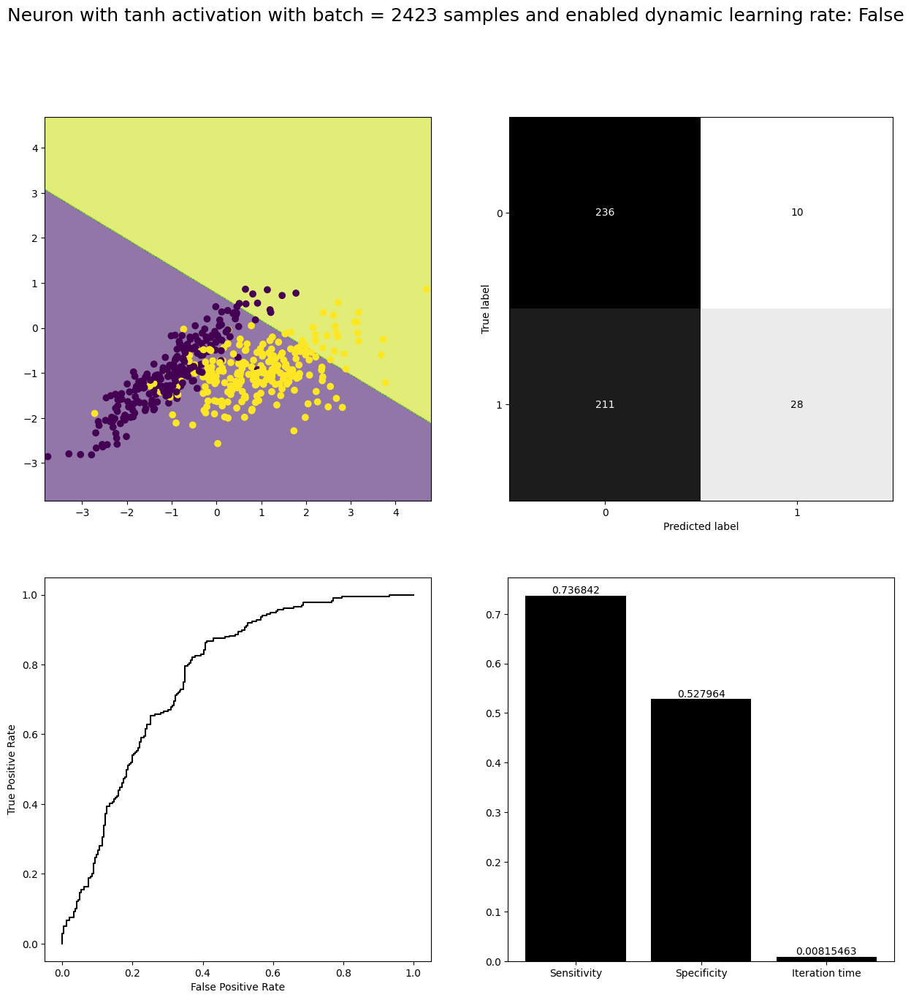

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


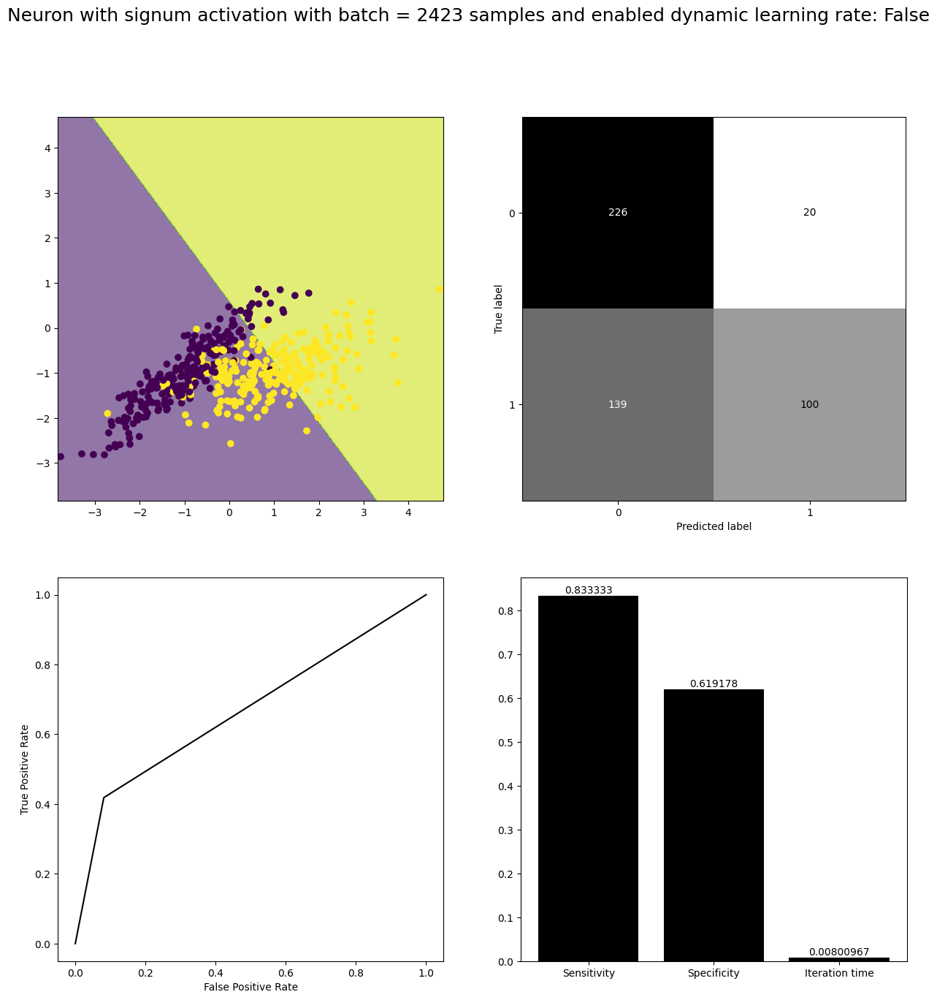

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


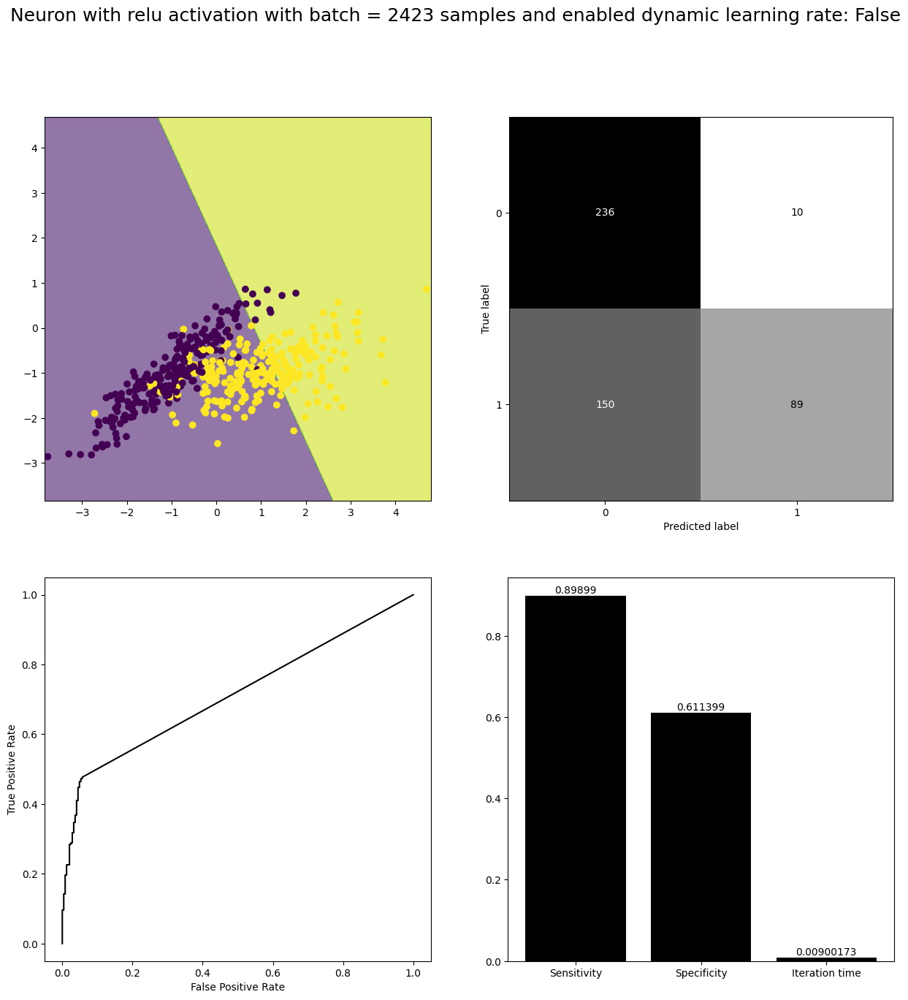

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


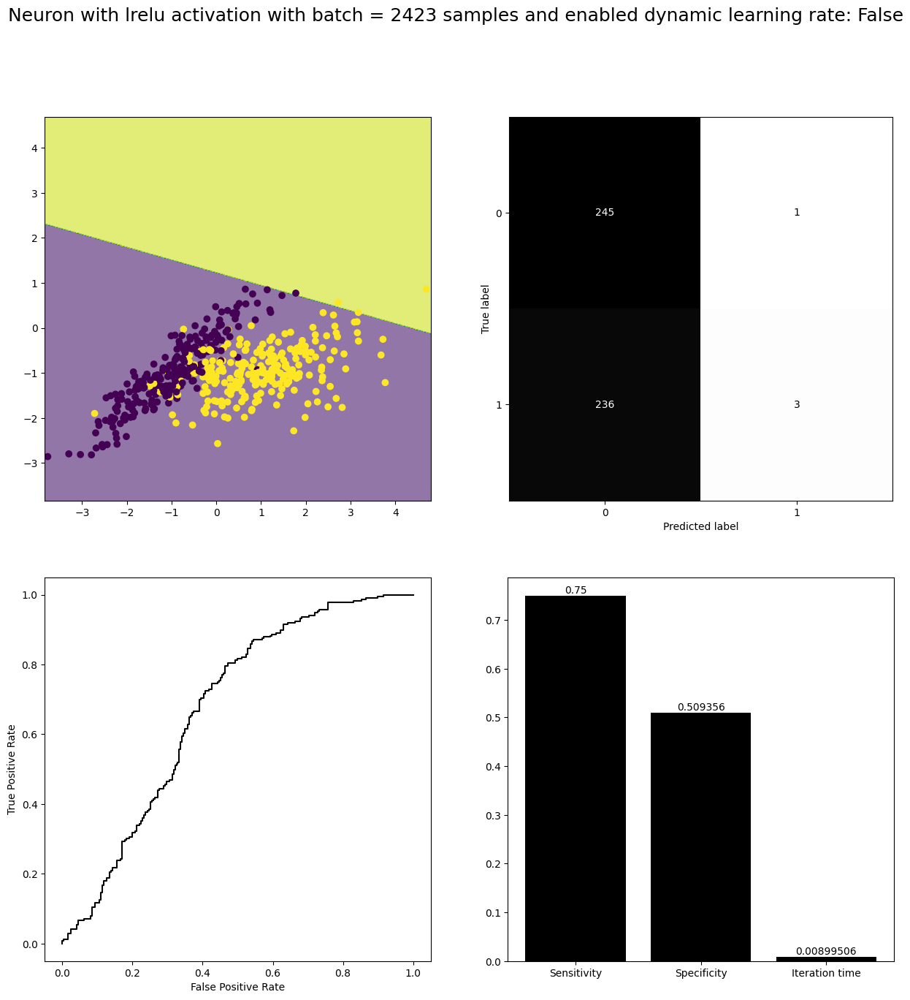

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


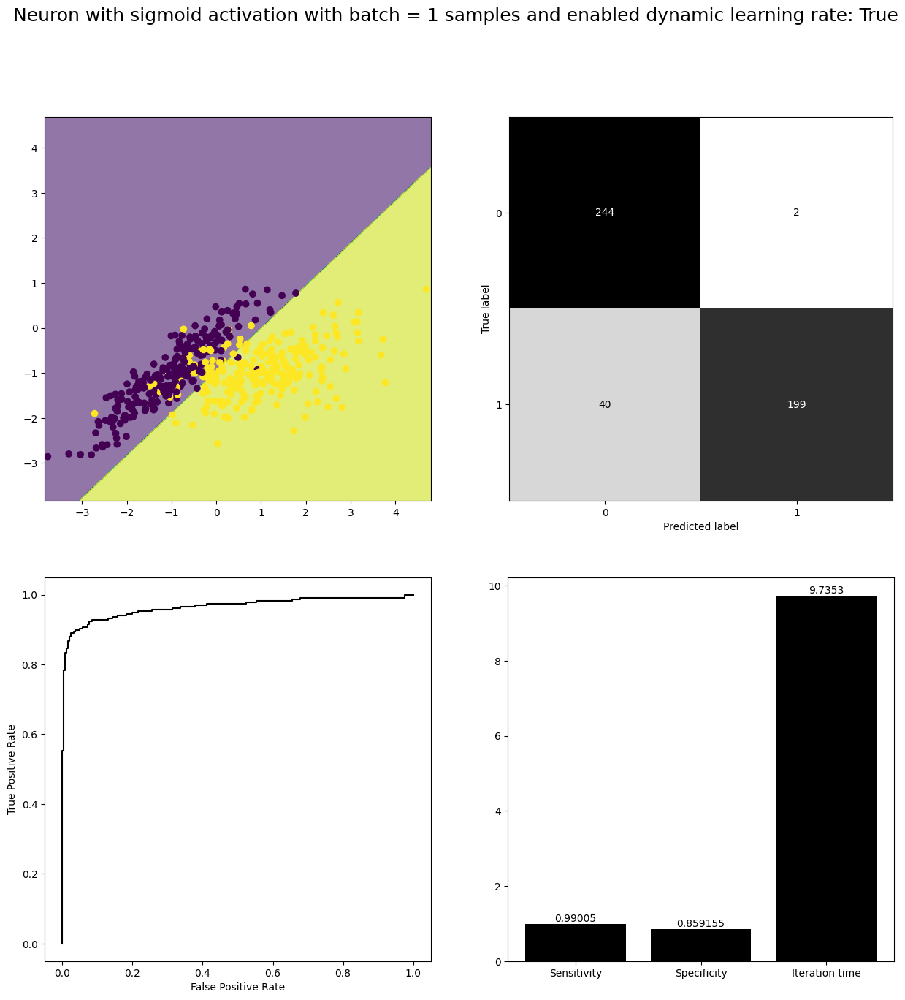

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


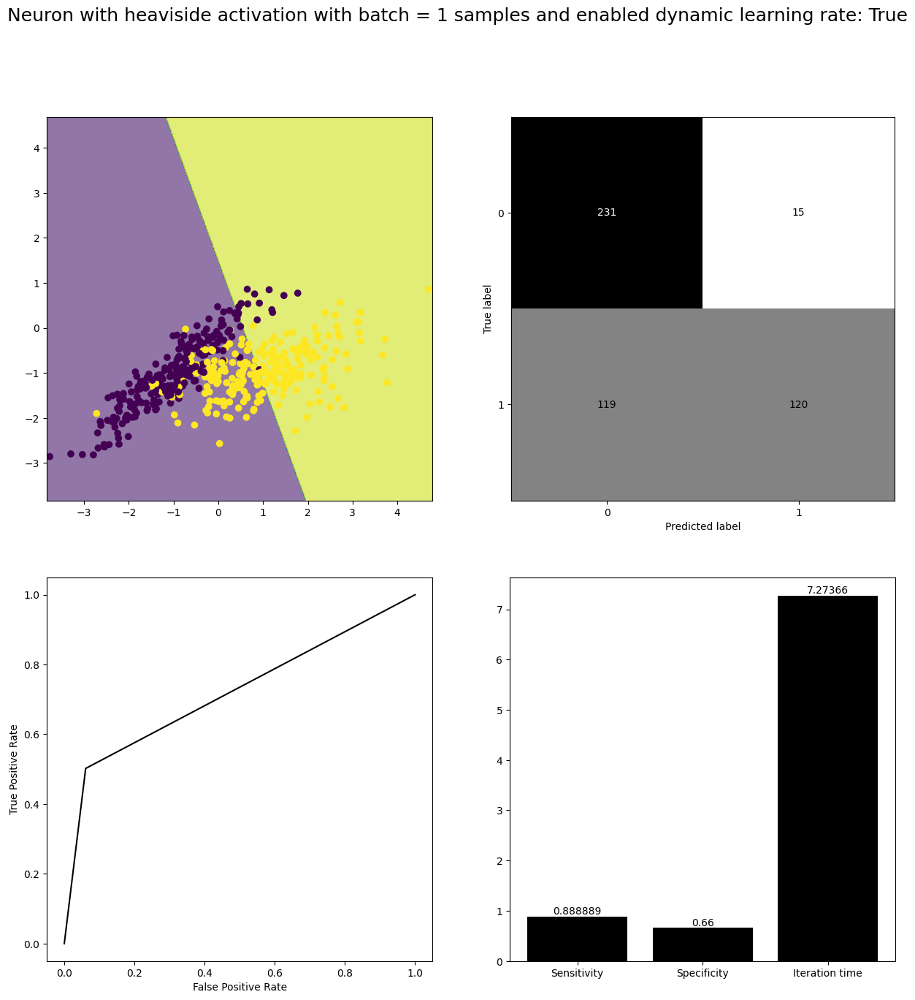

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


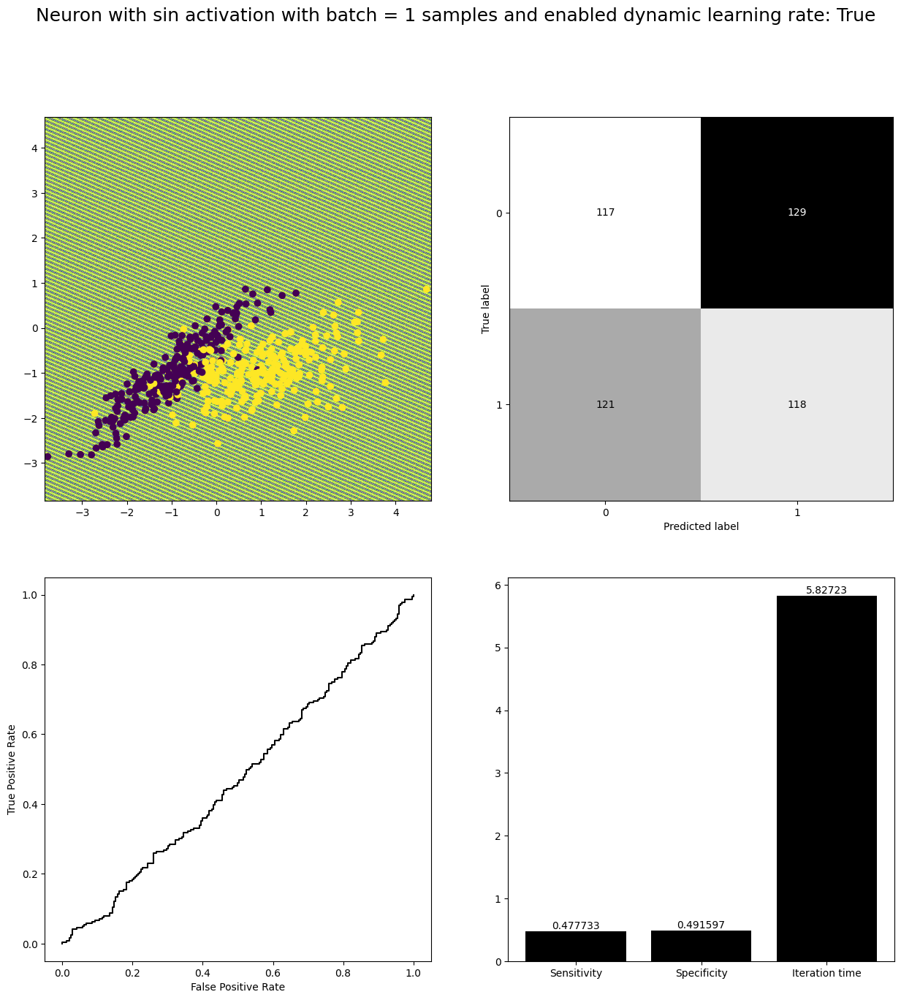

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


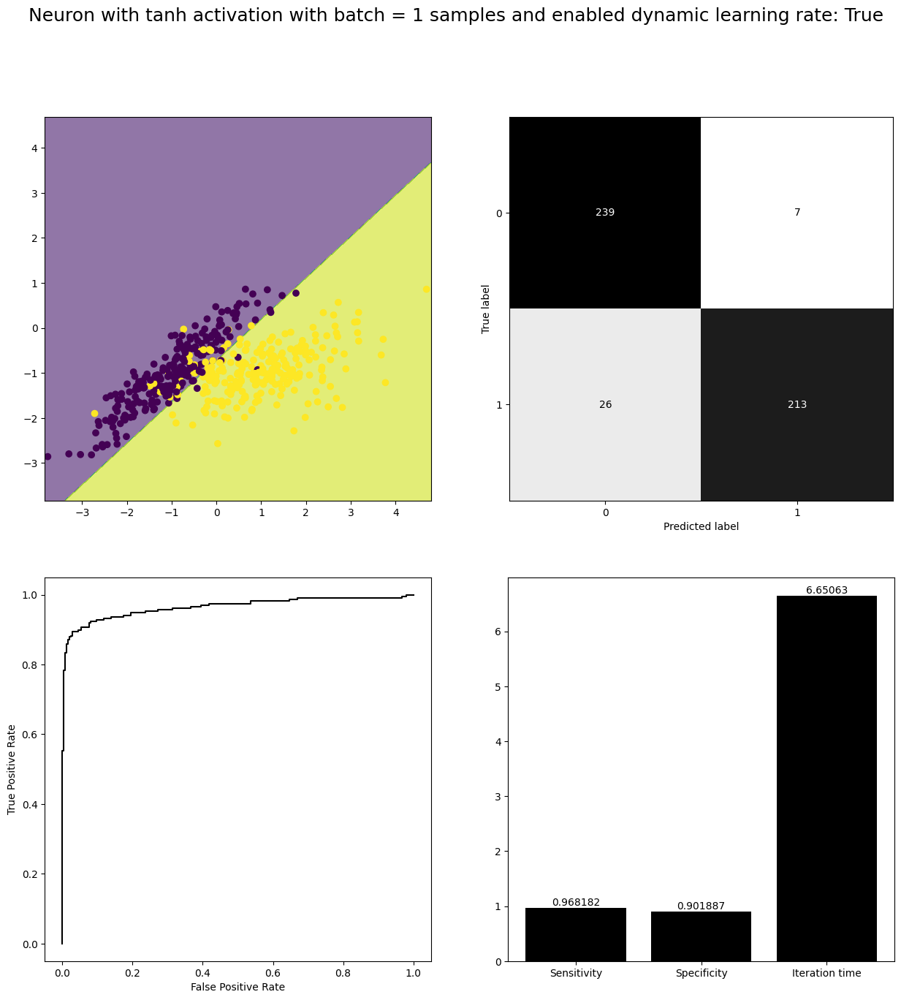

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


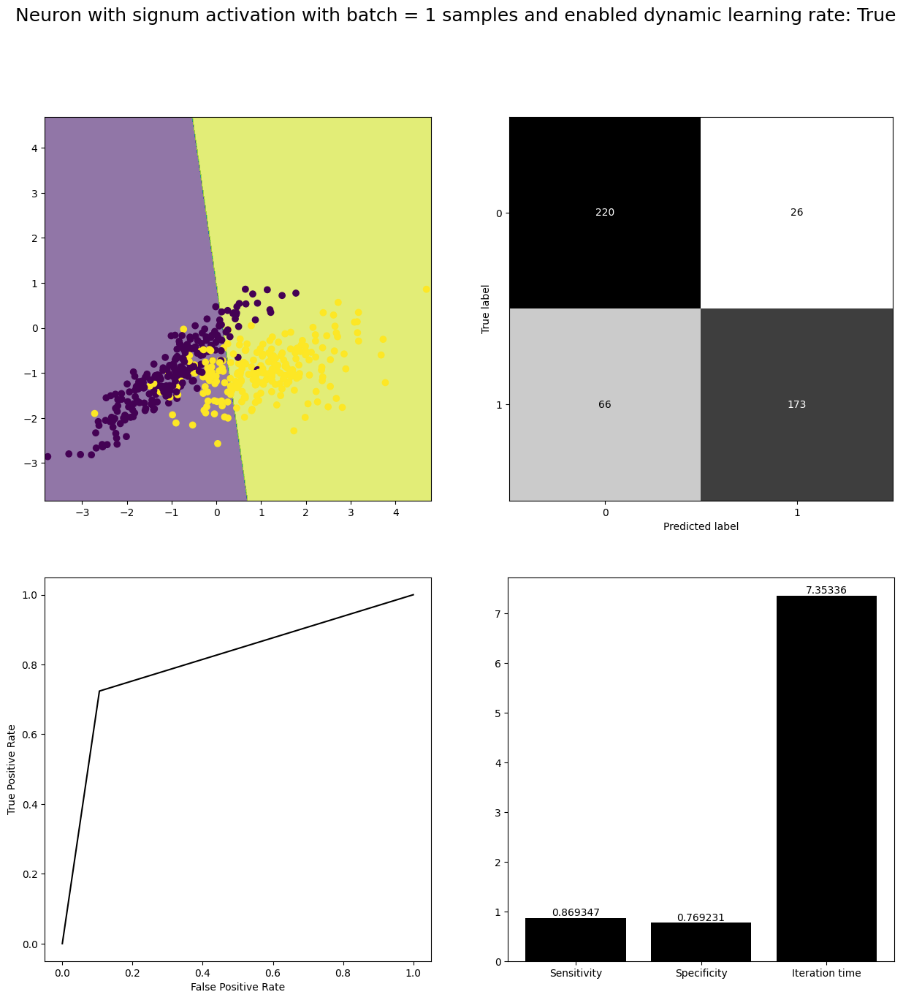

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


C:\Users\Jakub Kowalczewski\AppData\Local\Temp\ipykernel_11852\1018894150.py:196: RuntimeWarning: invalid value encountered in longlong_scalars
  tp_model / (tp_model + fn_model),


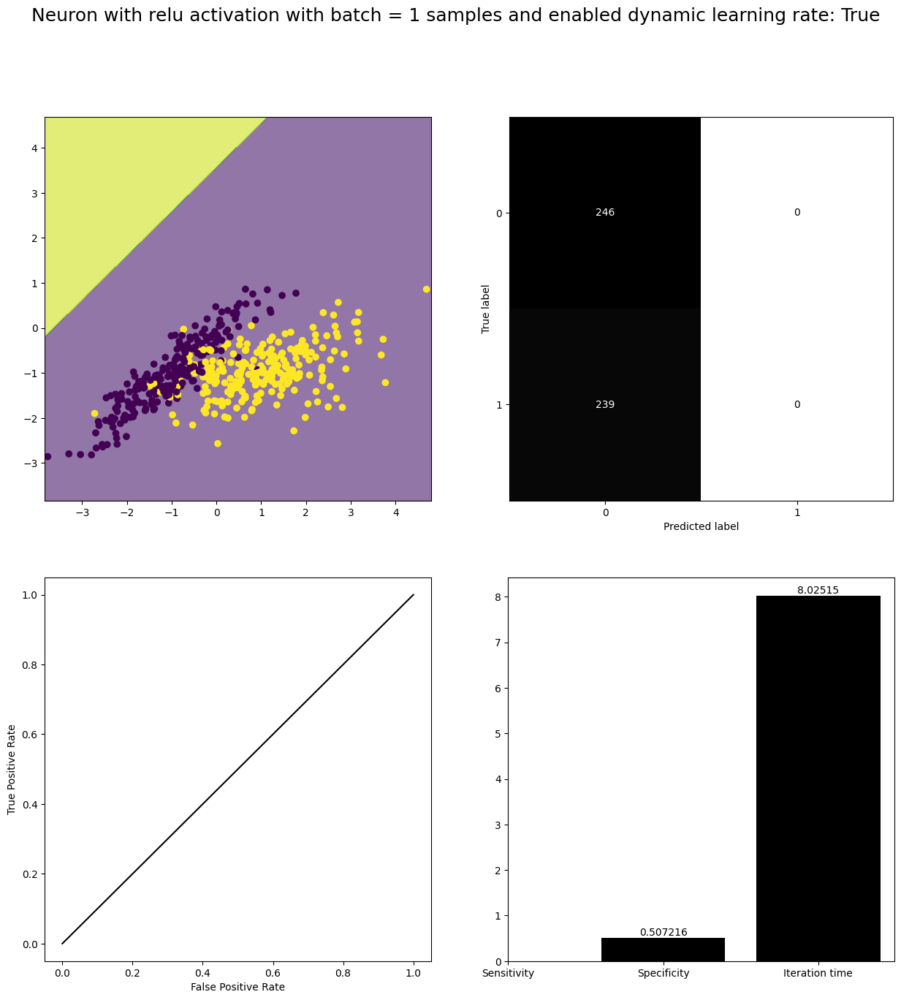

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


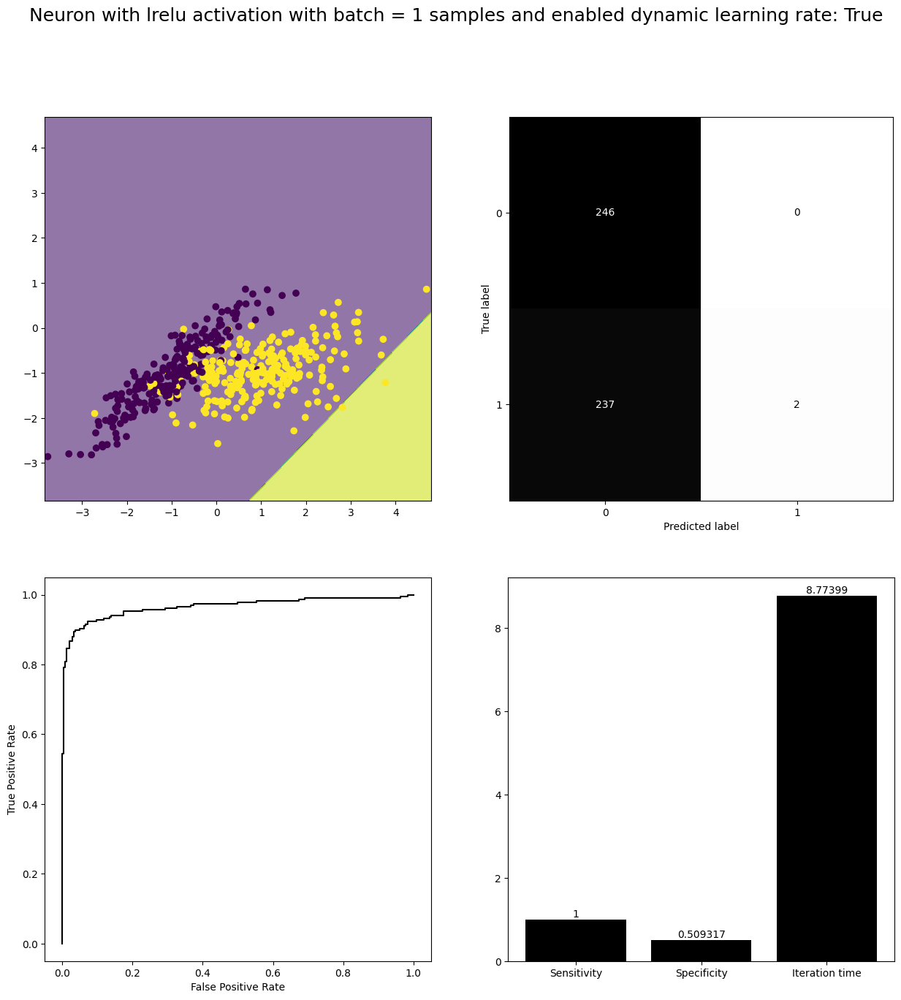

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


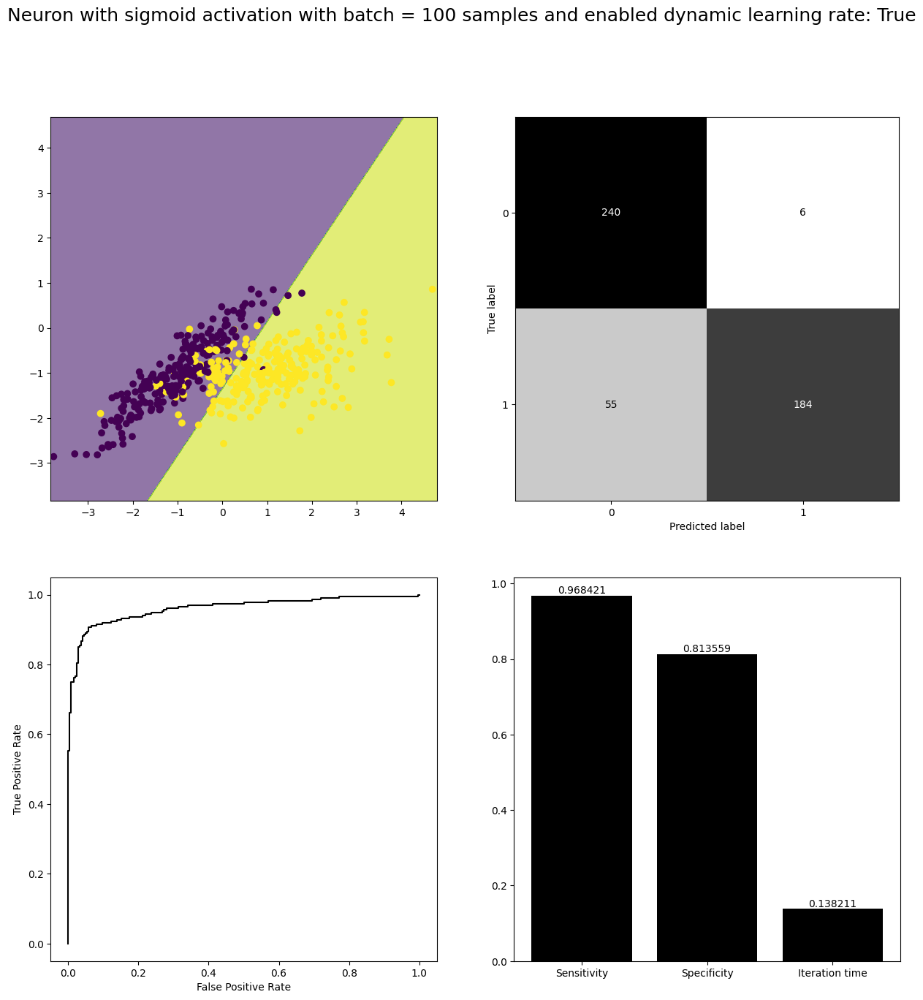

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


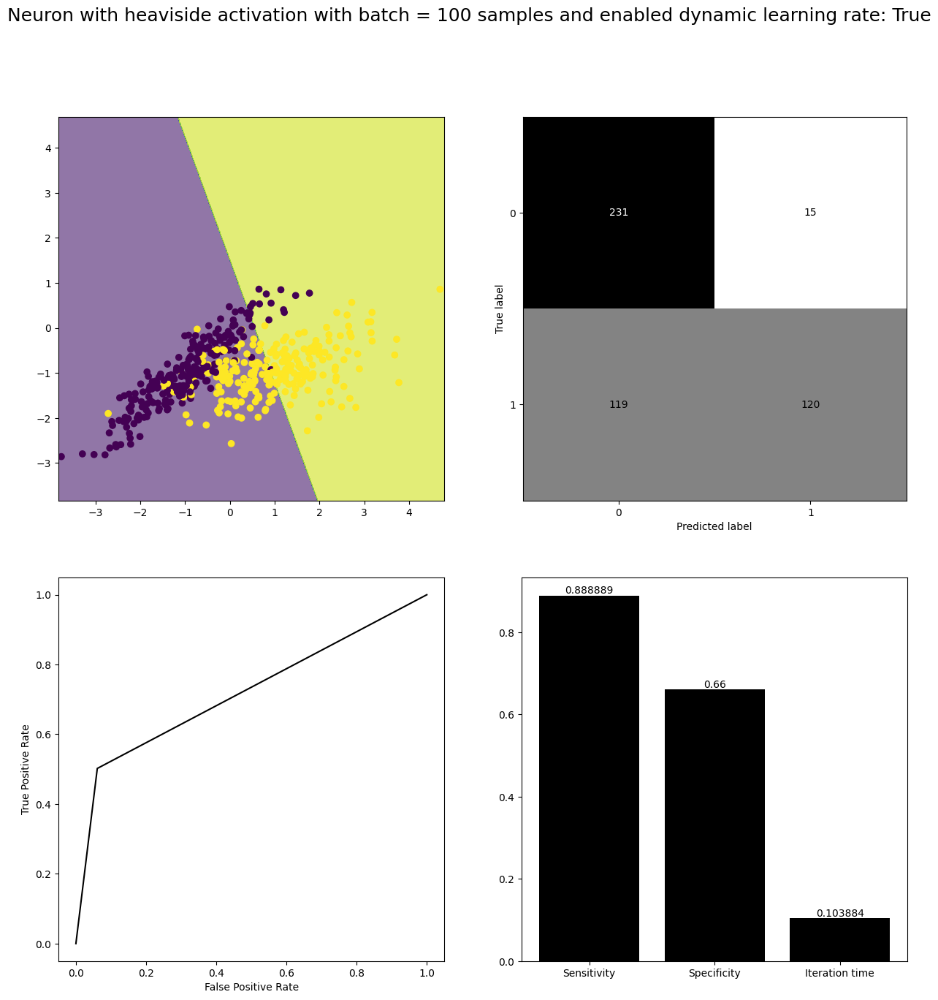

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


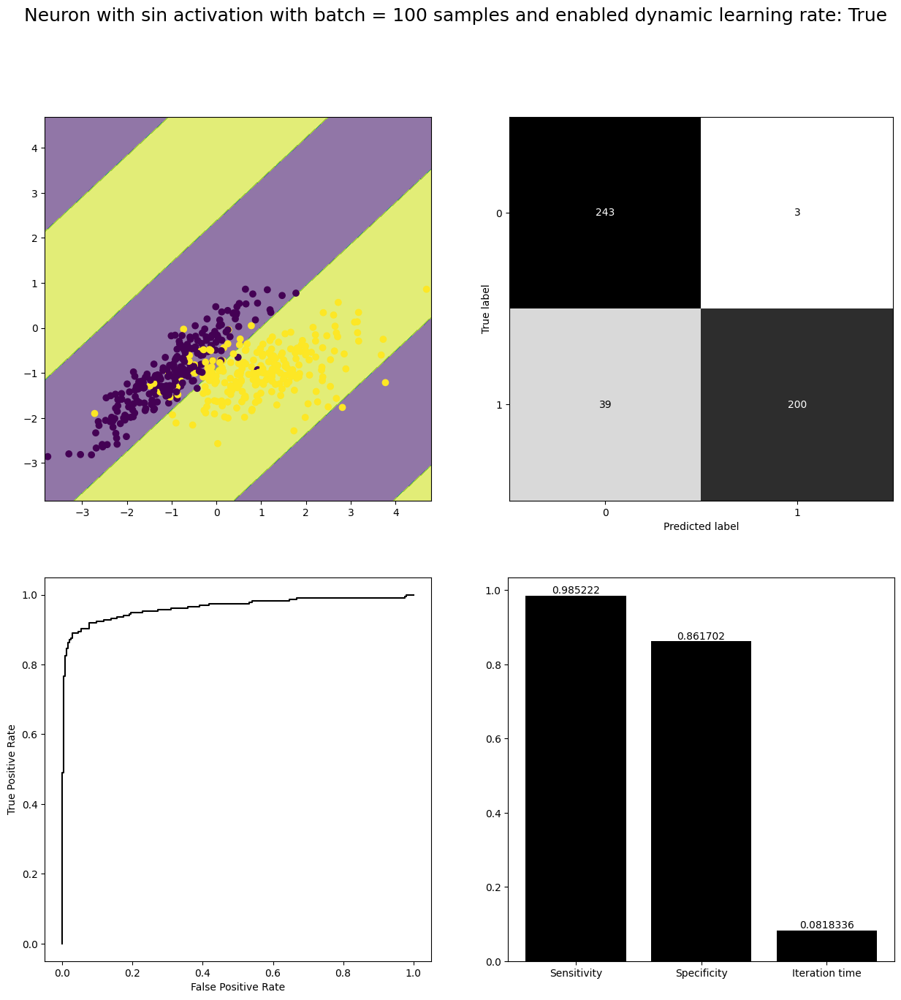

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


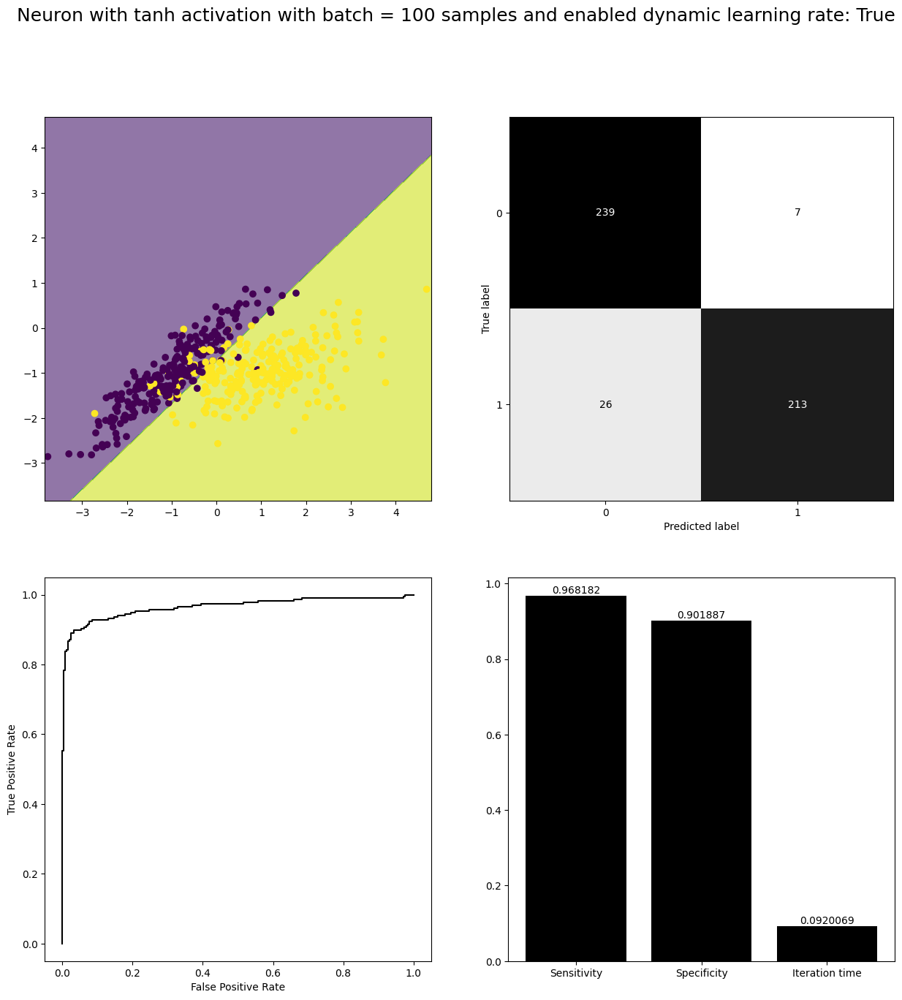

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


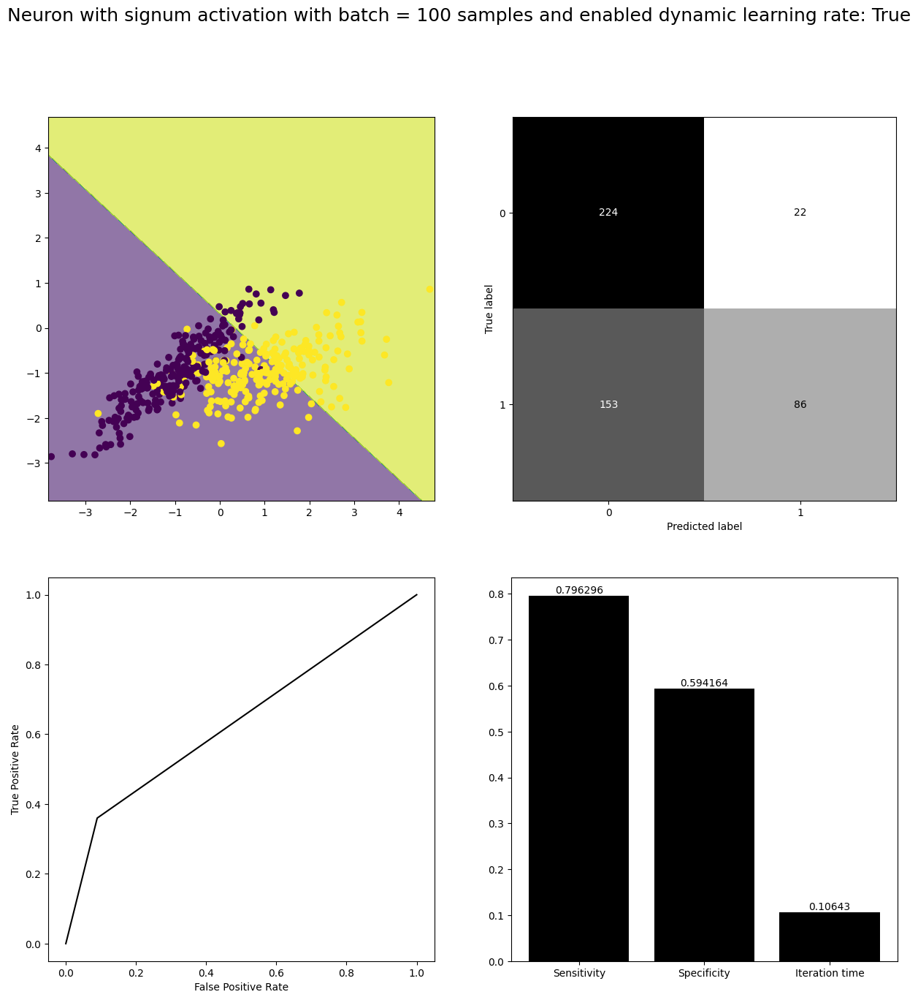

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


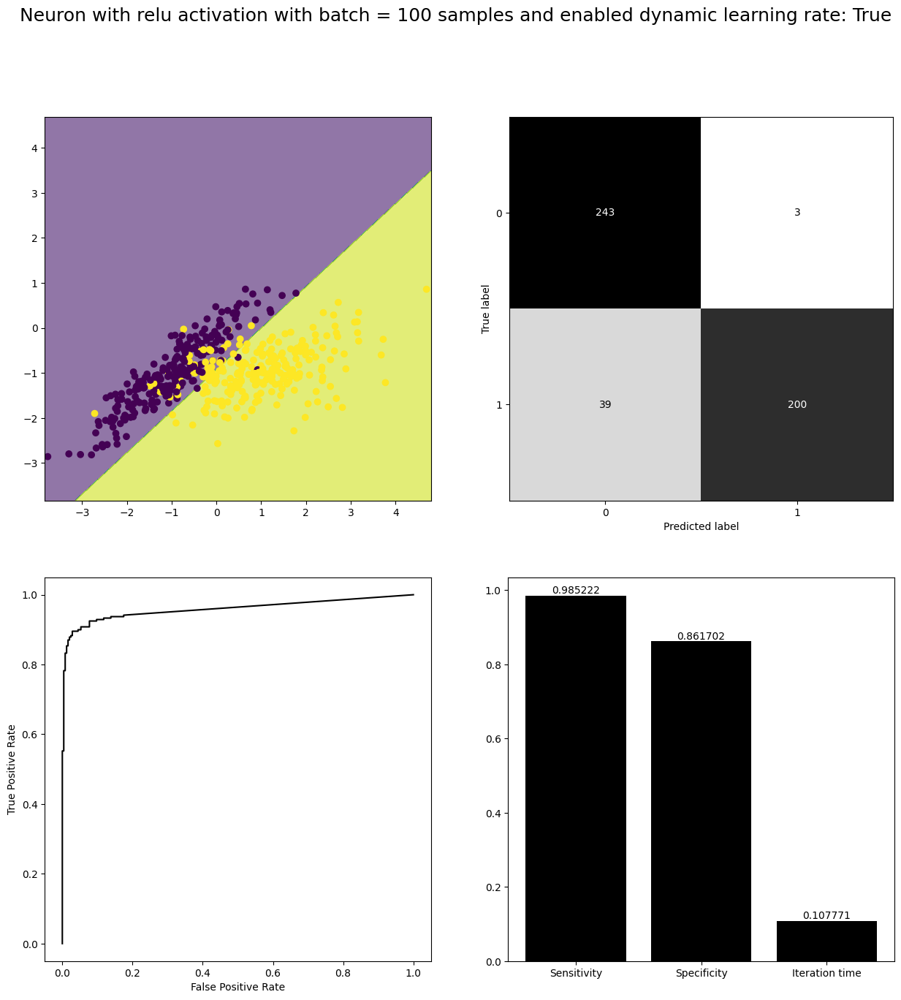

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


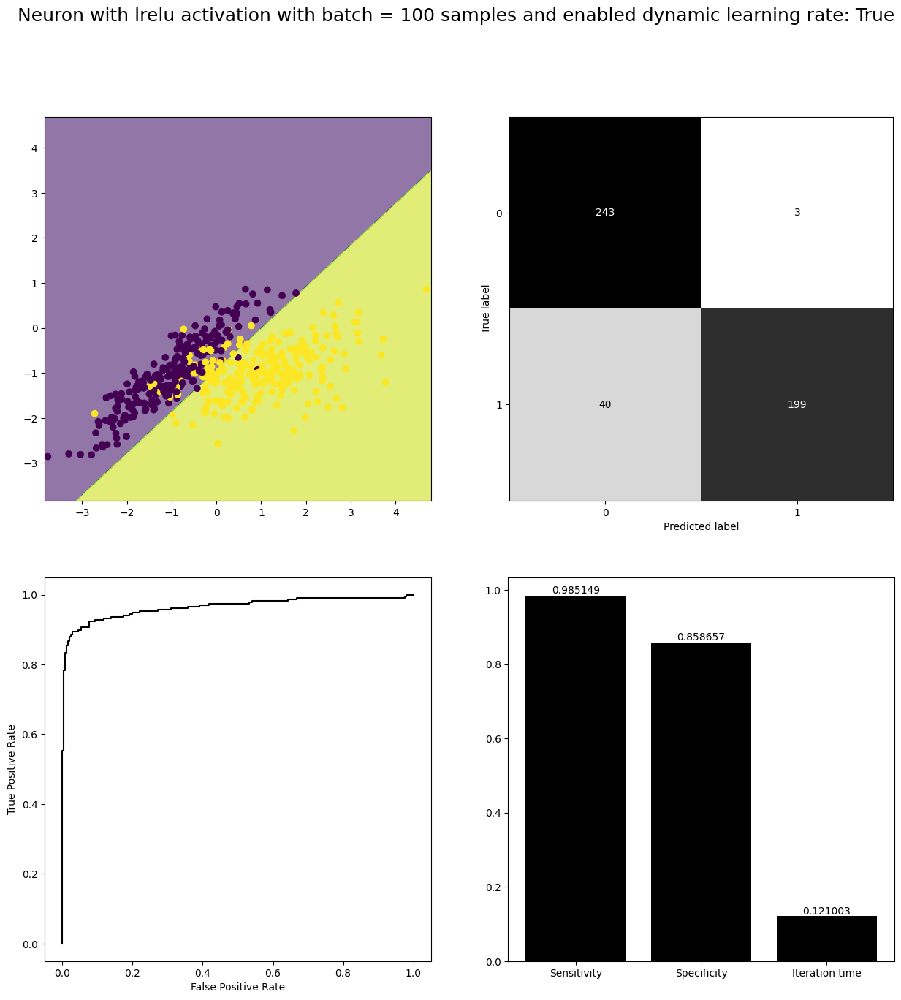

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


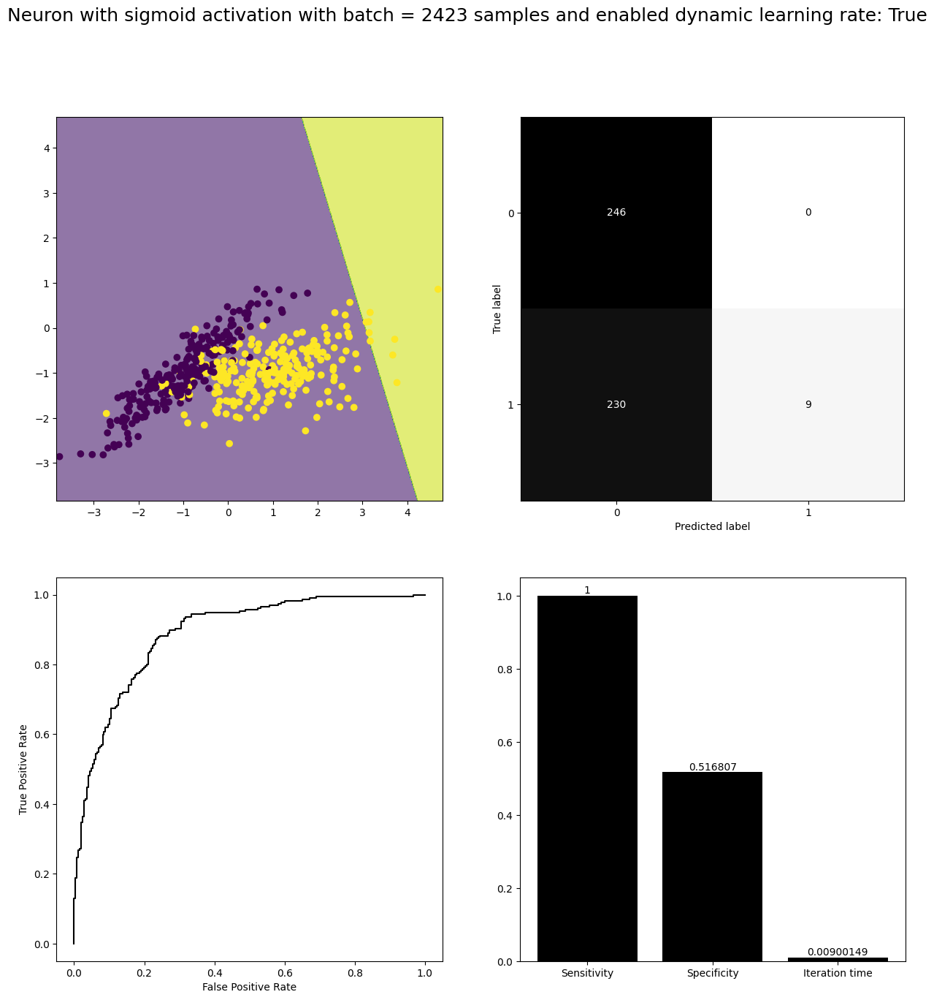

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


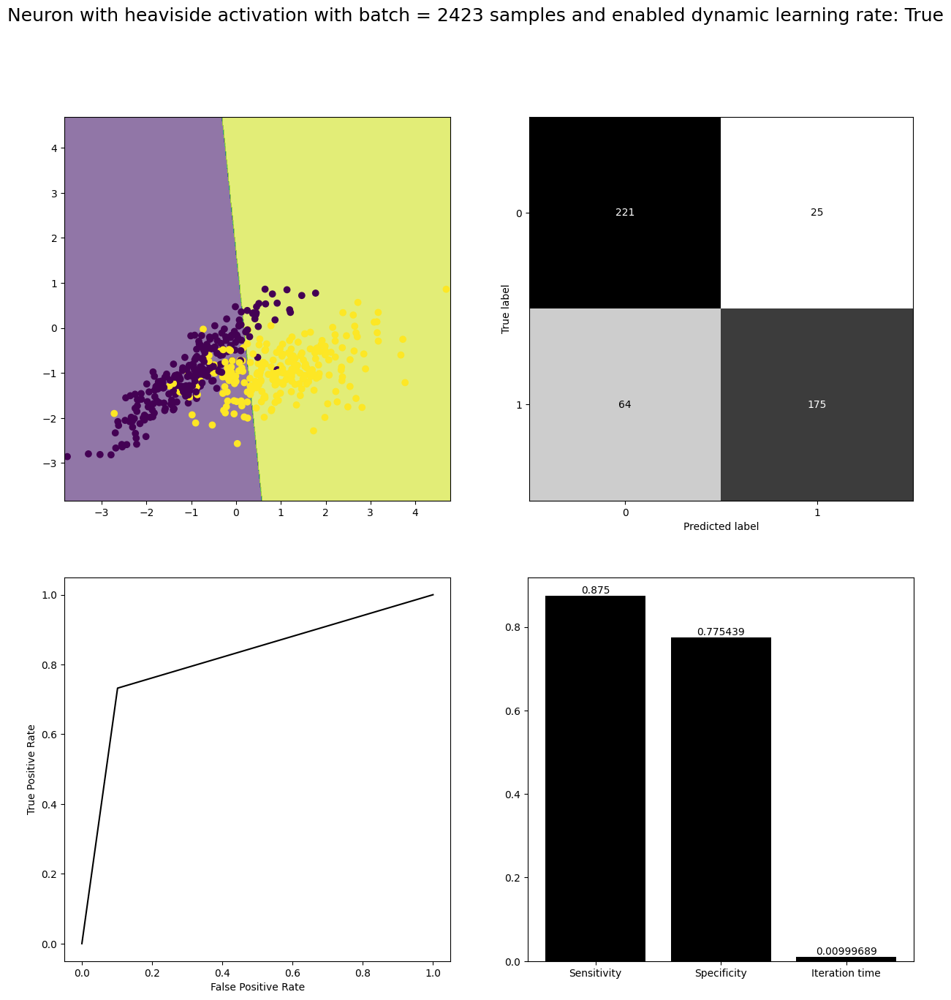

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


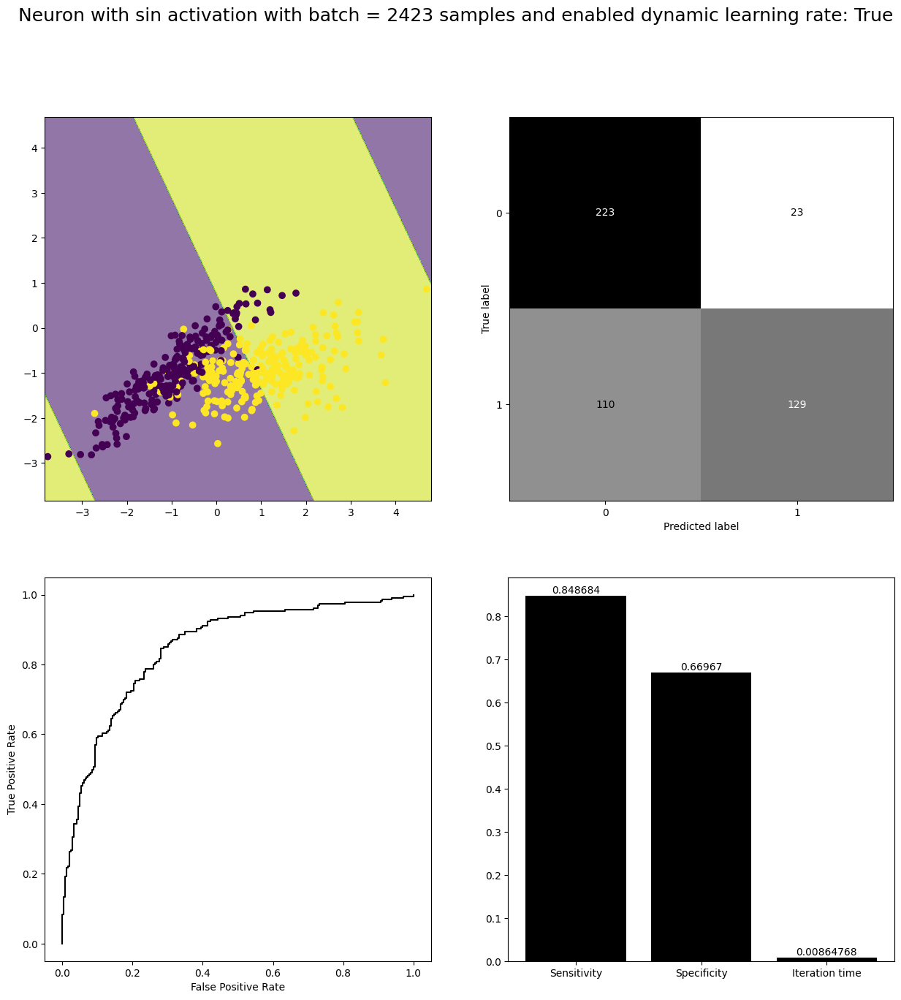

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


C:\Users\Jakub Kowalczewski\AppData\Local\Temp\ipykernel_11852\1018894150.py:196: RuntimeWarning: invalid value encountered in longlong_scalars
  tp_model / (tp_model + fn_model),


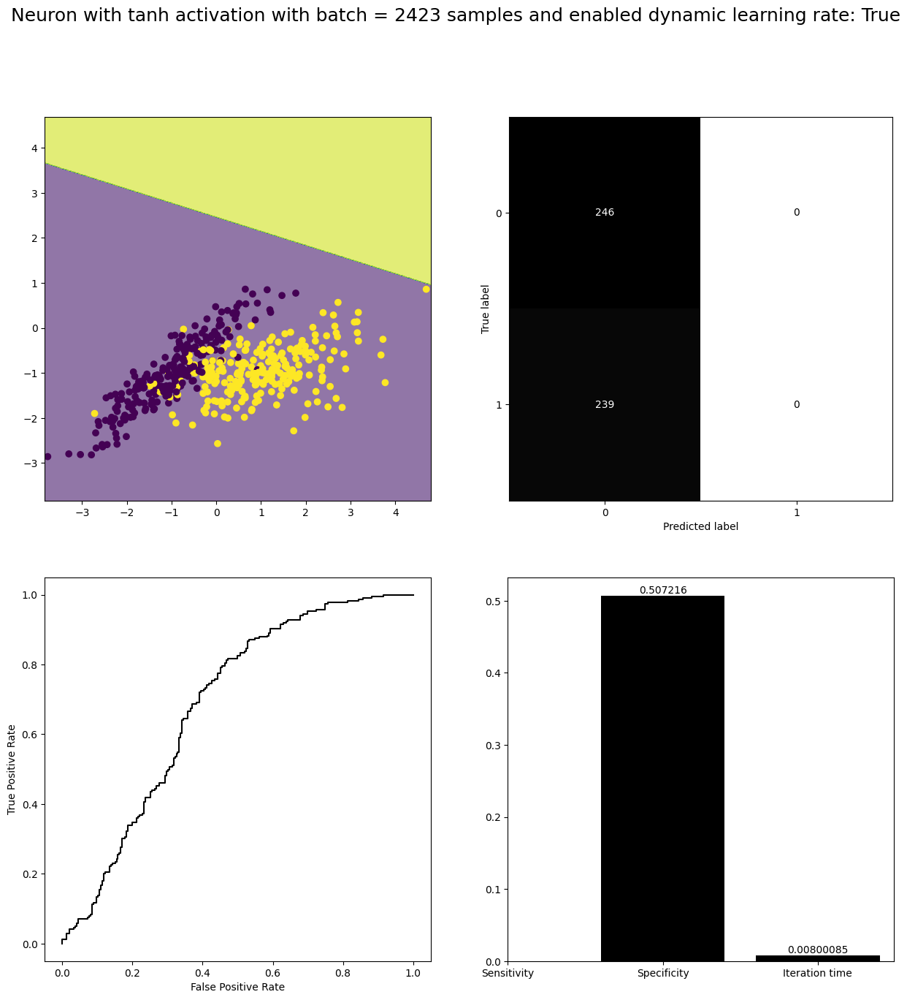

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


C:\Users\Jakub Kowalczewski\AppData\Local\Temp\ipykernel_11852\1018894150.py:196: RuntimeWarning: invalid value encountered in longlong_scalars
  tp_model / (tp_model + fn_model),


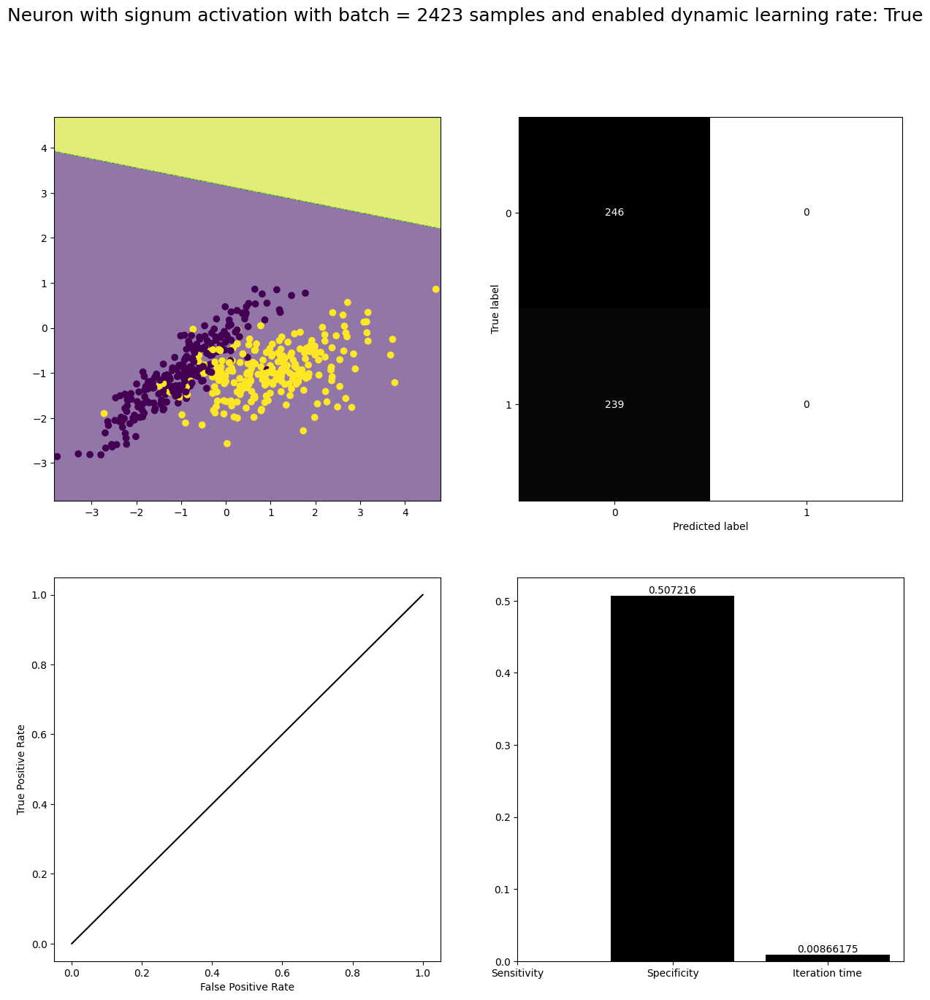

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


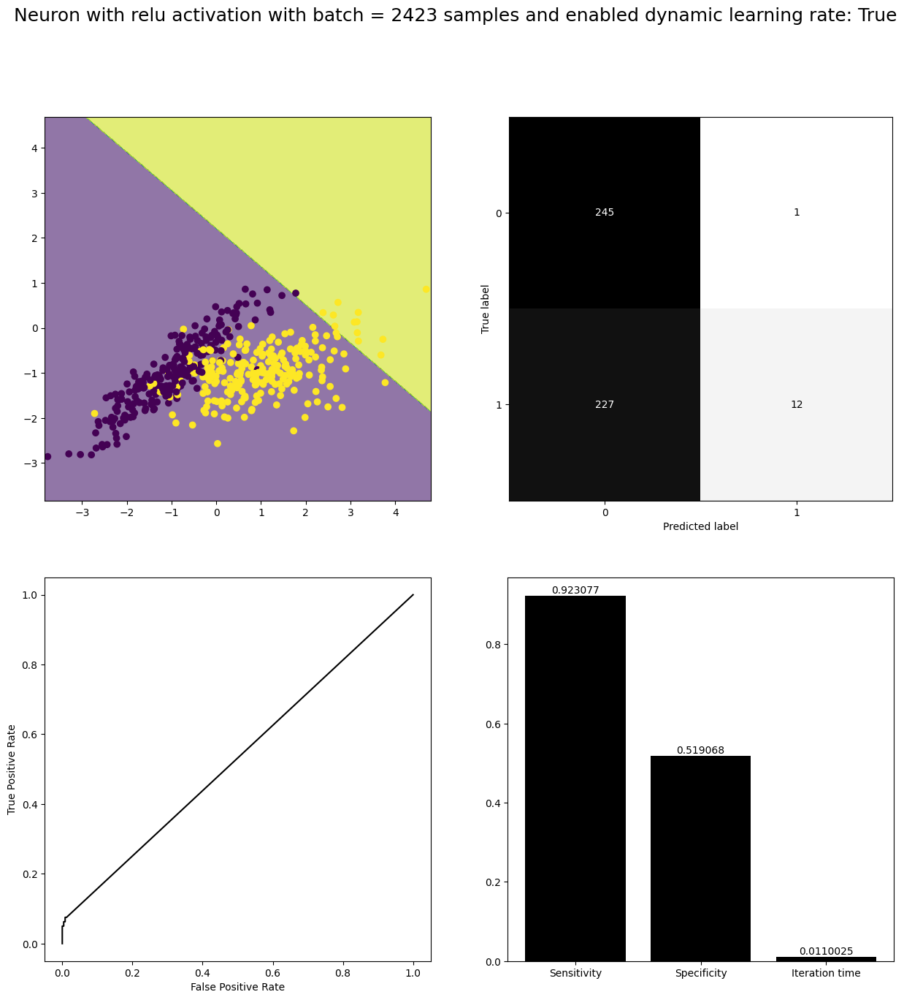

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


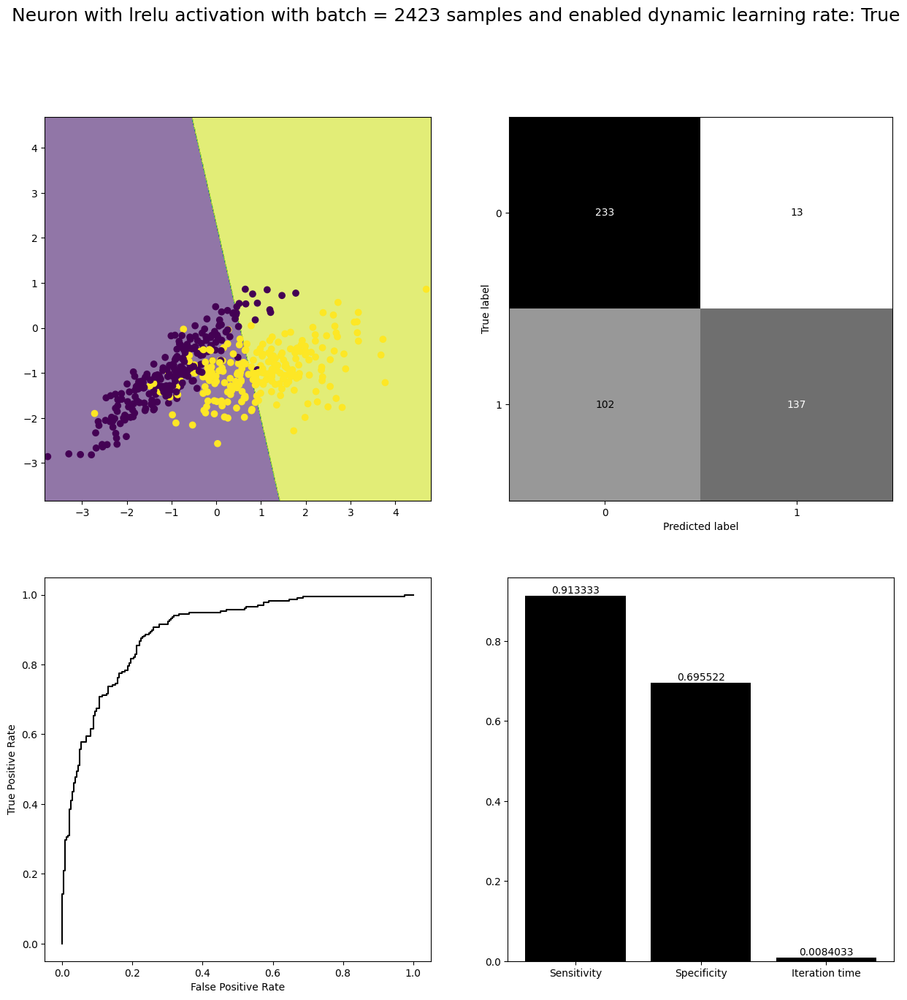

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


In [15]:
for d in dynamic_learning:
    for b in batches:
        for m in method:
            name = 'Neuron with ' + str(m) + ' activation with batch = ' + str(b) + ' samples and enabled dynamic learning rate: ' + str(d)
            p = Neuron(m, 0.1, 100, b, dynamic_learning, 0.001, 0.1)
            show_result(p, x_train, y_train, x_test, y_test, name)
            print('-------------------------------------------------------------------------------------------------------------------------------------------------------------------------')


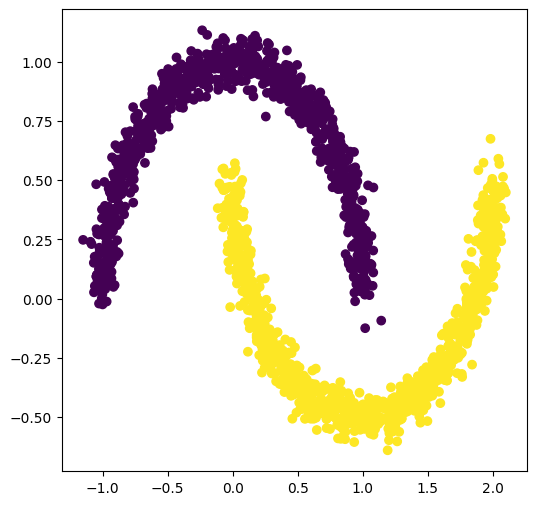

In [16]:
x, y = datasets.make_moons(random_state=seed, n_samples=samples, noise=0.05)

x_train, x_test, y_train, y_test = train_test_split(x, y, train_size=train_split, test_size=test_split,
                                                    random_state=seed, shuffle=True, stratify=y)

xx, yy = np.meshgrid(np.arange(x.min(), x.max(), 0.01),
                     np.arange(x.min(), x.max(), 0.01))

plt.scatter(x_train[:, 0], x_train[:, 1], c=y_train)
plt.show()

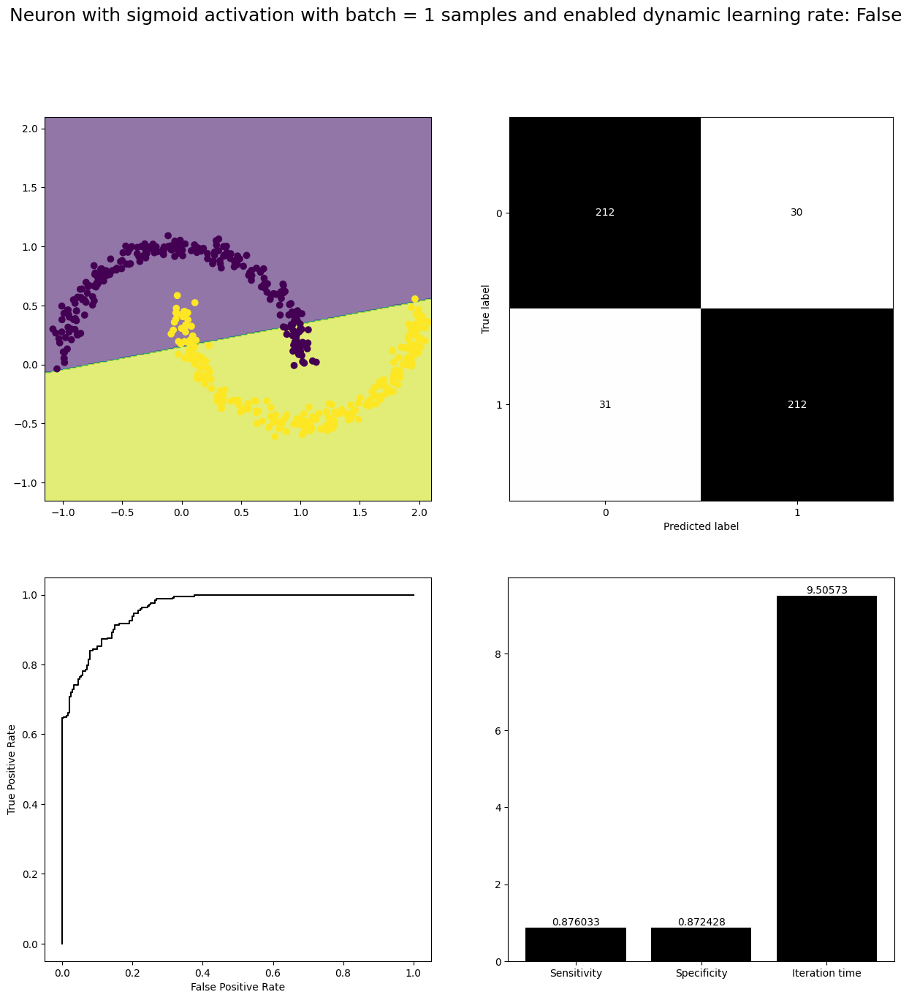

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


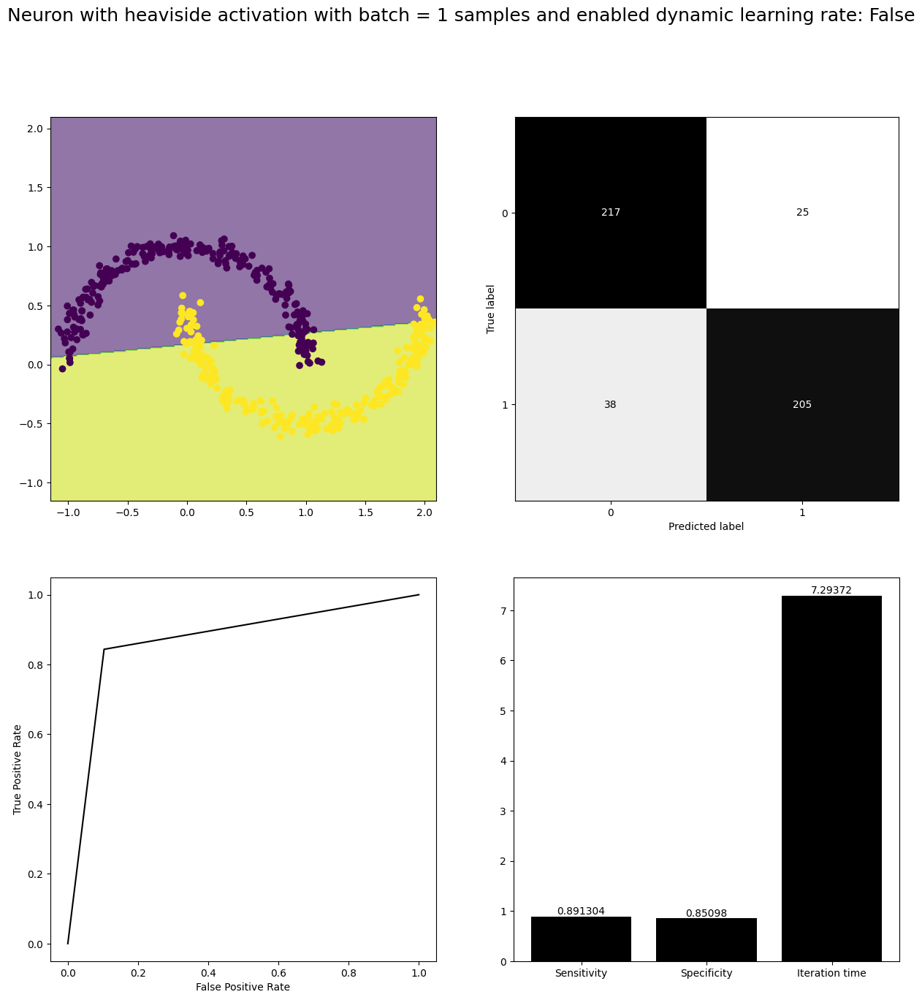

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


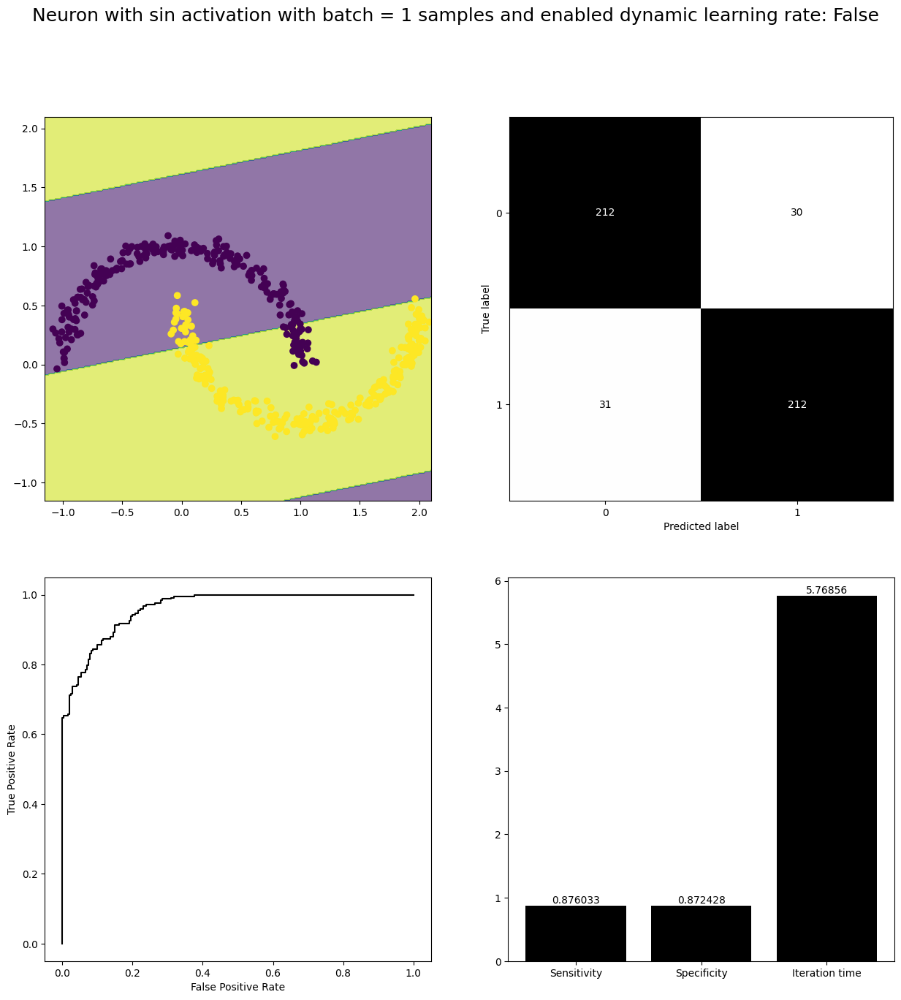

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


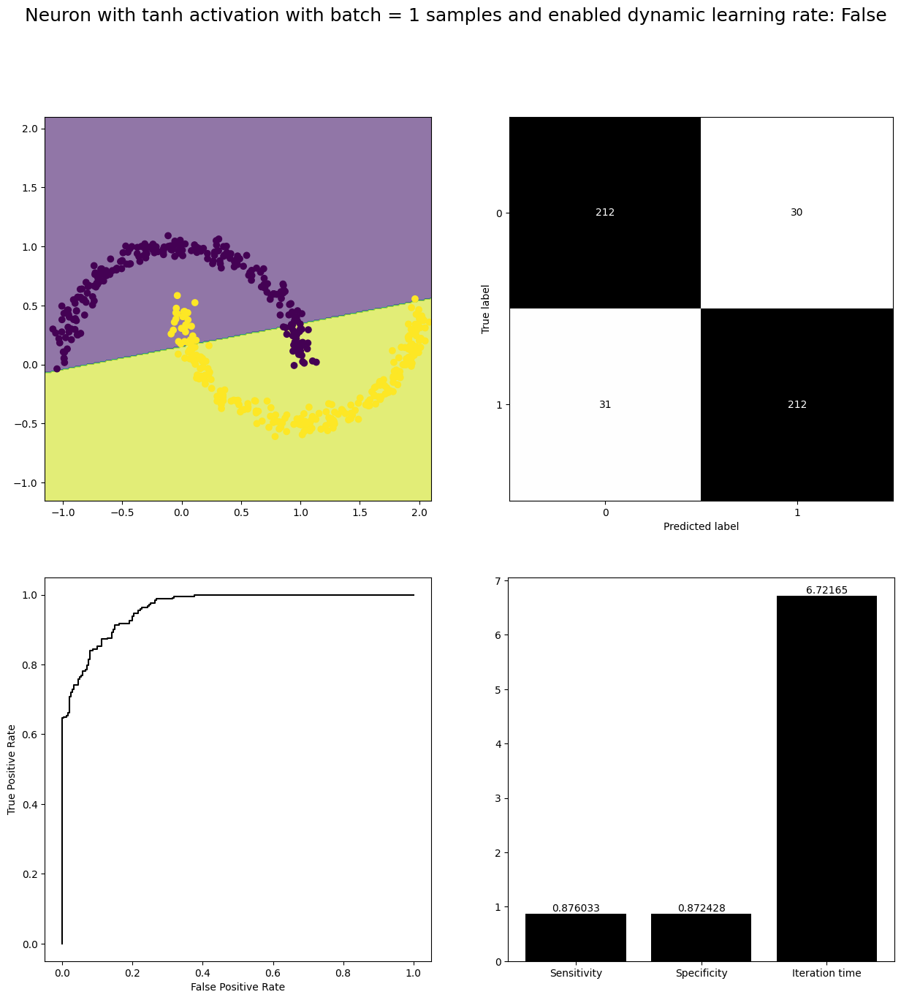

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


C:\Users\Jakub Kowalczewski\AppData\Local\Temp\ipykernel_11852\1018894150.py:196: RuntimeWarning: invalid value encountered in longlong_scalars
  tp_model / (tp_model + fn_model),


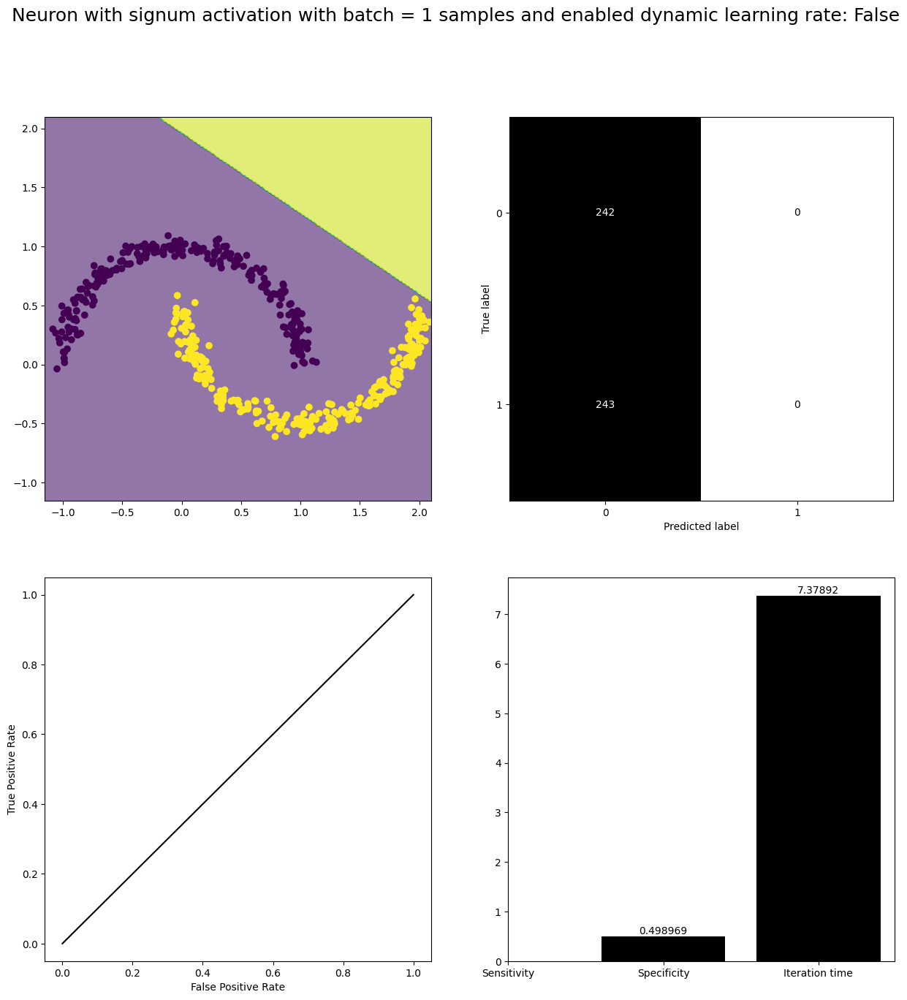

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


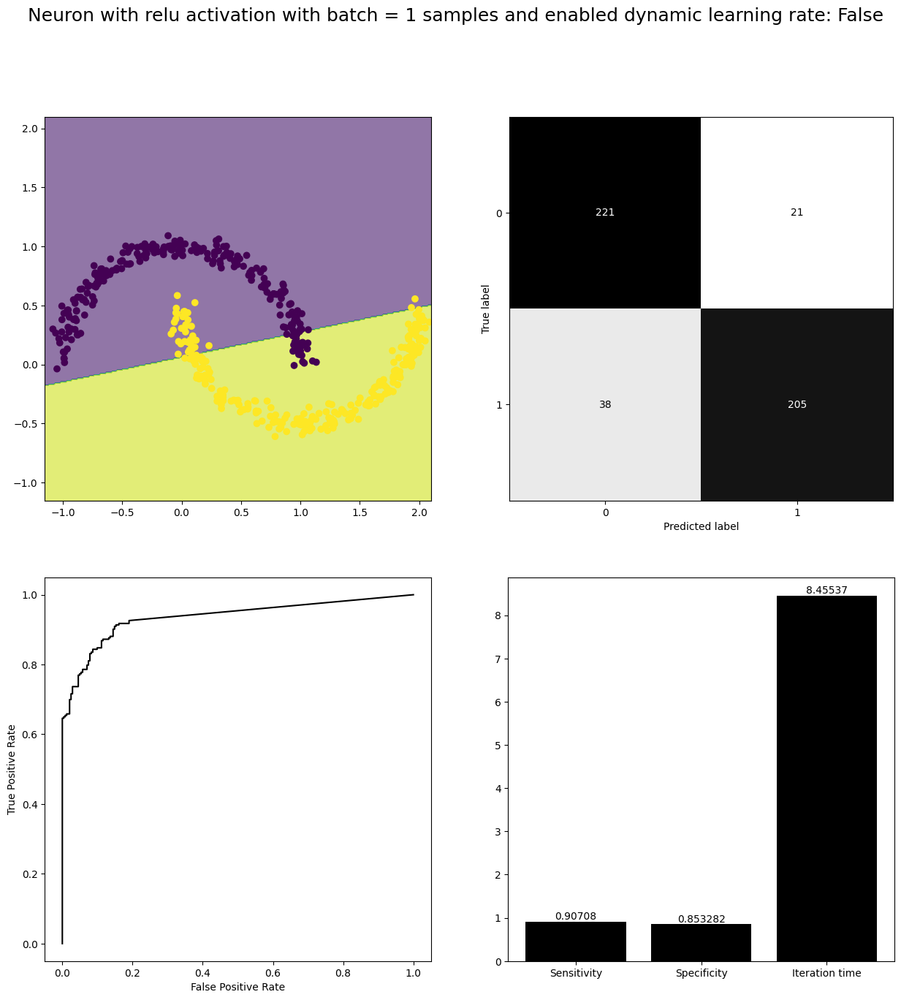

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


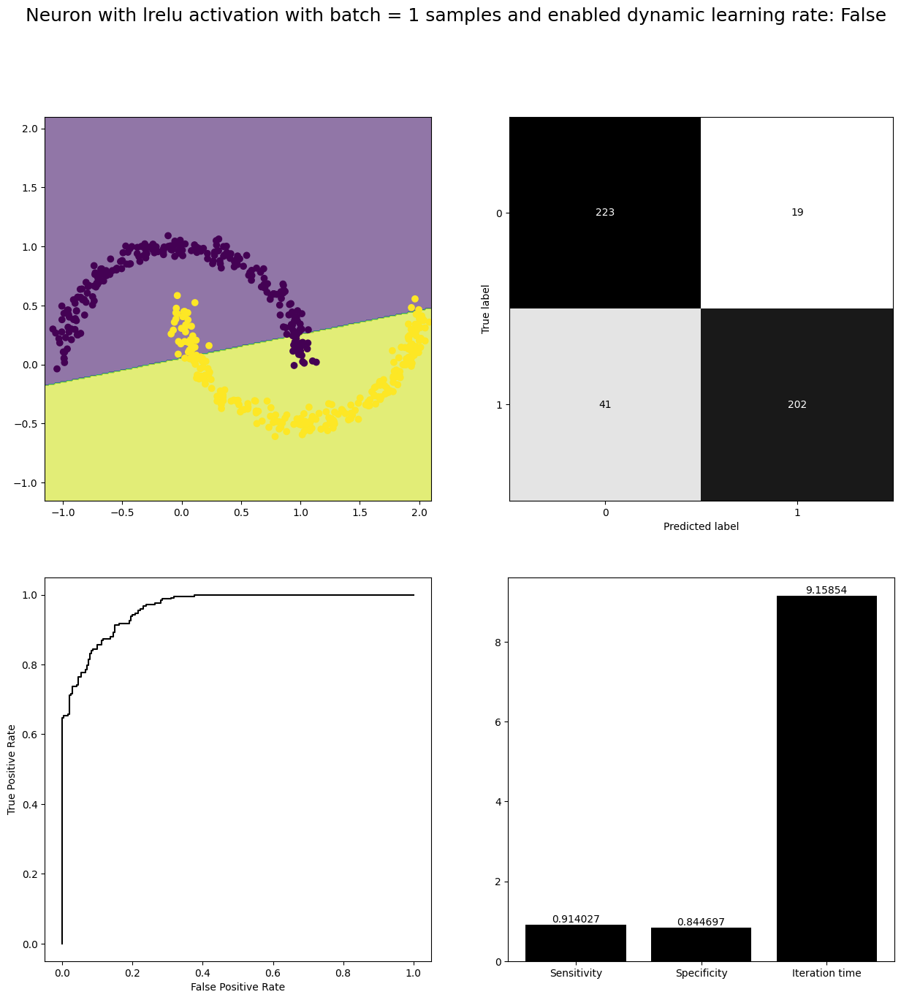

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


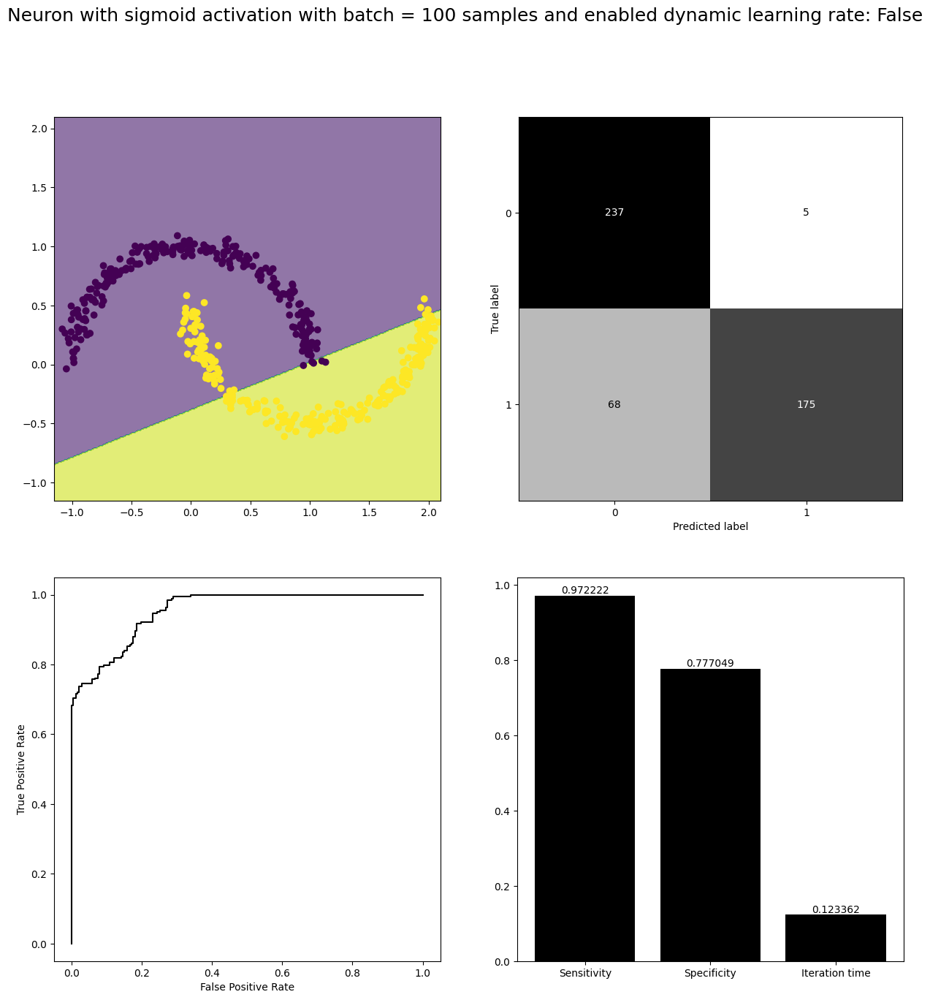

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


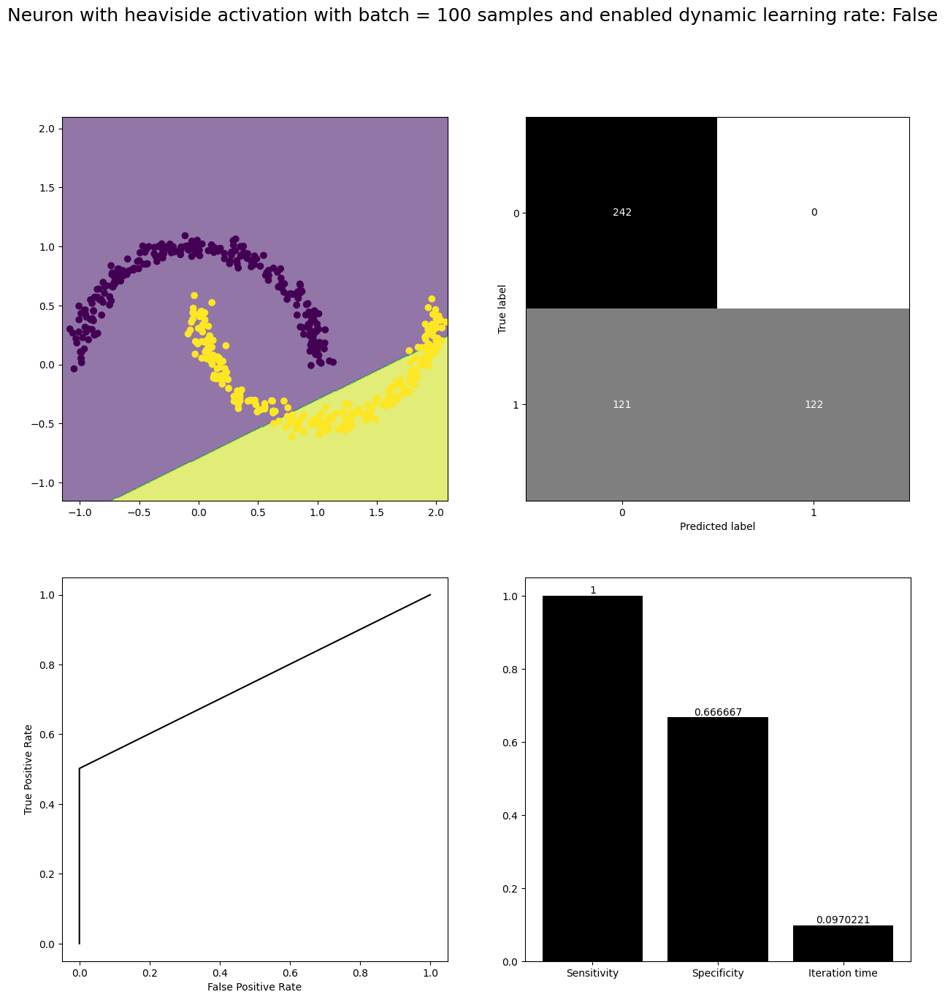

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


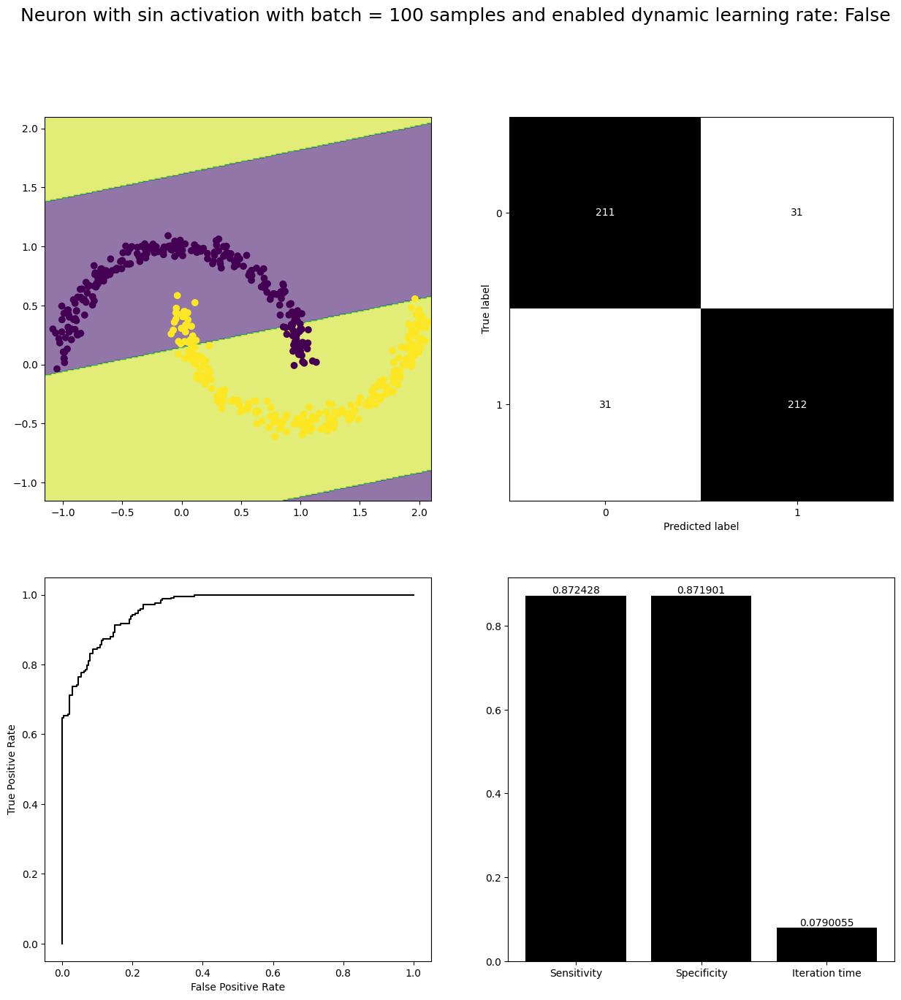

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


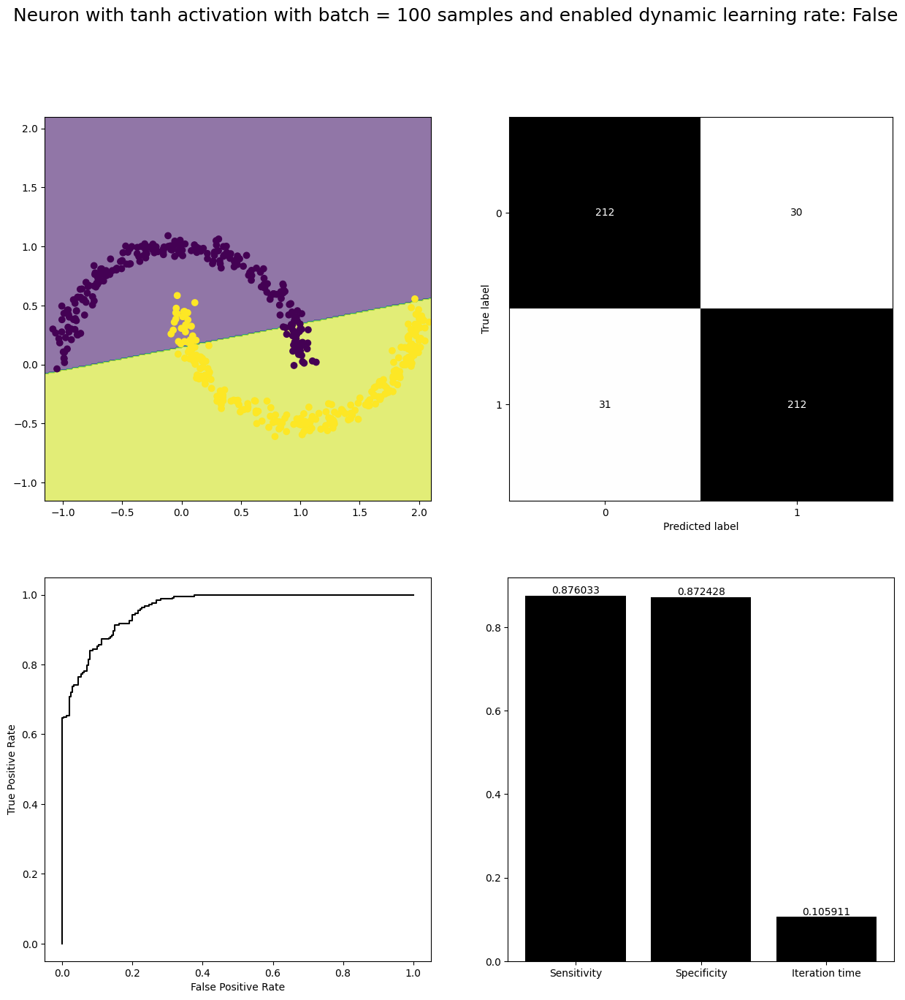

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


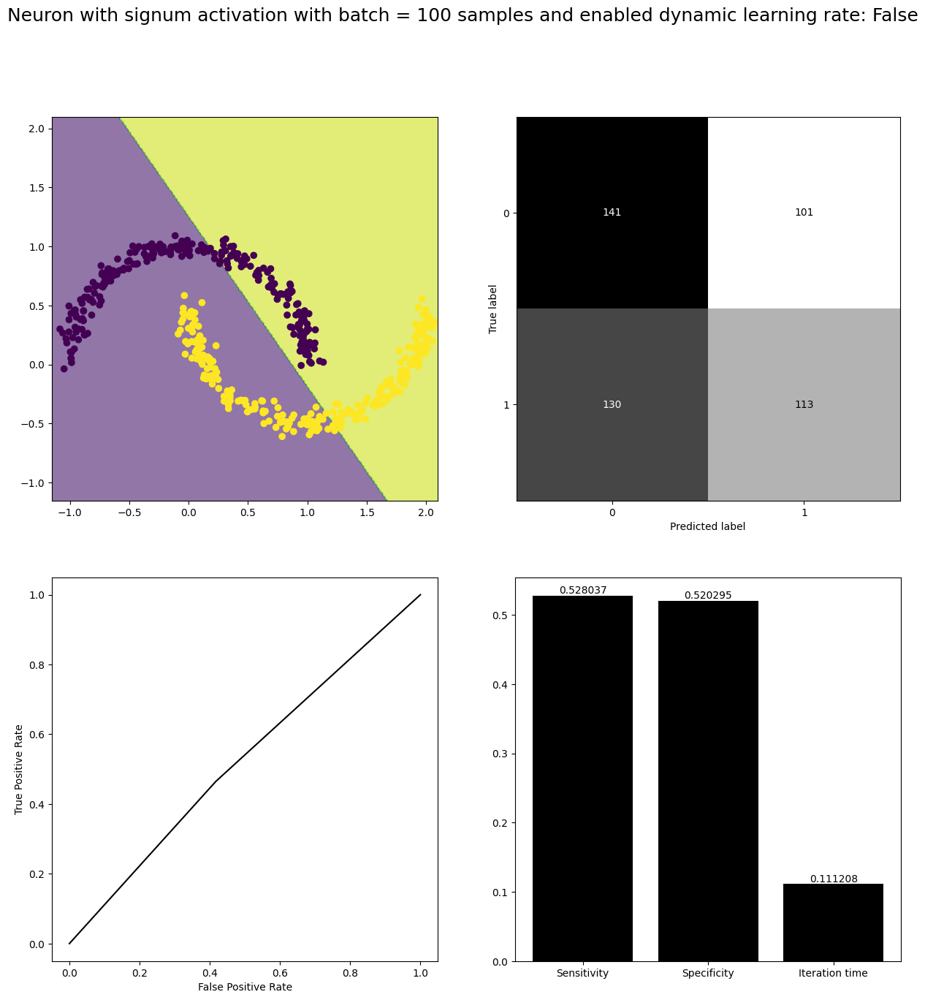

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


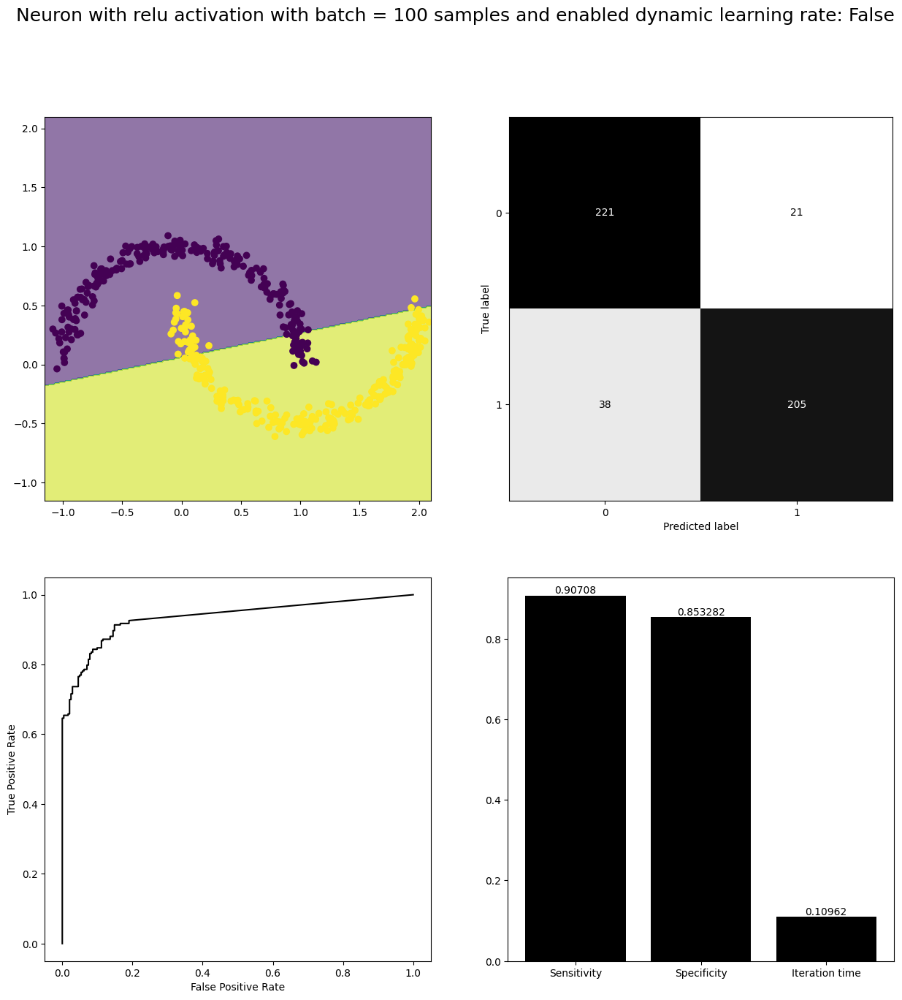

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


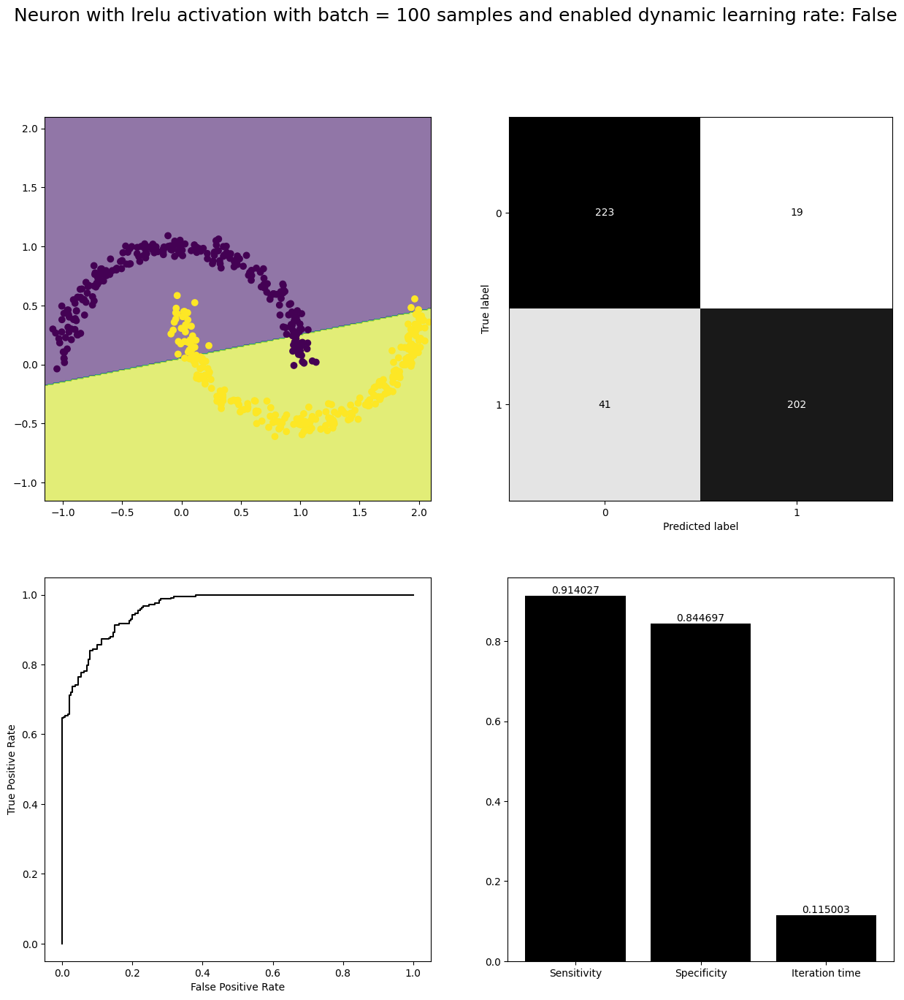

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


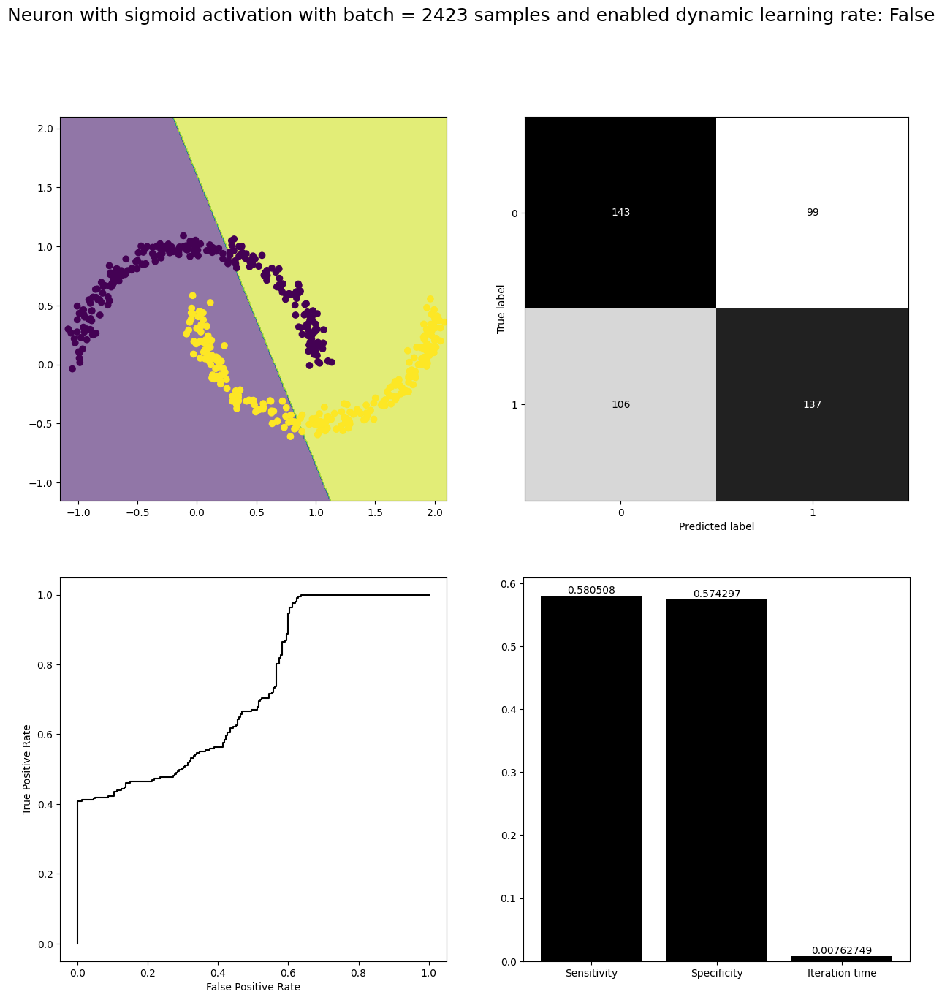

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


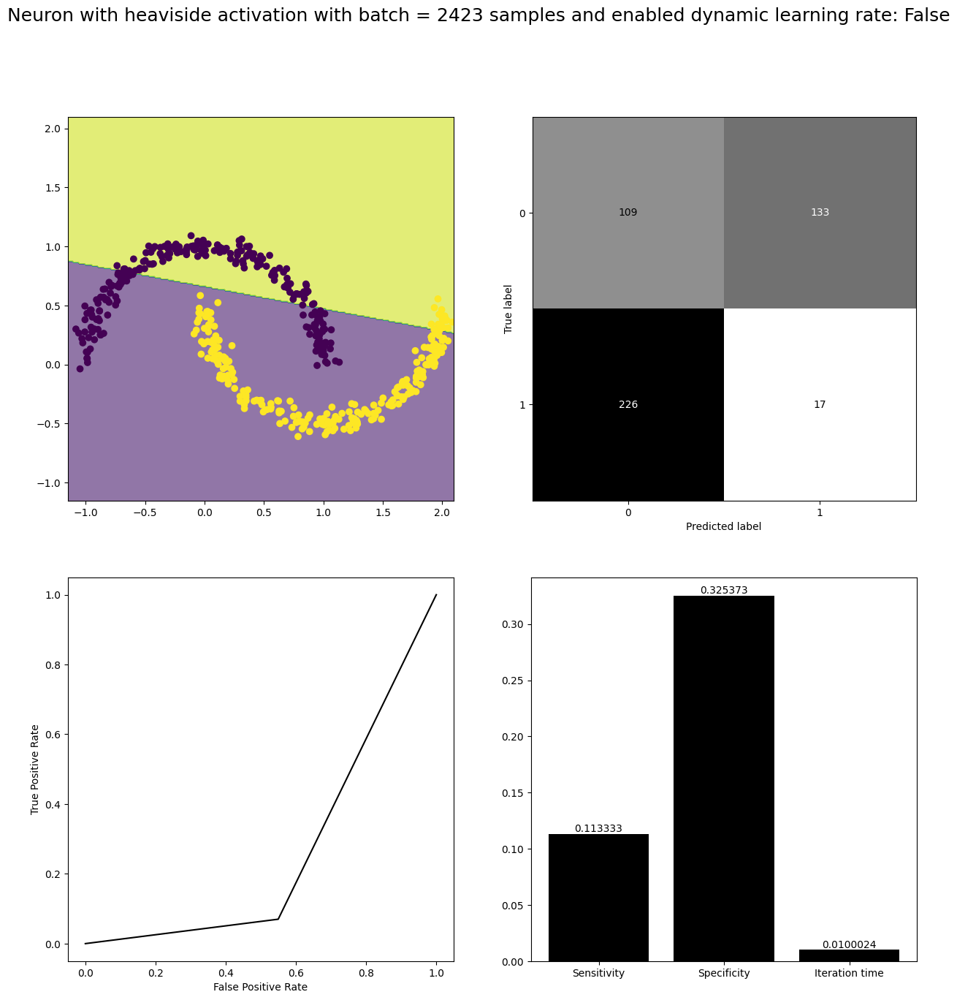

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


C:\Users\Jakub Kowalczewski\AppData\Local\Temp\ipykernel_11852\1018894150.py:196: RuntimeWarning: invalid value encountered in longlong_scalars
  tp_model / (tp_model + fn_model),


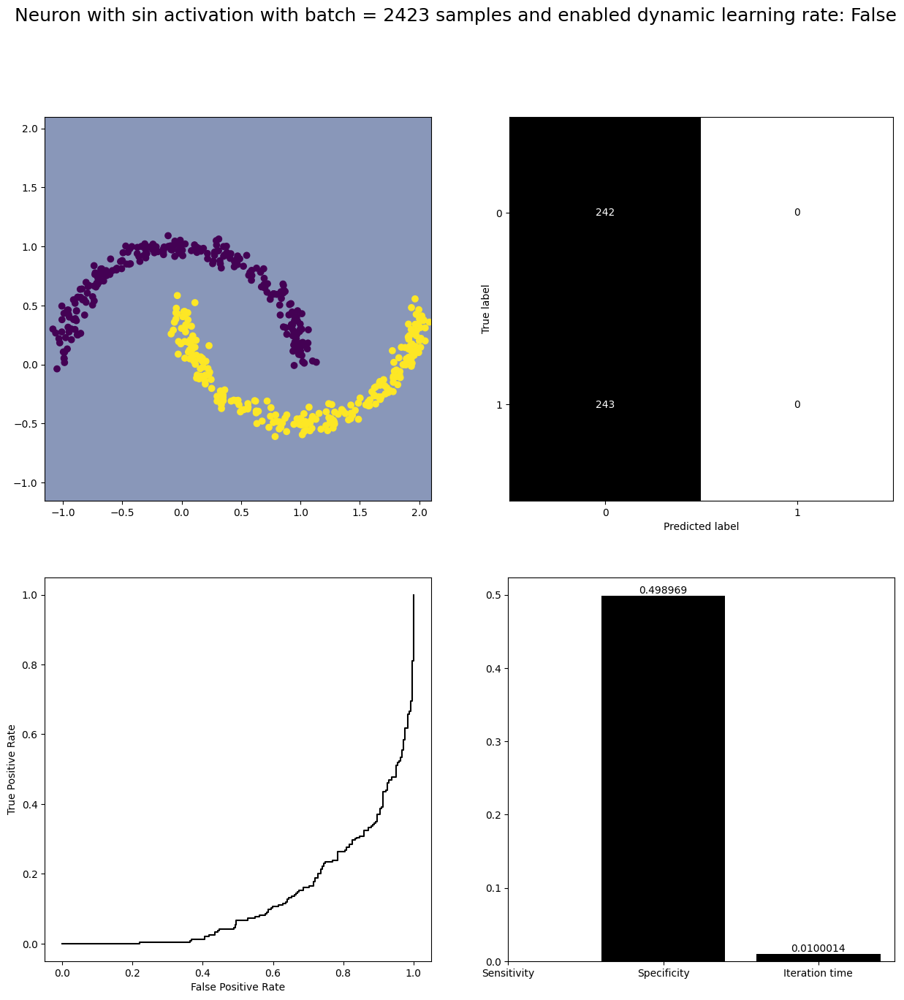

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


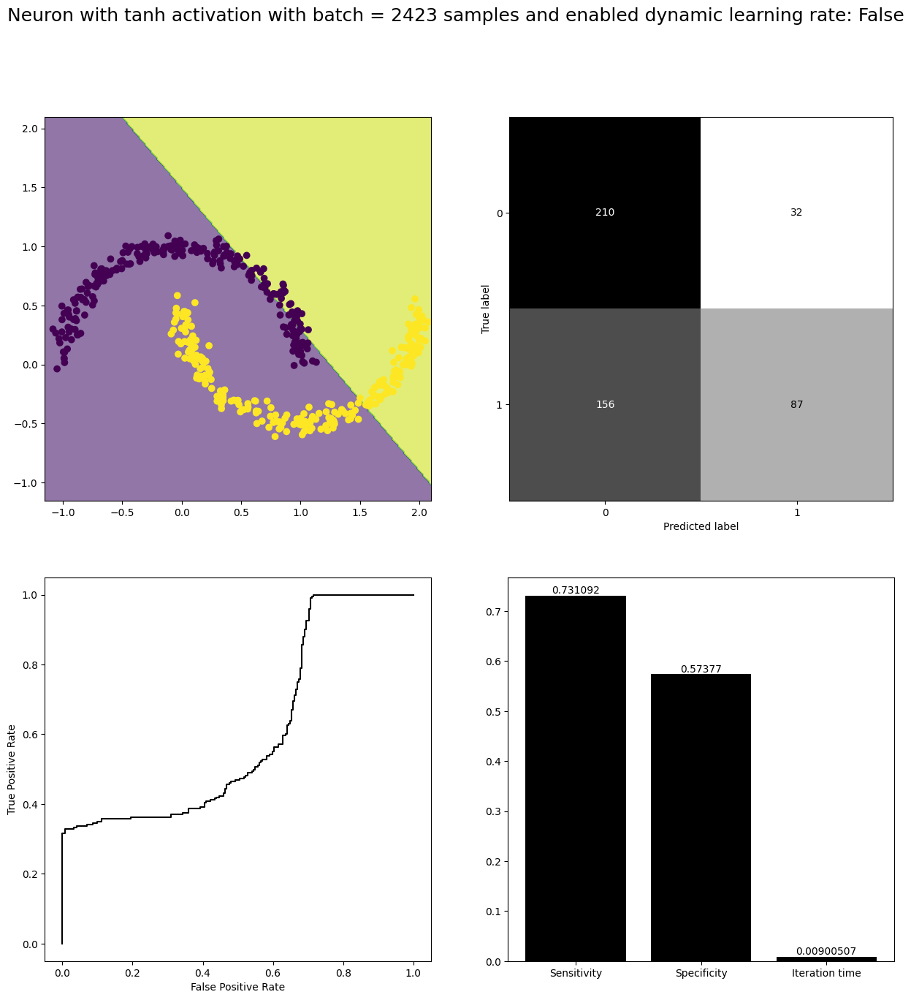

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


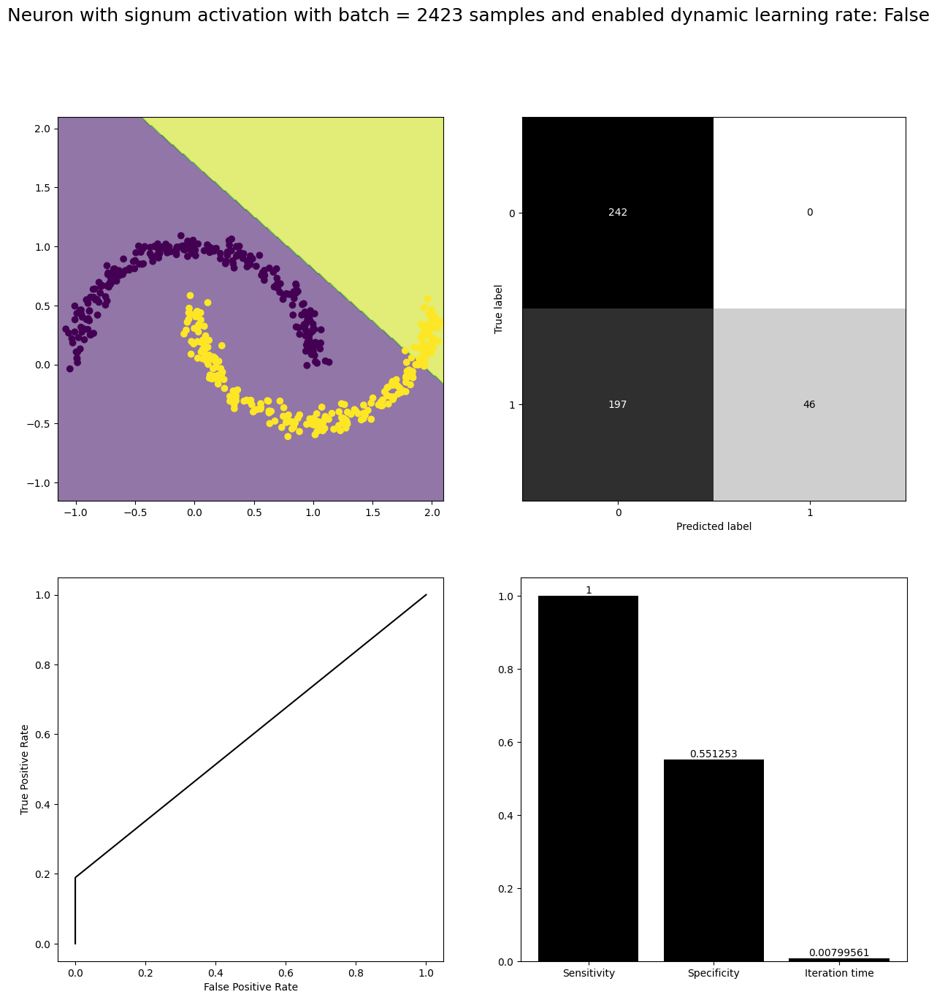

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


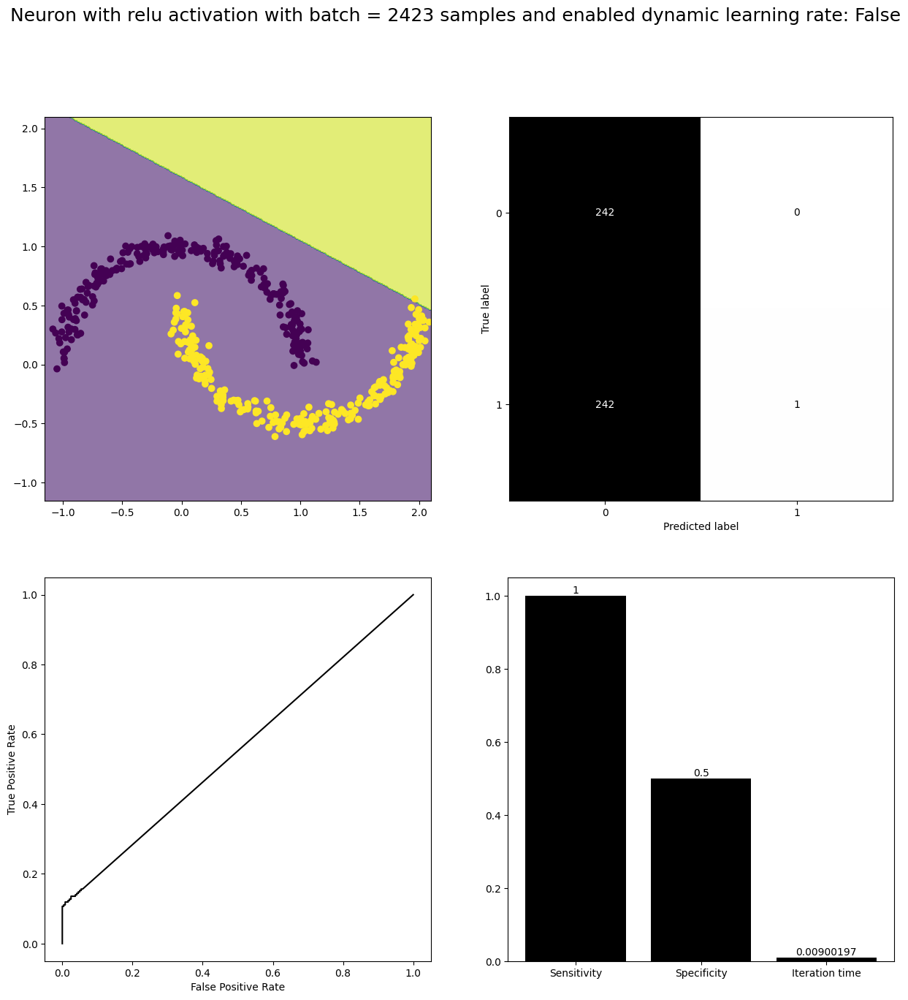

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


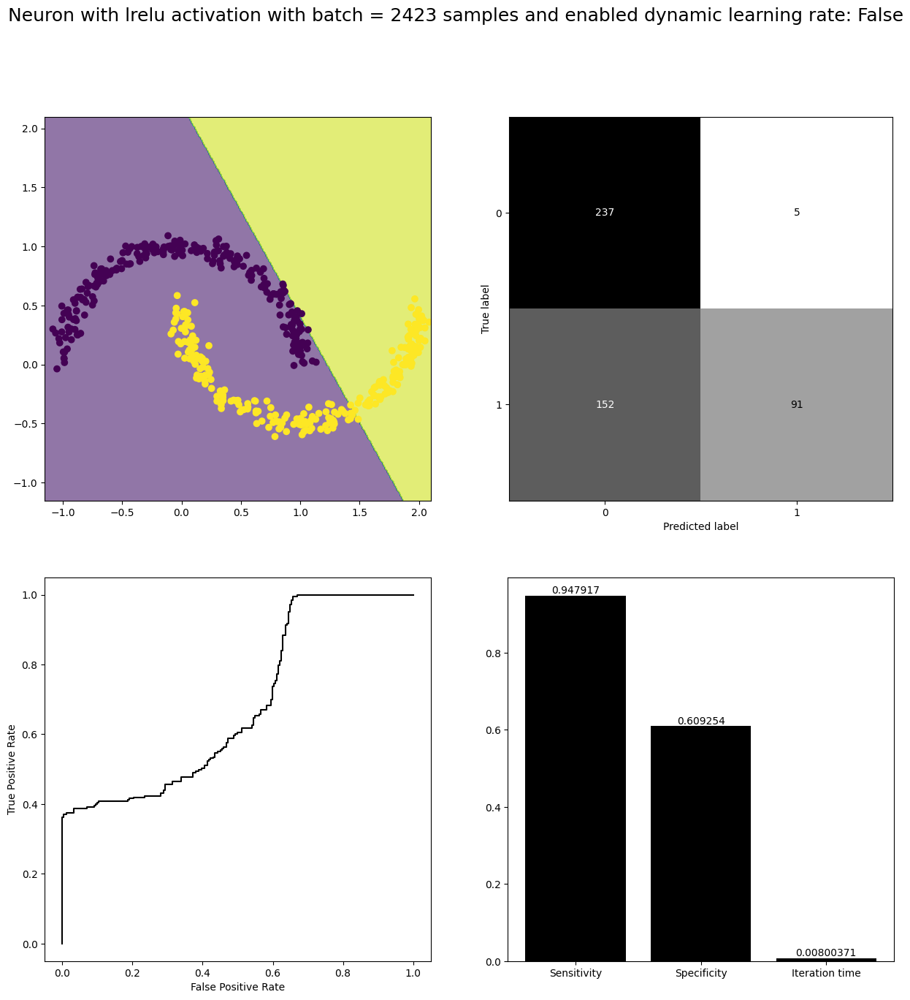

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


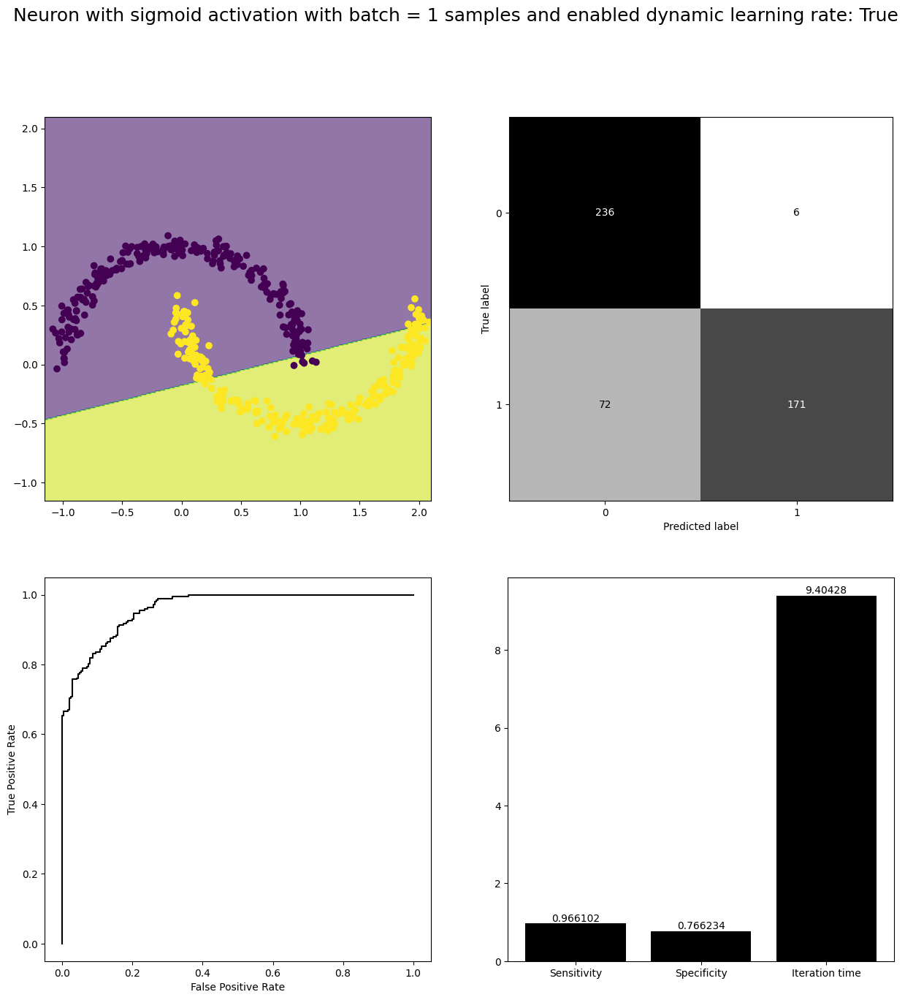

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


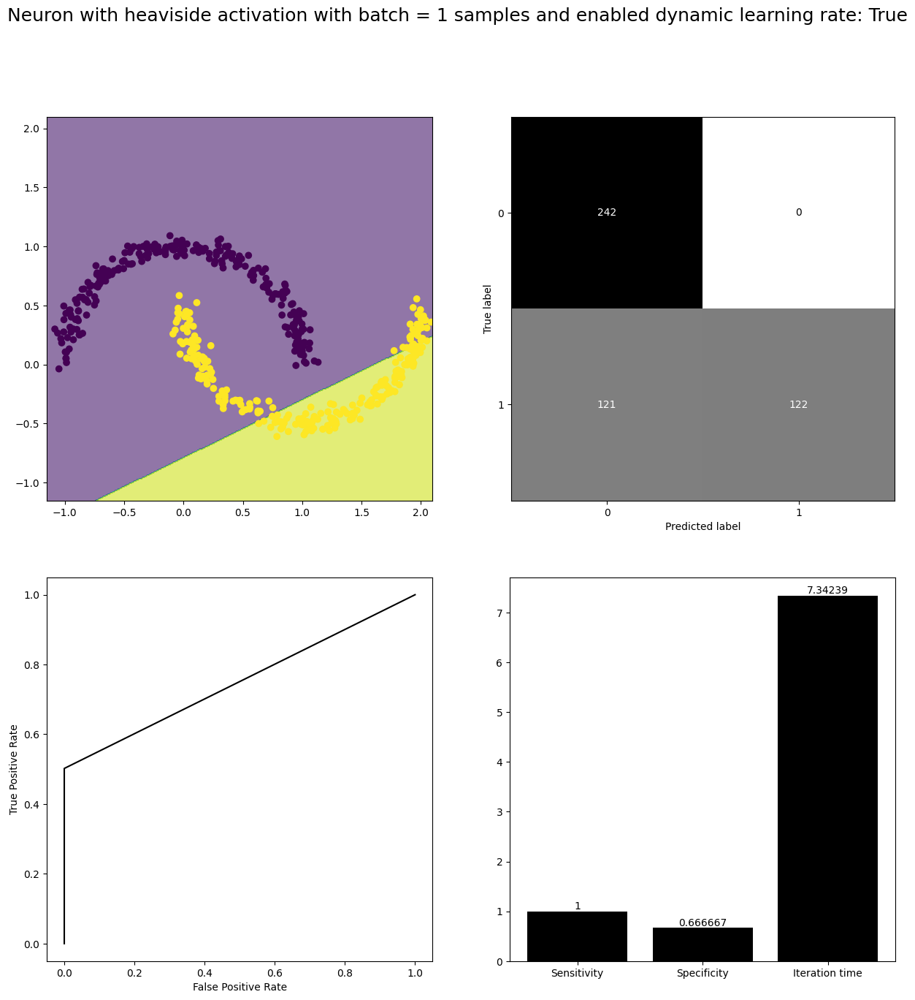

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


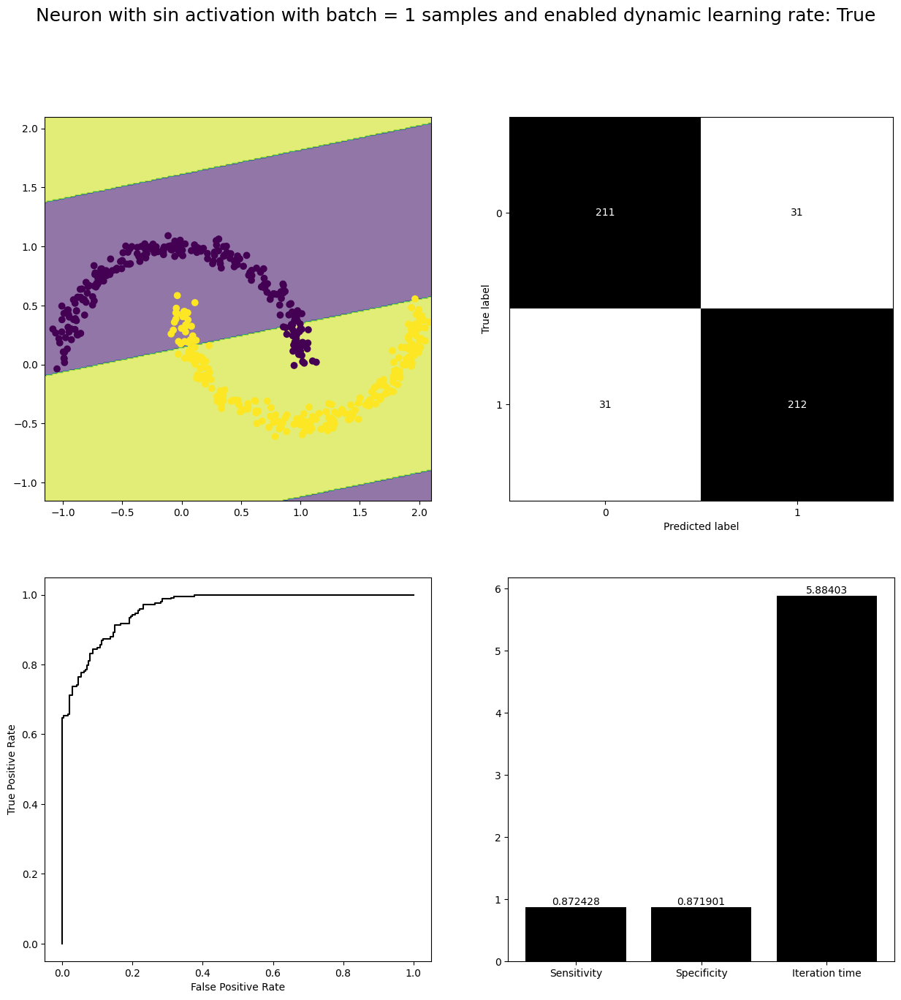

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


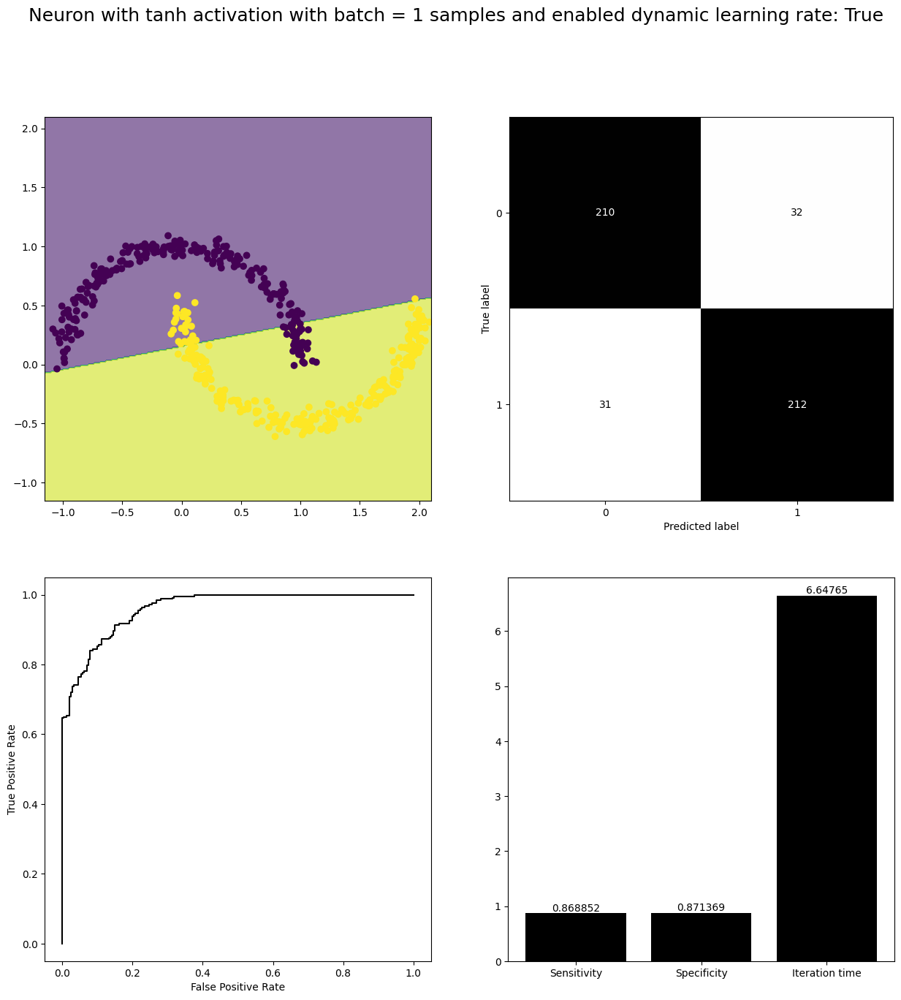

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


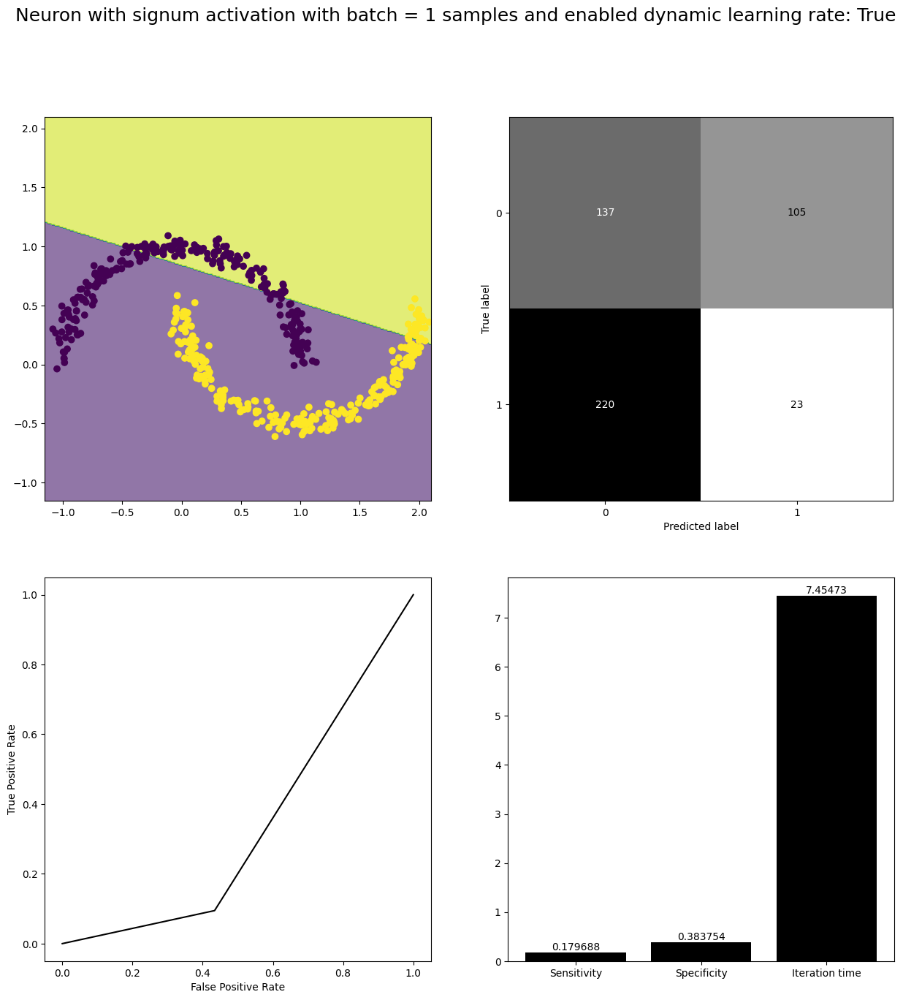

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


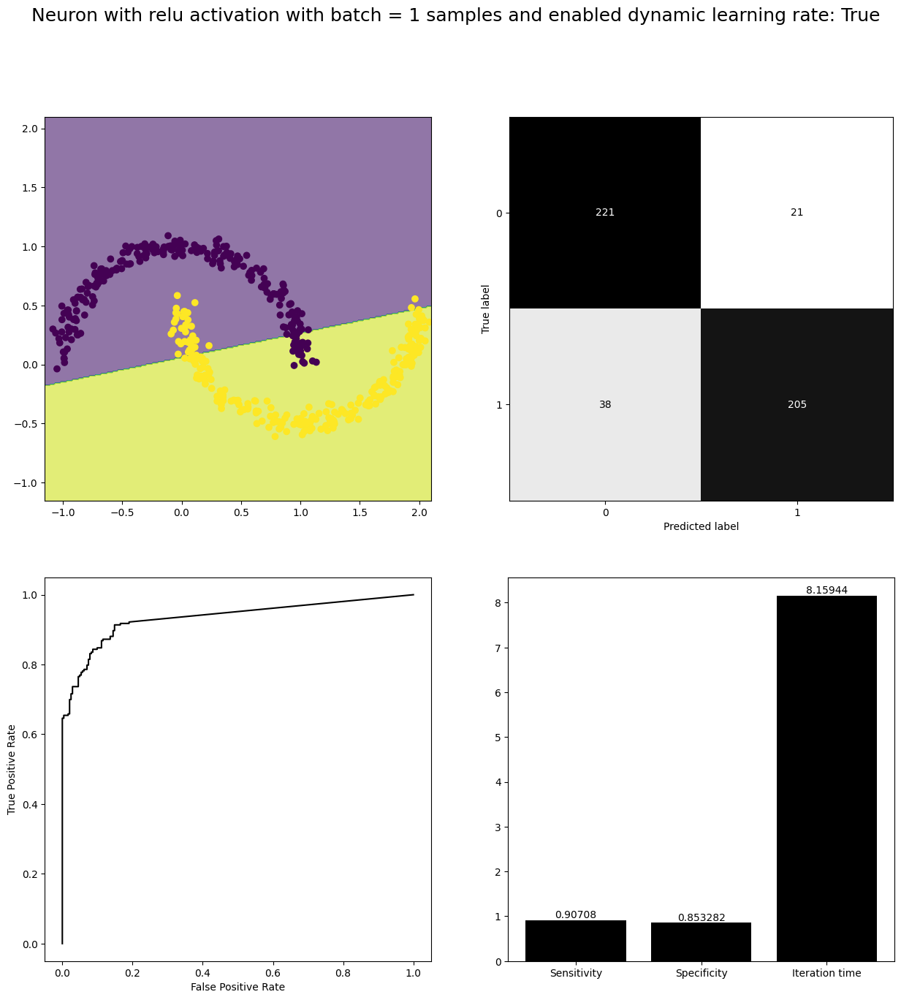

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


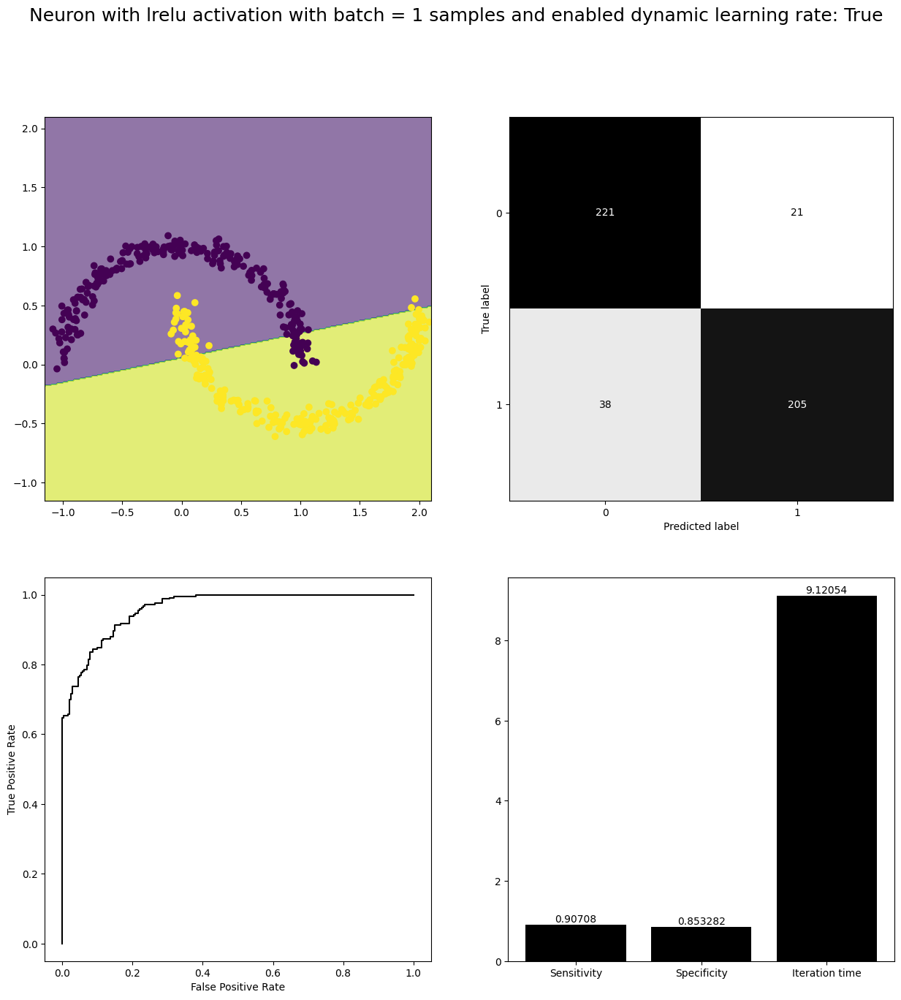

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


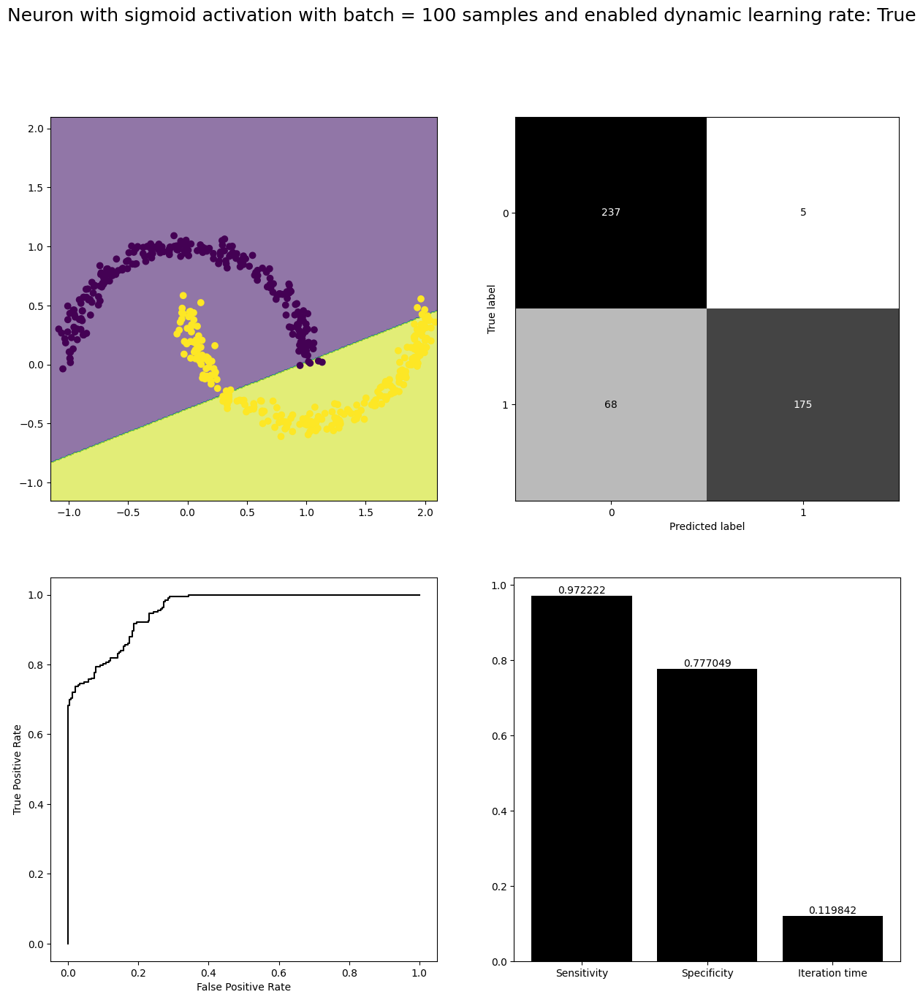

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


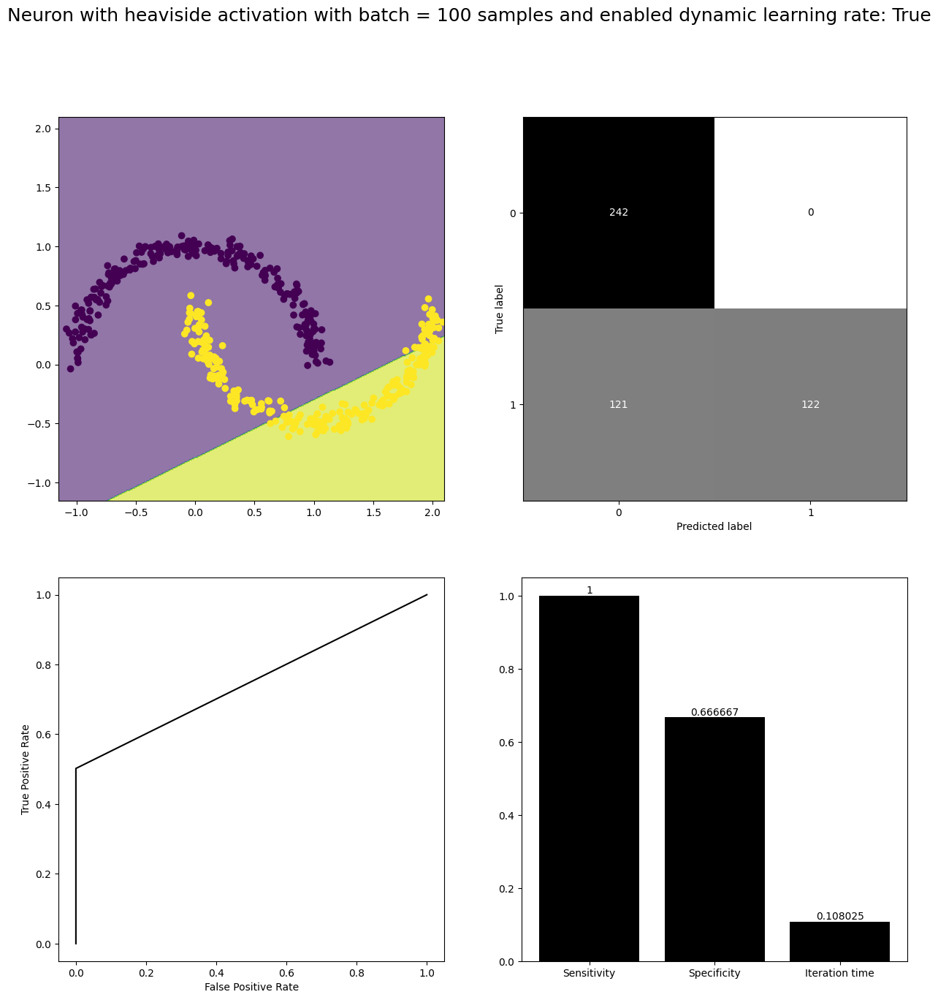

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


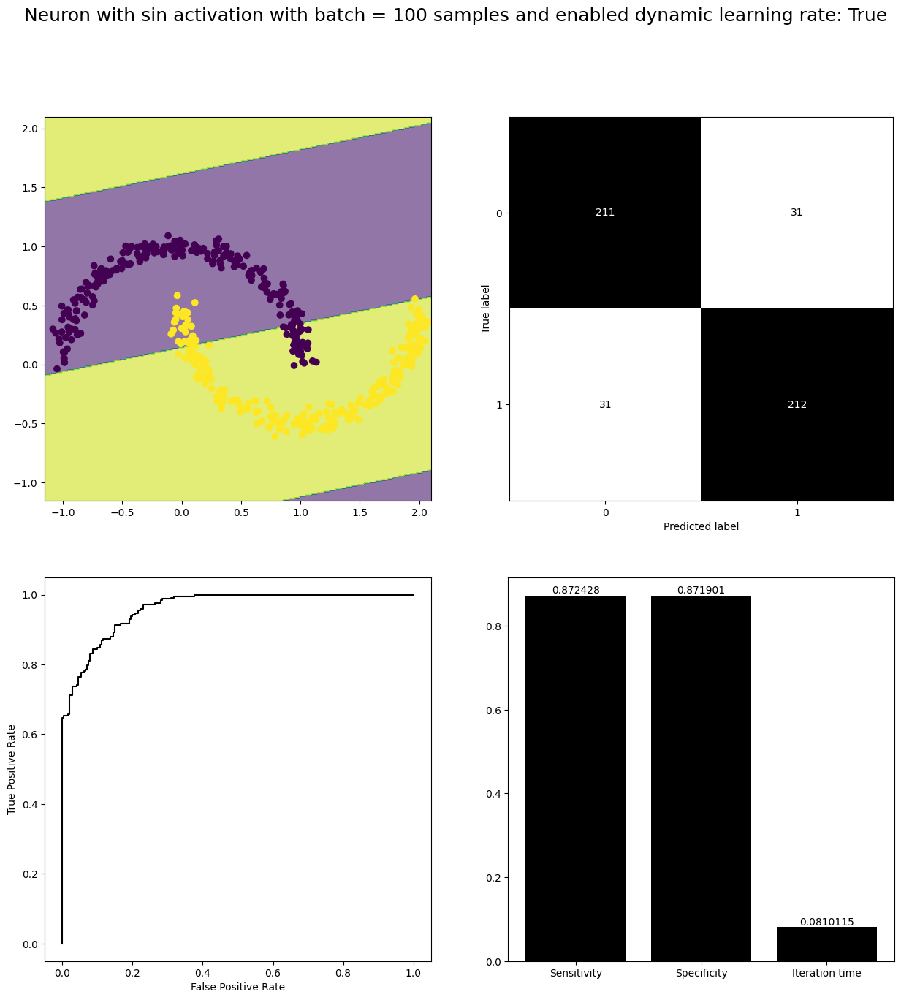

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


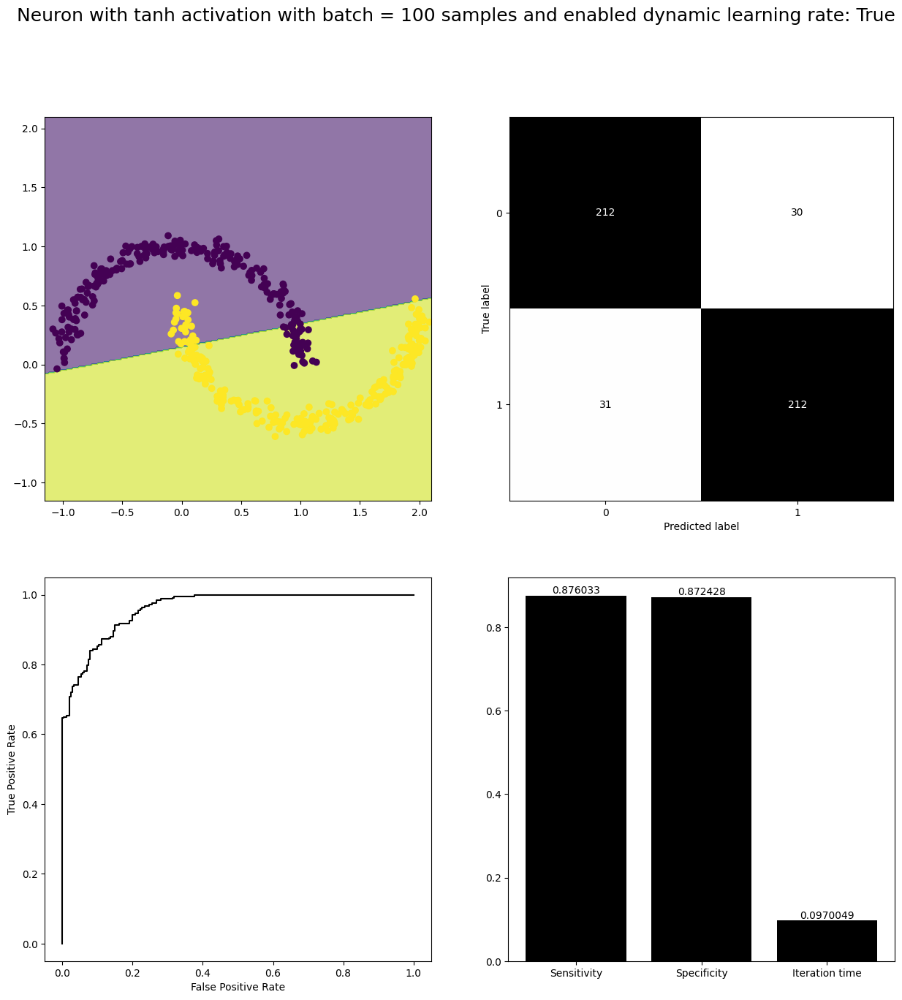

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


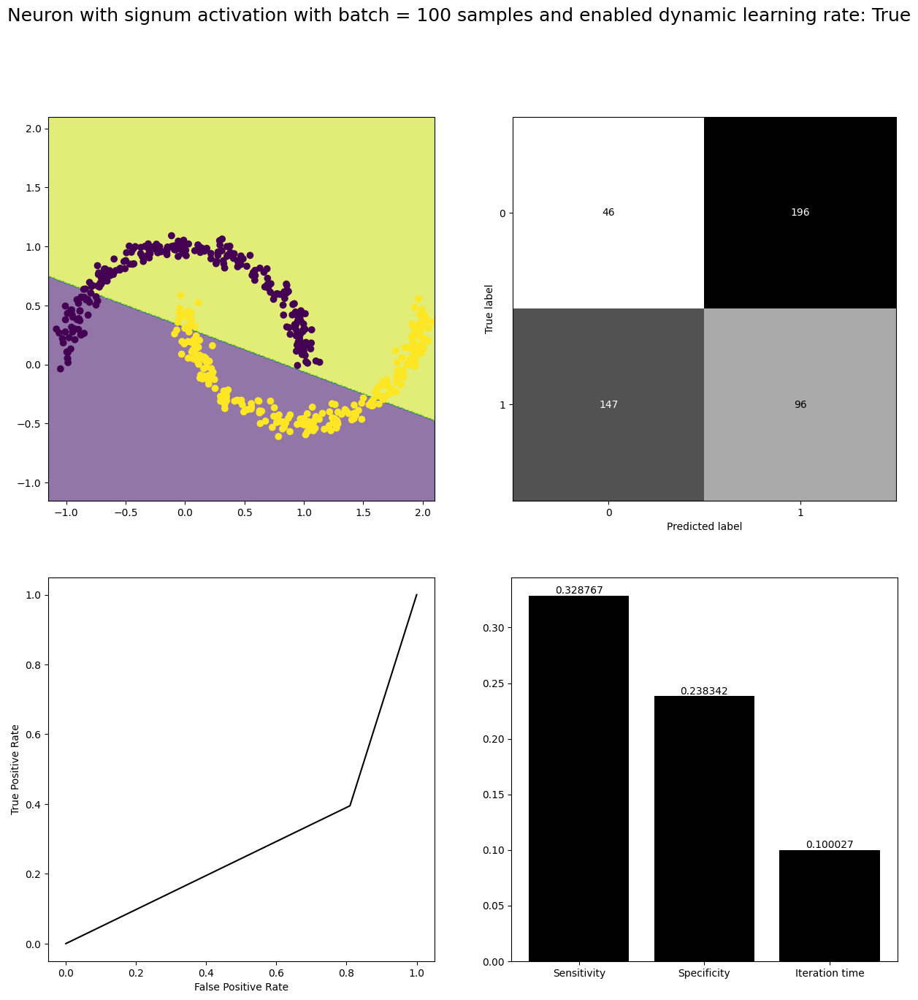

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


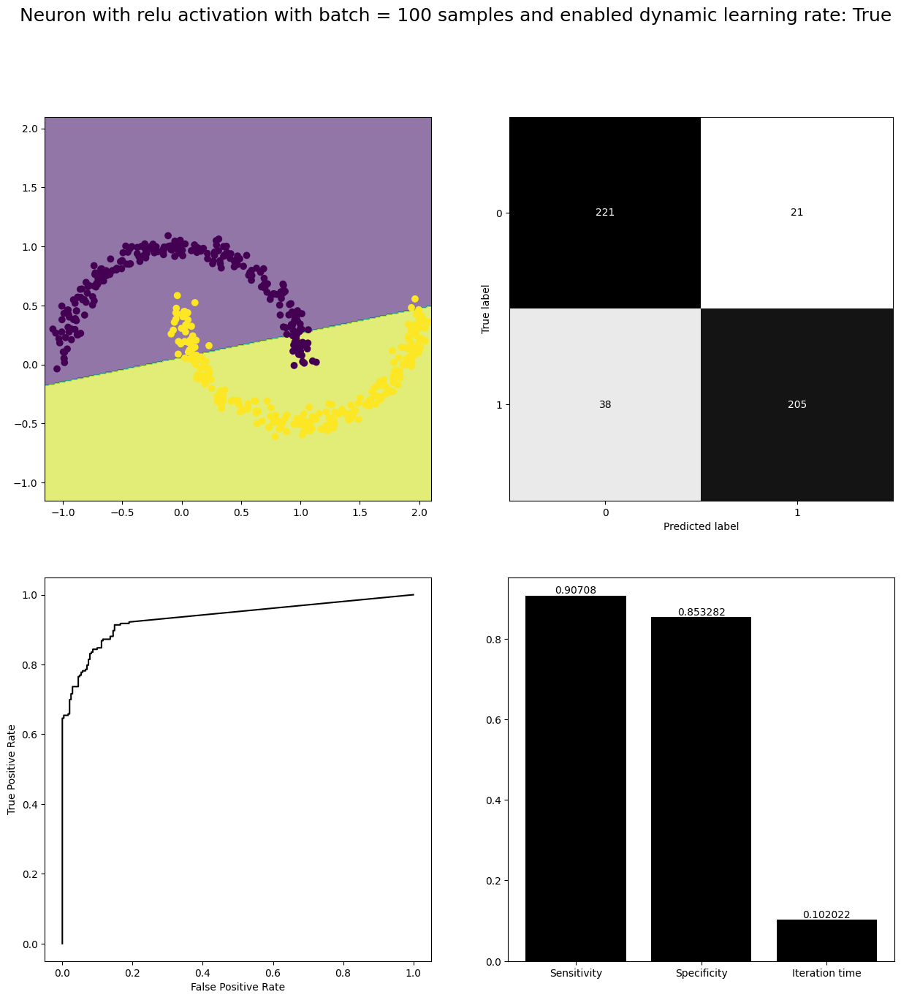

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


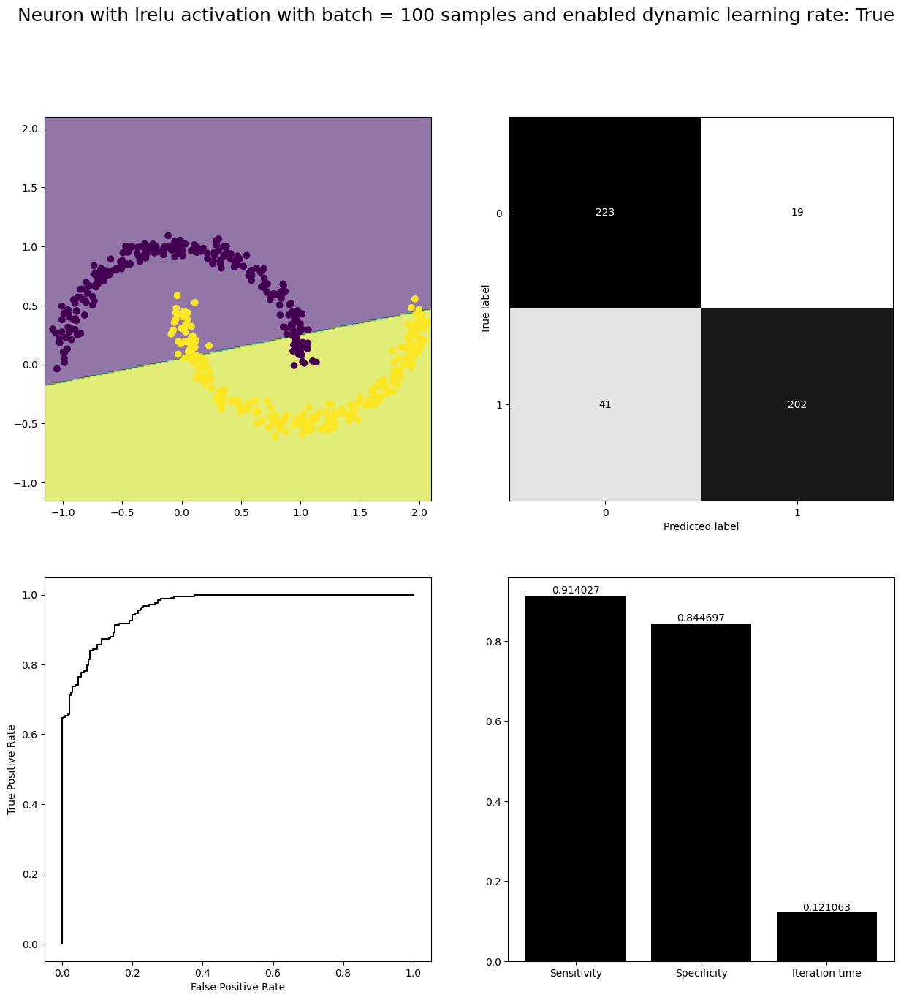

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


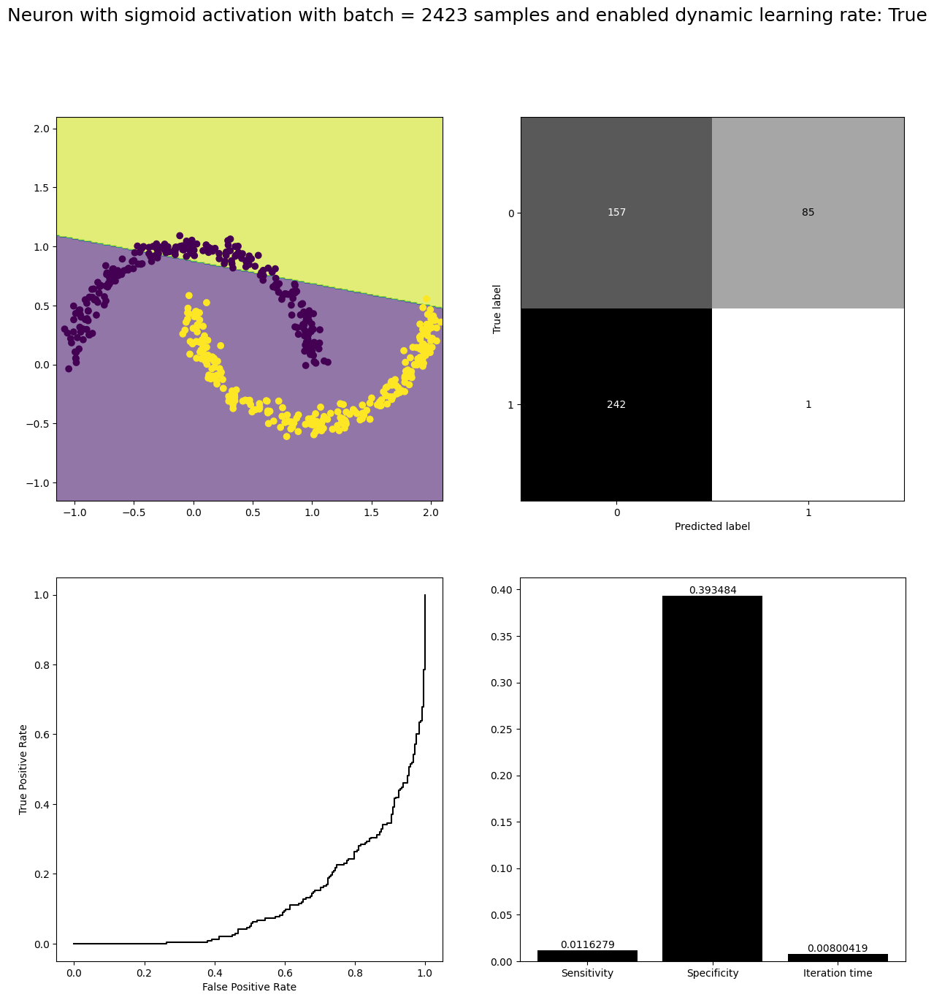

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


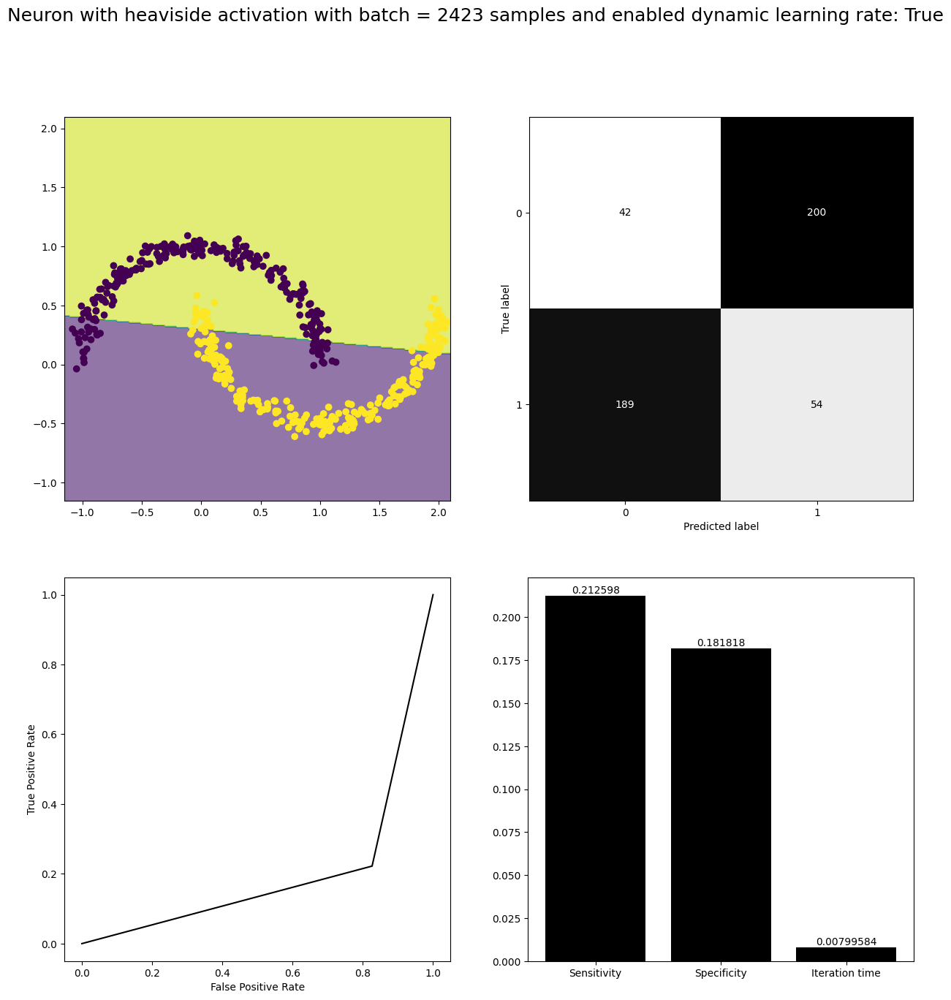

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


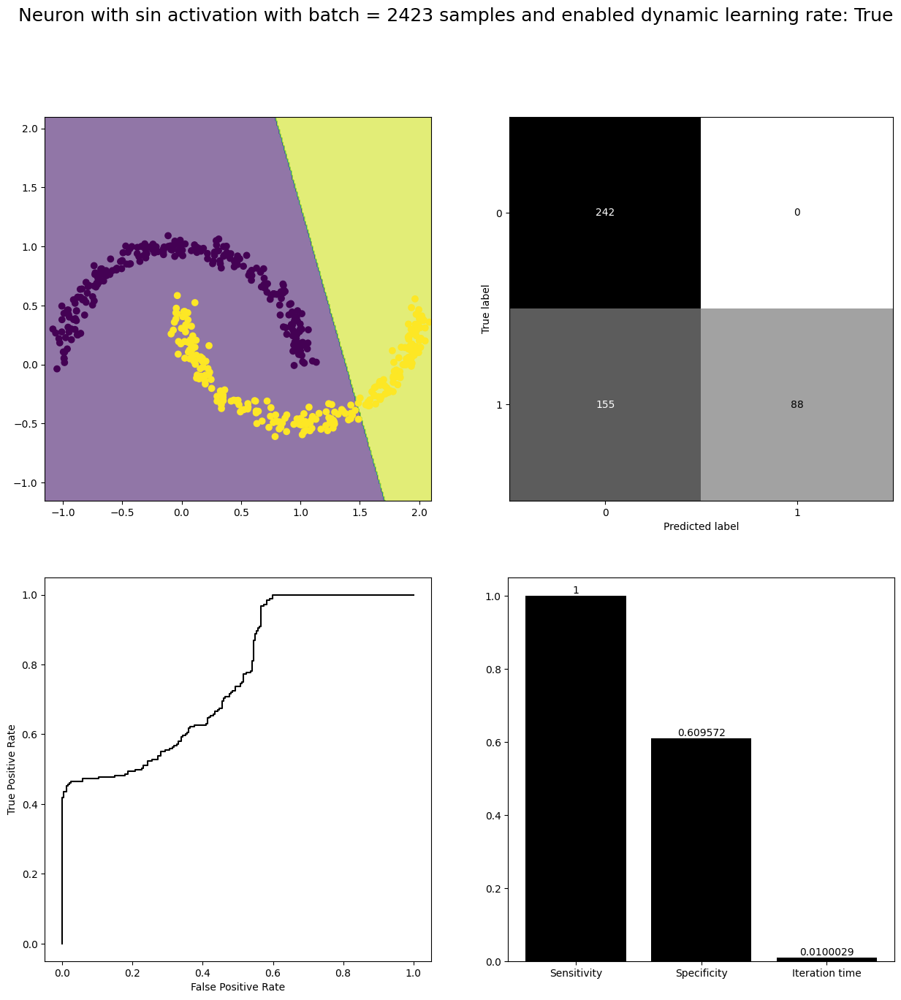

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


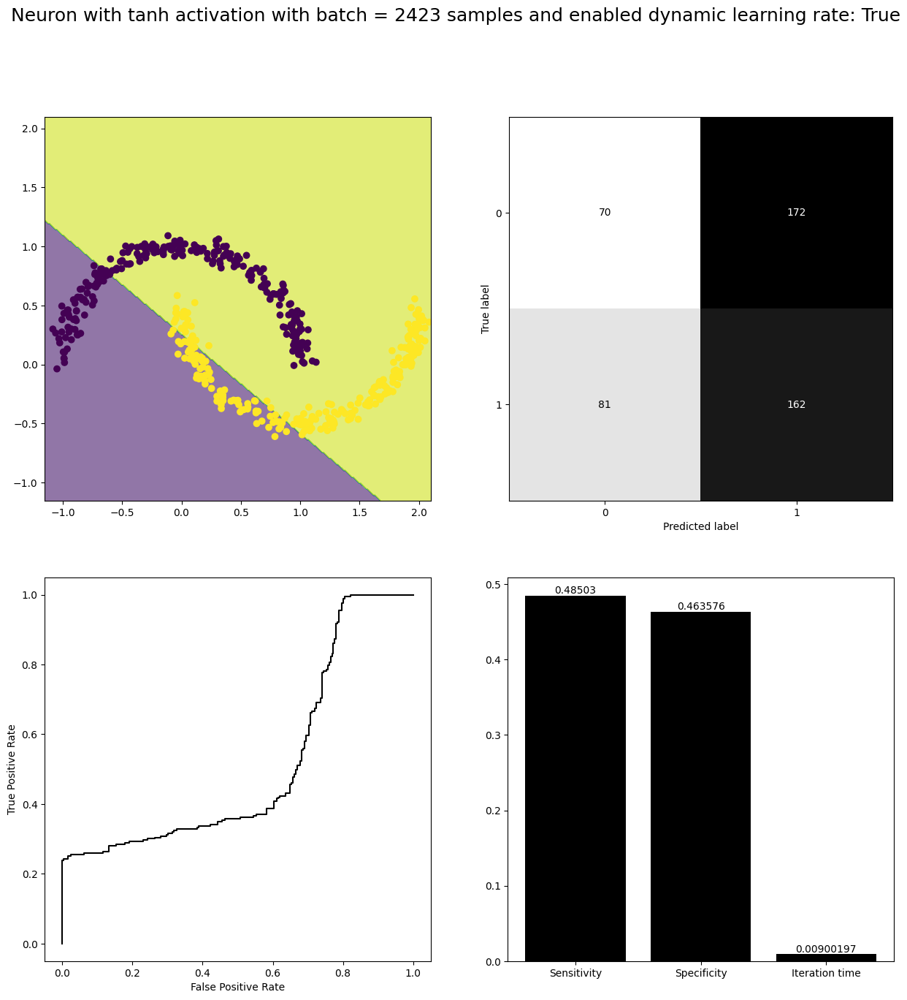

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


C:\Users\Jakub Kowalczewski\AppData\Local\Temp\ipykernel_11852\1018894150.py:196: RuntimeWarning: invalid value encountered in longlong_scalars
  tp_model / (tp_model + fn_model),


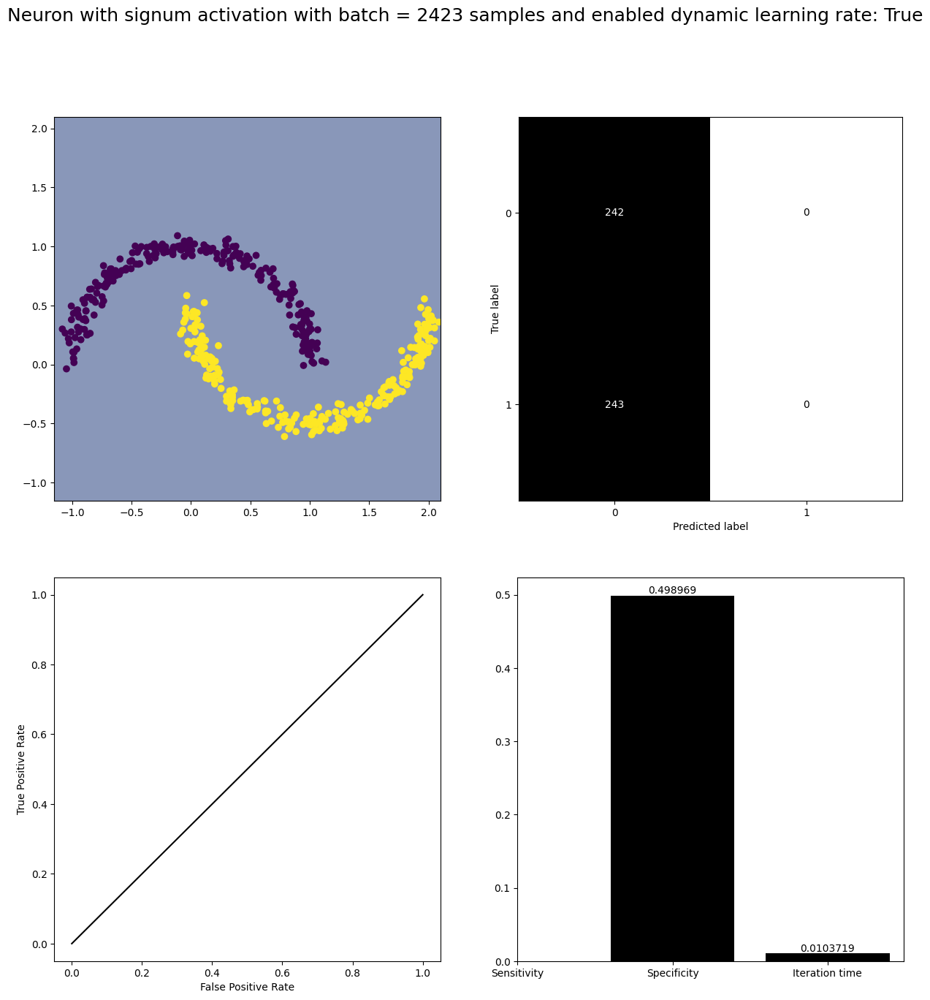

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


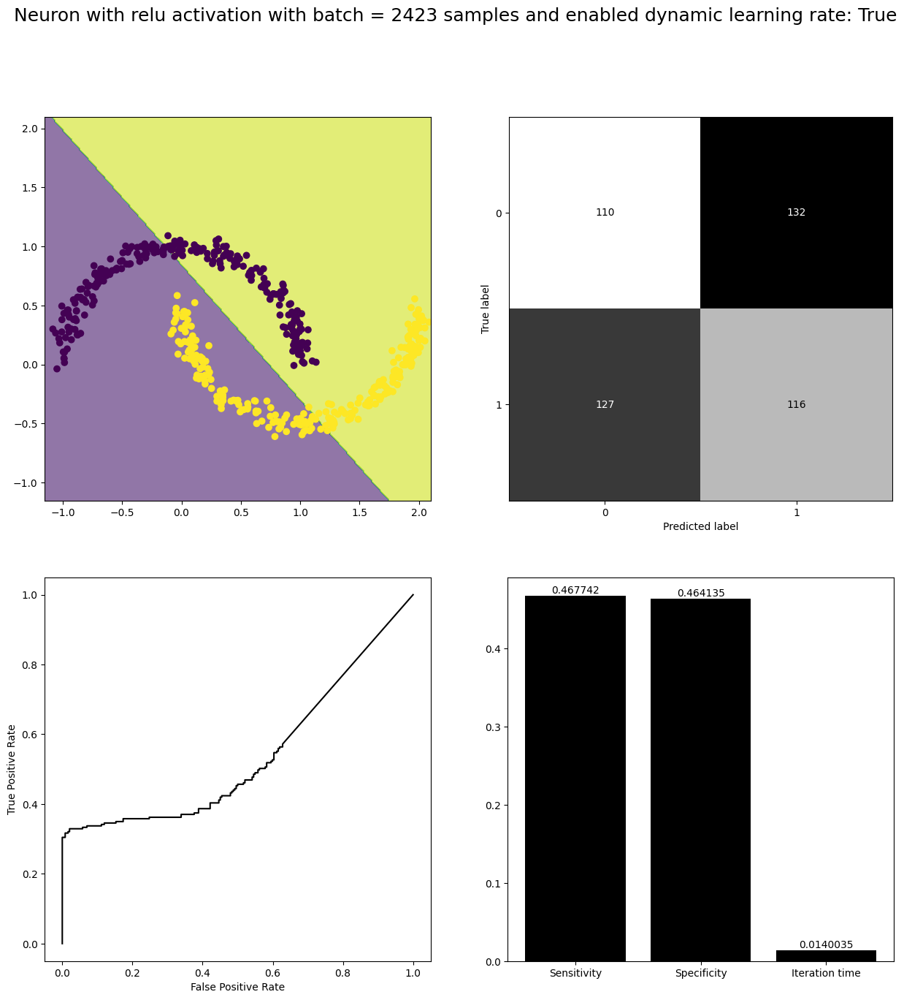

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


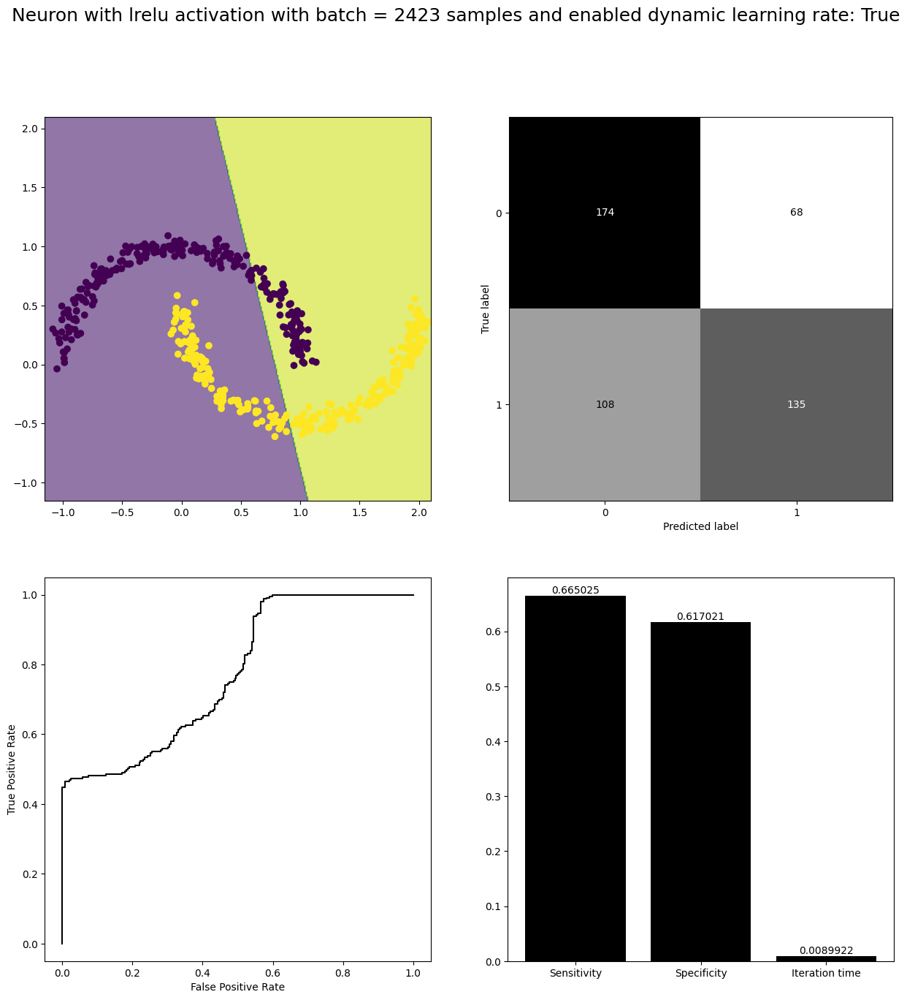

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------


In [17]:
for d in dynamic_learning:
    for b in batches:
        for m in method:
            name = 'Neuron with ' + str(m) + ' activation with batch = ' + str(b) + ' samples and enabled dynamic learning rate: ' + str(d)
            p = Neuron(m, 0.1, 100, b, dynamic_learning, 0.001, 0.1)
            show_result(p, x_train, y_train, x_test, y_test, name)
            print('-------------------------------------------------------------------------------------------------------------------------------------------------------------------------')


<h3 align="center"><font size="10">Wnioski</font></h3>

Wydajność neuronu w dużej mierze zależy od zastosowanej funkcji aktywacji. Najlepiej sprawdziły się funkcje sigmoid, tangens hiperboliczny, heaviside. W przykładzie z danymi wygenerowanymi z make_classification dawały modele o dużej specyficzności i czułości dopasowań. Modele sinus, relu i leaky relu nie dawały dobrych dopasowań mimo odpowiedniego dobrania parametru progowego funkcji aktywacji, co widać na wykresie konturowym.

Wielkość batcha w znacznym stopniu wpływa na czas iteracji modeli. Im batch zawiera więcej próbek ( w skrajnym przypadku wszystkie), tym czas iteracji uczenia jest szybszy. W przypadku gdy batch ma rozmiar jednej próbki czas ten wynosi kilka sekund dla 100 epok uczenia, w przypadku wszystkich próbek w jednym batchu - milisekundy. Jest to różnica o 6 rzędów wielkości. W porównaniu z innymi modelami uczenia maszynowego neuron uczy się bardzo szybko z dostatecznie dobrymi metrykami jego wydajności.

Widać też wyraźnie, że pojedynczy neuron nie jest dostosowany do rozwiązywania problemów nieseparowalnych linowo - można obserwować ten efekt w przypadku dopasowań modelu do datasetu wygenerowanego z make_moons.